- Surprise Housing has decided to enter the Australian market

- The company uses data to purchase houses at a price below their actual values and flip them on at a higher price.

- build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not

- Company wants to know:
    - Which variables are significant in predicting the price of a house
    - How well those variables describe the price of a house.
    


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split as tts
from sklearn.feature_selection import RFE
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
import sklearn.metrics as metrics

from sklearn.feature_selection import RFE
from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
pd.set_option('display.float_format', lambda x: '%.9f' % x)

In [2]:
pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows',500)

In [3]:
ls

 Volume in drive F is HimanshuB
 Volume Serial Number is 60B9-FED0

 Directory of F:\Python Works\Surprise-Housing-main

01-06-2022  17:09    <DIR>          .
01-06-2022  17:09    <DIR>          ..
01-06-2022  17:12    <DIR>          .ipynb_checkpoints
01-06-2022  16:38            13,370 data_description.txt
01-06-2022  16:38                18 README.md
02-06-2022  17:40        11,286,188 Surprise Housing.ipynb
01-06-2022  16:38               161 Tasks To Do.txt
01-06-2022  16:38           460,676 train.csv
               5 File(s)     11,760,413 bytes
               3 Dir(s)  1,877,686,616,064 bytes free


In [4]:
df=pd.read_csv('train.csv')

In [5]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000000000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000000000,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.000000000,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000000000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.000000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000000000,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000000000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000000000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000000000,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000000000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000000000,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000000000,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000000000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000000000,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000000000,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
print(df.shape)
print("-"*40)
df.info(memory_usage=True,verbose=True,show_counts=True)

(1460, 81)
----------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  

## Anomaly Detection and Treatment

In [7]:
#Missing Values percentages in the columns
#Fence, MiscFeature,PoolQC, Alley are the variables which have more than 80% of missing data.
#Need to know are those on random before dropping them
(df.isna().sum()/df.isnull().count()*100)[df.isna().sum()>0]

LotFrontage    17.739726027
Alley          93.767123288
MasVnrType      0.547945205
MasVnrArea      0.547945205
BsmtQual        2.534246575
BsmtCond        2.534246575
BsmtExposure    2.602739726
BsmtFinType1    2.534246575
BsmtFinType2    2.602739726
Electrical      0.068493151
FireplaceQu    47.260273973
GarageType      5.547945205
GarageYrBlt     5.547945205
GarageFinish    5.547945205
GarageQual      5.547945205
GarageCond      5.547945205
PoolQC         99.520547945
Fence          80.753424658
MiscFeature    96.301369863
dtype: float64

In [8]:
(df.isna().sum()/df.shape[0])[df.isna().sum()>0].index.values

array(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'], dtype=object)

In [9]:
#Data Types for Missing Values Columns
df.loc[:,['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature']].dtypes

LotFrontage     float64
Alley            object
MasVnrType       object
MasVnrArea      float64
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
BsmtFinType2     object
Electrical       object
FireplaceQu      object
GarageType       object
GarageYrBlt     float64
GarageFinish     object
GarageQual       object
GarageCond       object
PoolQC           object
Fence            object
MiscFeature      object
dtype: object

In [10]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000000,1460.000000000,1201.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1452.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1379.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000
mean,730.500000000,56.897260274,70.049958368,10516.828082192,6.099315068,5.575342466,1971.267808219,1984.865753425,103.685261708,443.639726027,46.549315068,567.240410959,1057.429452055,1162.626712329,346.992465753,5.844520548,1515.463698630,0.425342466,0.057534247,1.565068493,0.382876712,2.866438356,1.046575342,6.517808219,0.613013699,1978.506163887,1.767123288,472.980136986,94.244520548,46.660273973,21.954109589,3.409589041,15.060958904,2.758904110,43.489041096,6.321917808,2007.815753425,180921.195890411
std,421.610009369,42.300570994,24.284751774,9981.264932379,1.382996547,1.112799337,30.202904043,20.645406808,181.066206587,456.098090841,161.319272807,441.866955292,438.705324459,386.587738041,436.528435886,48.623081434,525.480383423,0.518910606,0.238752646,0.550915801,0.502885381,0.815778044,0.220338198,1.625393291,0.644666386,24.689724769,0.747315010,213.804841453,125.338794352,66.256027677,61.119148602,29.317330557,55.757415282,40.177306945,496.123024458,2.703626208,1.328095121,79442.502882887
min,1.000000000,20.000000000,21.000000000,1300.000000000,1.000000000,1.000000000,1872.000000000,1950.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,334.000000000,0.000000000,0.000000000,334.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,2.000000000,0.000000000,1900.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,1.000000000,2006.000000000,34900.000000000
25%,365.750000000,20.000000000,59.000000000,7553.500000000,5.000000000,5.000000000,1954.000000000,1967.000000000,0.000000000,0.000000000,0.000000000,223.000000000,795.750000000,882.000000000,0.000000000,0.000000000,1129.500000000,0.000000000,0.000000000,1.000000000,0.000000000,2.000000000,1.000000000,5.000000000,0.000000000,1961.000000000,1.000000000,334.500000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,5.000000000,2007.000000000,129975.000000000
50%,730.500000000,50.000000000,69.000000000,9478.500000000,6.000000000,5.000000000,1973.000000000,1994.000000000,0.000000000,383.500000000,0.000000000,477.500000000,991.500000000,1087.000000000,0.000000000,0.000000000,1464.000000000,0.000000000,0.000000000,2.000000000,0.000000000,3.000000000,1.000000000,6.000000000,1.000000000,1980.000000000,2.000000000,480.000000000,0.000000000,25.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,6.000000000,2008.000000000,163000.000000000
75%,1095.250000000,70.000000000,80.000000000,11601.500000000,7.000000000,6.000000000,2000.000000000,2004.000000000,166.000000000,712.250000000,0.000000000,808.000000000,1298.250000000,1391.250000000,728.000000000,0.000000000,1776.750000000,1.000000000,0.000000000,2.000000000,1.000000000,3.000000000,1.000000000,7.000000000,1.000000000,2002.000000000,2.000000000,576.000000000,168.000000000,68.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,8.000000000,2009.000000000,214000.000000000
max,1460.000000000

In [11]:
#Hypothesis H0 : 18% of LotFrontage data are missing values
#Hypothesis H1 : Those 18% of homes which have missing values can be zero lot line house, 
#i.e A zero-lot-line house is a piece of residential real estate in which the structure comes up to, or very near to, the edge of the property line
# reff: https://www.investopedia.com/terms/z/zero-lot-line-house.asp
#Hence it is idle to replace the missing values with 0 as they are not missing
df.LotFrontage.fillna(0.0,inplace=True)
#Hypothesis H0: .5% of Masonry veneer area are missing values
#Hypothesis H1: .5% missing values are actually 0 because they have higher chances of not being inputted as it is 0 , 
#which is supported by fact that 50% of Masonary Veneer area are 0, i.e 50% of homes don't have it
df.MasVnrArea.fillna(0.0,inplace=True)

In [12]:
#As per data description 1369 values are not missing values, they depicts No Alley Access -> NA
df['Alley'].value_counts(dropna=False)


NaN     1369
Grvl      50
Pave      41
Name: Alley, dtype: int64

In [13]:
df['Alley'].fillna("NA",inplace=True)

In [14]:
#As per data description this does not have cinder block(CBlock),
#so in idle situation the NaN should be replaced with it
df['MasVnrType'].value_counts(dropna=False)

None       864
BrkFace    445
Stone      128
BrkCmn      15
NaN          8
Name: MasVnrType, dtype: int64

In [15]:
df['MasVnrType'].fillna("CBlock",inplace=True)

In [16]:
#As per the data description this NaN depicts the No Basement ->NA
#The above theory holds true as basement type 1 and 2 are NaN and their respective finish is also 0 refer cell below
#It is empty cells because there is no unique values
df['BsmtQual'].value_counts(dropna=False)

TA     649
Gd     618
Ex     121
NaN     37
Fa      35
Name: BsmtQual, dtype: int64

In [17]:
no_basement=df[df['BsmtQual'].isna()]
no_basement.groupby('BsmtQual')['BsmtFinType1','BsmtFinType2','BsmtFinSF1','BsmtFinSF2'].nunique()

C:\Users\PC\AppData\Local\Temp\ipykernel_21104\445197694.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  no_basement.groupby('BsmtQual')['BsmtFinType1','BsmtFinType2','BsmtFinSF1','BsmtFinSF2'].nunique()


,BsmtFinType1,BsmtFinType2,BsmtFinSF1,BsmtFinSF2
BsmtQual,,,,


In [18]:
df['BsmtQual'].fillna("NA",inplace=True)

In [19]:
#It will also be NA since there is no basement in these homes
df['BsmtCond'].value_counts(dropna=False)

TA     1311
Gd       65
Fa       45
NaN      37
Po        2
Name: BsmtCond, dtype: int64

In [20]:
#It will be NA Since there is no basement in the homes which have NaN as value, it should be NA - no basement
df['BsmtExposure'].value_counts(dropna=False)

No     953
Av     221
Gd     134
Mn     114
NaN     38
Name: BsmtExposure, dtype: int64

In [21]:
#It will be NA Since there is no basement in the homes which have NaN as value, it should be NA - no basement
df['BsmtFinType1'].value_counts(dropna=False)

Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
NaN     37
Name: BsmtFinType1, dtype: int64

In [22]:
#It will be NA Since there is no basement in the homes which have NaN as value, it should be NA - no basement
df['BsmtFinType2'].value_counts(dropna=False)

Unf    1256
Rec      54
LwQ      46
NaN      38
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64

In [23]:
df['BsmtCond'].fillna('NA',inplace=True)
df['BsmtExposure'].fillna("NA",inplace=True)
df['BsmtFinType1'].fillna("NA",inplace=True)
df['BsmtFinType2'].fillna("NA",inplace=True)

In [24]:
df['Electrical'].value_counts(dropna=False)

SBrkr    1334
FuseA      94
FuseF      27
FuseP       3
Mix         1
NaN         1
Name: Electrical, dtype: int64

In [25]:
df['Electrical'].fillna(df['Electrical'].mode()[0],inplace=True)

In [26]:
#As per data description, 47% are not missing values , they are of category which is NA, which means Fire Place
df['FireplaceQu'].value_counts(dropna=False)


NaN    690
Gd     380
TA     313
Fa      33
Ex      24
Po      20
Name: FireplaceQu, dtype: int64

In [27]:
df['FireplaceQu'].fillna("NA",inplace=True)

In [28]:
#As per data description, 5% are not missing values , they are of category which is NA, which means no garage
df['GarageType'].value_counts(dropna=False)

Attchd     870
Detchd     387
BuiltIn     88
NaN         81
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: int64

In [29]:
#As per data description, 5% are not missing values , they are of category which is NA, which means no garage
df['GarageType'].fillna("NA",inplace=True)
df['GarageFinish'].fillna("NA",inplace=True)
df['GarageCond'].fillna("NA",inplace=True)


In [30]:
#As per data description, 99% are not missing values , they are of category which is NA, which means no pool
df['PoolQC'].value_counts(dropna=False)


NaN    1453
Gd        3
Ex        2
Fa        2
Name: PoolQC, dtype: int64

In [31]:
df['PoolQC'].fillna("NA",inplace=True)

In [32]:
#As per data description, 80% are not missing values , they are of category which is NA, which means no fence 
df['Fence'].value_counts(dropna=False)

NaN      1179
MnPrv     157
GdPrv      59
GdWo       54
MnWw       11
Name: Fence, dtype: int64

In [33]:
df['Fence'].fillna("NA",inplace=True)

In [34]:
#As per data description, 99% are not missing values , they are of category which is NA, which means none
df['MiscFeature'].value_counts(dropna=False)

NaN     1406
Shed      49
Gar2       2
Othr       2
TenC       1
Name: MiscFeature, dtype: int64

In [35]:
df['MiscFeature'].fillna("NA",inplace=True)

In [36]:
df['GarageYrBlt'].fillna(0,inplace=True)

**There are no features having missing data at random**

In [37]:
#Selecting numeric/continuous columns
numeric_cols=df.select_dtypes(['int64','float64']).drop(['Id','MSSubClass','YearBuilt','YearRemodAdd','OverallQual','OverallCond','BsmtFullBath','BsmtHalfBath','HalfBath',
                                          'FullBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd', 'Fireplaces','GarageYrBlt','YrSold'],axis=1).columns.values

In [38]:
#Outlier Removal Function
def outlier_func(x):
    q1=df[x].quantile(.25)
    q3=df[x].quantile(.75)
    iqr=q3-q1
    upper_bound=df[x].quantile(.75)+(1.5*iqr)
    lower_bound=df[x].quantile(.25)-(1.5*iqr)
    df[x].clip(upper=upper_bound,lower=lower_bound,inplace=True)
    

In [39]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000
mean,730.500000000,56.897260274,57.623287671,10516.828082192,6.099315068,5.575342466,1971.267808219,1984.865753425,103.117123288,443.639726027,46.549315068,567.240410959,1057.429452055,1162.626712329,346.992465753,5.844520548,1515.463698630,0.425342466,0.057534247,1.565068493,0.382876712,2.866438356,1.046575342,6.517808219,0.613013699,1868.739726027,1.767123288,472.980136986,94.244520548,46.660273973,21.954109589,3.409589041,15.060958904,2.758904110,43.489041096,6.321917808,2007.815753425,180921.195890411
std,421.610009369,42.300570994,34.664304231,9981.264932379,1.382996547,1.112799337,30.202904043,20.645406808,180.731373358,456.098090841,161.319272807,441.866955292,438.705324459,386.587738041,436.528435886,48.623081434,525.480383423,0.518910606,0.238752646,0.550915801,0.502885381,0.815778044,0.220338198,1.625393291,0.644666386,453.697295389,0.747315010,213.804841453,125.338794352,66.256027677,61.119148602,29.317330557,55.757415282,40.177306945,496.123024458,2.703626208,1.328095121,79442.502882887
min,1.000000000,20.000000000,0.000000000,1300.000000000,1.000000000,1.000000000,1872.000000000,1950.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,334.000000000,0.000000000,0.000000000,334.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,2.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,1.000000000,2006.000000000,34900.000000000
25%,365.750000000,20.000000000,42.000000000,7553.500000000,5.000000000,5.000000000,1954.000000000,1967.000000000,0.000000000,0.000000000,0.000000000,223.000000000,795.750000000,882.000000000,0.000000000,0.000000000,1129.500000000,0.000000000,0.000000000,1.000000000,0.000000000,2.000000000,1.000000000,5.000000000,0.000000000,1958.000000000,1.000000000,334.500000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,5.000000000,2007.000000000,129975.000000000
50%,730.500000000,50.000000000,63.000000000,9478.500000000,6.000000000,5.000000000,1973.000000000,1994.000000000,0.000000000,383.500000000,0.000000000,477.500000000,991.500000000,1087.000000000,0.000000000,0.000000000,1464.000000000,0.000000000,0.000000000,2.000000000,0.000000000,3.000000000,1.000000000,6.000000000,1.000000000,1977.000000000,2.000000000,480.000000000,0.000000000,25.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,6.000000000,2008.000000000,163000.000000000
75%,1095.250000000,70.000000000,79.000000000,11601.500000000,7.000000000,6.000000000,2000.000000000,2004.000000000,164.250000000,712.250000000,0.000000000,808.000000000,1298.250000000,1391.250000000,728.000000000,0.000000000,1776.750000000,1.000000000,0.000000000,2.000000000,1.000000000,3.000000000,1.000000000,7.000000000,1.000000000,2001.000000000,2.000000000,576.000000000,168.000000000,68.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,8.000000000,2009.000000000,214000.000000000
max,1460.000000000,19

In [40]:
#Removing Outliers
for i in numeric_cols:
    outlier_func(i)
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000,1460.000000000
mean,730.500000000,56.897260274,57.187671233,9647.388013699,6.099315068,5.575342466,1971.267808219,1984.865753425,89.406335616,439.997517123,0.000000000,563.777739726,1050.254794521,1157.018150685,346.789041096,0.000000000,1503.735873288,0.425342466,0.057534247,1.565068493,0.382876712,2.866438356,1.046575342,6.517808219,0.613013699,1868.739726027,1.765410959,470.670719178,91.806849315,42.603424658,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,6.321917808,2007.815753425,177331.526369863
std,421.610009369,42.300570994,32.938522273,3594.356398975,1.382996547,1.112799337,30.202904043,20.645406808,134.017552590,433.219434736,0.000000000,431.710213907,397.937877863,362.583001612,435.791620558,0.000000000,481.375641499,0.518910606,0.238752646,0.550915801,0.502885381,0.815778044,0.220338198,1.625393291,0.644666386,453.697295389,0.742752625,207.105729225,116.658119659,52.501583793,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,2.703626208,1.328095121,67205.835914808
min,1.000000000,20.000000000,0.000000000,1481.500000000,1.000000000,1.000000000,1872.000000000,1950.000000000,0.000000000,0.000000000,0.000000000,0.000000000,42.000000000,334.000000000,0.000000000,0.000000000,334.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,2.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,1.000000000,2006.000000000,34900.000000000
25%,365.750000000,20.000000000,42.000000000,7553.500000000,5.000000000,5.000000000,1954.000000000,1967.000000000,0.000000000,0.000000000,0.000000000,223.000000000,795.750000000,882.000000000,0.000000000,0.000000000,1129.500000000,0.000000000,0.000000000,1.000000000,0.000000000,2.000000000,1.000000000,5.000000000,0.000000000,1958.000000000,1.000000000,334.500000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,5.000000000,2007.000000000,129975.000000000
50%,730.500000000,50.000000000,63.000000000,9478.500000000,6.000000000,5.000000000,1973.000000000,1994.000000000,0.000000000,383.500000000,0.000000000,477.500000000,991.500000000,1087.000000000,0.000000000,0.000000000,1464.000000000,0.000000000,0.000000000,2.000000000,0.000000000,3.000000000,1.000000000,6.000000000,1.000000000,1977.000000000,2.000000000,480.000000000,0.000000000,25.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,6.000000000,2008.000000000,163000.000000000
75%,1095.250000000,70.000000000,79.000000000,11601.500000000,7.000000000,6.000000000,2000.000000000,2004.000000000,164.250000000,712.250000000,0.000000000,808.000000000,1298.250000000,1391.250000000,728.000000000,0.000000000,1776.750000000,1.000000000,0.000000000,2.000000000,1.000000000,3.000000000,1.000000000,7.000000000,1.000000000,2001.000000000,2.000000000,576.000000000,168.000000000,68.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,8.000000000,2009.000000000,214000.000000000
max,1460.000000000,190.000000000,13

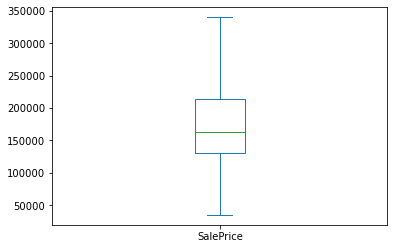

In [41]:
df.SalePrice.plot(kind='box')
plt.show()

In [42]:
nunique=[]
for i in df.columns.values:
    nunique.append((i,df[i].nunique()))

In [43]:
nunique=pd.DataFrame(nunique,columns=['column','nunique'])

In [44]:
nunique[nunique['nunique']==1]

,column,nunique
36,BsmtFinSF2,1
45,LowQualFinSF,1
68,EnclosedPorch,1
69,3SsnPorch,1
70,ScreenPorch,1
71,PoolArea,1
75,MiscVal,1


In [45]:
del_cols=nunique[nunique['nunique']==1]['column'].values.tolist()
df.drop(del_cols,axis=1,inplace=True)

In [46]:
df.shape

(1460, 74)

In [47]:
df['OverallQual']=df['OverallQual'].replace({ 10:'Very Excellent',
       9:'Excellent',
       8:'Very Good',
       7:'Good',
       6:'Above Average',
       5:'Average',
       4:'Below Average',
       3:'Fair',
       2:'Poor',
       1:'Very Poor'})

In [48]:
df['OverallCond']=df['OverallCond'].replace({ 10:'Very Excellent',
       9:'Excellent',
       8:'Very Good',
       7:'Good',
       6:'Above Average',
       5:'Average',
       4:'Below Average',
       3:'Fair',
       2:'Poor',
       1:'Very Poor'})

In [49]:
MSSubClass={20:'1-STORY 1946 & NEWER ALL STYLES',
        30:'1-STORY 1945 & OLDER',
        40:"1-STORY W/FINISHED ATTIC ALL AGES",
        45:"1-1/2 STORY - UNFINISHED ALL AGES",
        50:"1-1/2 STORY FINISHED ALL AGES",
        60:"2-STORY 1946 & NEWER",
        70:"2-STORY 1945 & OLDER",
        75:"2-1/2 STORY ALL AGES",
        80:"SPLIT OR MULTI-LEVEL",
        85:"SPLIT FOYER",
        90:"DUPLEX - ALL STYLES AND AGES",
       120:"1-STORY PUD (Planned Unit Development) - 1946 & NEWER",
       150:"1-1/2 STORY PUD - ALL AGES",
       160:"2-STORY PUD - 1946 & NEWER",
       180:"PUD - MULTILEVEL - INCL SPLIT LEV/FOYER",
       190:"2 FAMILY CONVERSION - ALL STYLES AND AGES"}
df['MSSubClass']=df['MSSubClass'].map(MSSubClass)


## EDA

In [50]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,PoolQC,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,2-STORY 1946 & NEWER,RL,65.000000000,8450.000000000,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.000000000,Gd,TA,PConc,Gd,TA,No,GLQ,706.000000000,Unf,150.000000000,856.000000000,GasA,Ex,Y,SBrkr,856.000000000,854.000000000,1710.000000000,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003.000000000,RFn,2.000000000,548.000000000,TA,TA,Y,0.000000000,61.000000000,NA,NA,NA,2,2008,WD,Normal,208500.000000000
1,2,1-STORY 1946 & NEWER ALL STYLES,RL,80.000000000,9600.000000000,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Above Average,Very Good,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.000000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.000000000,Unf,284.000000000,1262.000000000,GasA,Ex,Y,SBrkr,1262.000000000,0.000000000,1262.000000000,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.000000000,RFn,2.000000000,460.000000000,TA,TA,Y,298.000000000,0.000000000,NA,NA,NA,5,2007,WD,Normal,181500.000000000
2,3,2-STORY 1946 & NEWER,RL,68.000000000,11250.000000000,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.000000000,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.000000000,Unf,434.000000000,920.000000000,GasA,Ex,Y,SBrkr,920.000000000,866.000000000,1786.000000000,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.000000000,RFn,2.000000000,608.000000000,TA,TA,Y,0.000000000,42.000000000,NA,NA,NA,9,2008,WD,Normal,223500.000000000
3,4,2-STORY 1945 & OLDER,RL,60.000000000,9550.000000000,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Good,Average,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000000000,TA,TA,BrkTil,TA,Gd,No,ALQ,216.000000000,Unf,540.000000000,756.000000000,GasA,Gd,Y,SBrkr,961.000000000,756.000000000,1717.000000000,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.000000000,Unf,3.000000000,642.000000000,TA,TA,Y,0.000000000,35.000000000,NA,NA,NA,2,2006,WD,Abnorml,140000.000000000
4,5,2-STORY 1946 & NEWER,RL,84.000000000,14260.000000000,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Very Good,Average,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.000000000,Gd,TA,PConc,Gd,TA,Av,GLQ,655.000000000,Unf,490.000000000,1145.000000000,GasA,Ex,Y,SBrkr,1145.000000000,1053.000000000,2198.000000000,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.000000000,RFn,3.000000000,836.000000000,TA,TA,Y,192.000000000,84.000000000,NA,NA,NA,12,2008,WD,Normal,250000.000000000


In [51]:
df['MSSubClass'].value_counts()/df.shape[0]

1-STORY 1946 & NEWER ALL STYLES                         0.367123288
2-STORY 1946 & NEWER                                    0.204794521
1-1/2 STORY FINISHED ALL AGES                           0.098630137
1-STORY PUD (Planned Unit Development) - 1946 & NEWER   0.059589041
1-STORY 1945 & OLDER                                    0.047260274
2-STORY PUD - 1946 & NEWER                              0.043150685
2-STORY 1945 & OLDER                                    0.041095890
SPLIT OR MULTI-LEVEL                                    0.039726027
DUPLEX - ALL STYLES AND AGES                            0.035616438
2 FAMILY CONVERSION - ALL STYLES AND AGES               0.020547945
SPLIT FOYER                                             0.013698630
2-1/2 STORY ALL AGES                                    0.010958904
1-1/2 STORY - UNFINISHED ALL AGES                       0.008219178
PUD - MULTILEVEL - INCL SPLIT LEV/FOYER                 0.006849315
1-STORY W/FINISHED ATTIC ALL AGES               

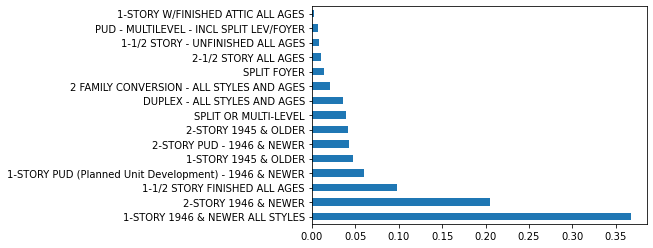

In [52]:
# 37% of the 1-STORY 1946 & NEWER ALL STYLES
#1-STORY W/FINISHED ATTIC ALL AGES types of houses are rarest of all as they are of just .2%
(df['MSSubClass'].value_counts()/df.shape[0]).plot(kind='barh')
plt.show()

In [53]:
df.groupby('MSSubClass').agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by="SalePrice_avg",ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
MSSubClass,,,,,
2-STORY 1946 & NEWER,61.376254181,11212.396321070,144.728260870,1012.107023411,230464.811036789
1-STORY PUD (Planned Unit Development) - 1946 & NEWER,35.172413793,5383.954022989,103.625000000,1292.310344828,199862.770114943
2-1/2 STORY ALL AGES,70.218750000,10773.343750000,0.000000000,911.312500000,184002.343750000
1-STORY 1946 & NEWER ALL STYLES,62.679104478,10632.471082090,93.531016791,1248.152985075,181389.620335821
SPLIT OR MULTI-LEVEL,52.431034483,10764.172413793,117.090517241,923.706896552,169650.991379310
2-STORY 1945 & OLDER,60.025000000,9872.275000000,3.733333333,793.450000000,166454.708333333
1-STORY W/FINISHED ATTIC ALL AGES,37.500000000,11079.375000000,0.000000000,1013.750000000,156125.000000000
SPLIT FOYER,50.100000000,9317.450000000,48.081250000,892.400000000,147810.000000000
1-1/2 STORY FINISHED ALL AGES,56.743055556,9247.697916667,29.480034722,851.375000000,142532.659722222


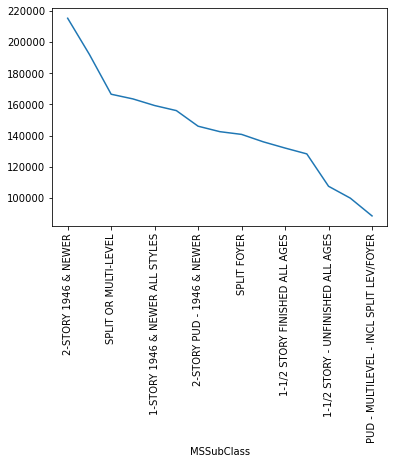

In [54]:
df.groupby('MSSubClass').agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by="SalePrice_avg",ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

**1-STORY W/FINISHED ATTIC ALL AGES type of house on an average have high lot area and basement size. Their selling price is also on the higher side. We can see that homes/buildings without MasVnrArea, are not bought that frequently**

In [55]:
#We see that maximum properties sold are residential low density,i.e 78%. Minimum is commercial.
df['MSZoning'].value_counts(normalize=True,dropna=False)

RL        0.788356164
RM        0.149315068
FV        0.044520548
RH        0.010958904
C (all)   0.006849315
Name: MSZoning, dtype: float64

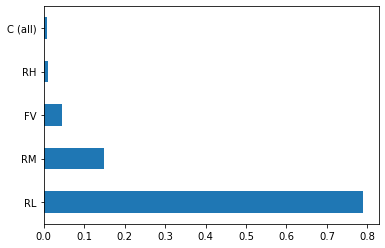

In [56]:
df['MSZoning'].value_counts(normalize=True,dropna=False).plot(kind='barh')
plt.show()

We see commercial and residential high density is very low, we can club them in one 

In [57]:
df['MSZoning'].replace(['C (all)','RH'],'Others',inplace=True)

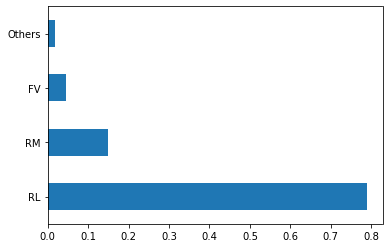

In [58]:
df['MSZoning'].value_counts(normalize=True,dropna=False).plot(kind='barh')
plt.show()

In [59]:
df.groupby(['MSZoning']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
MSZoning,,,,,
FV,62.000000000,7500.000000000,0.000000000,912.000000000,205950.000000000
RL,67.000000000,10004.000000000,0.000000000,1056.000000000,174000.000000000
RM,50.000000000,6000.000000000,0.000000000,780.000000000,120500.000000000
Others,60.000000000,8400.000000000,0.000000000,753.500000000,107500.000000000


In [60]:
df.groupby('MSZoning').agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by="SalePrice_avg",ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
MSZoning,,,,,
FV,52.169230769,6638.861538462,88.025000000,991.015384615,213539.592307692
RL,59.285403997,10474.287576021,97.547893136,1106.629018245,186641.265855778
RM,47.717889908,6353.155963303,53.309059633,799.247706422,125457.082568807
Others,56.269230769,8183.365384615,35.100961538,807.307692308,109623.615384615


Floating Village Residential properties on an average have highest selling price but is not being bought much. Reasons for it to be costlier seems to be :

- MasVnrArea, TotalBsmtSF are on higher scale

Residential low density is occupied the most and have selling price on higher side. Reasons:

- Lot Frontage, Lot Area MasVnrArea and Total Basement Square Feet are on the higher scale comparing others

Commercial and Agricultural properties and residential high density are not bought frequently, probably because they do not have MasVnrArea and there can be other reasons , which we will further investigate

In these zones there are rare homes which are soled on higher price because of which their average price is very high

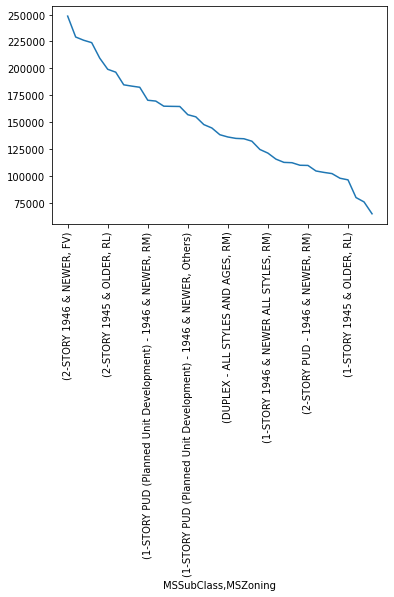

In [61]:
df.groupby(['MSSubClass','MSZoning']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)["SalePrice_avg"].plot()
plt.xticks(rotation=90)
plt.show()

1-STORY 1946 & NEWER ALL STYLES is the dwelling which is highest in frequency because such dwelling is done for properties which are commercial and aggricultural. Rest of the properties are distributed in different dwelling type. Commercial have focused dwelling, which are :

    - 1-STORY 1946 & NEWER ALL STYLES
    - 1-1/2 STORY FINISHED ALL AGES
    - 1-STORY 1945 & OLDER
    - 2-STORY 1945 & OLDER

These are least expensive. Commercial having higher selling price is : 2 FAMILY CONVERSION - ALL STYLES AND AGES

Expensive Dwelling are for floating village residential, residential low density and residential medium density. Which are:

    - 2-STORY 1946 & NEWER
    - 1-STORY PUD (Planned Unit Development) - 1946 & NEWER
    - 1-STORY PUD (Planned Unit Development) - 1946 & NEWER

The curve becomes more towards linear compared to the previous

In [62]:
df['Street'].value_counts(normalize=True)

Pave   0.995890411
Grvl   0.004109589
Name: Street, dtype: float64

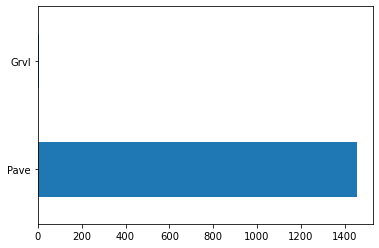

In [63]:
df['Street'].value_counts().plot(kind='barh')
plt.show()

In [64]:
df.groupby(['Street']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Street,,,,,
Pave,57.129986245,9630.770976616,89.548314993,1050.367950481,177526.056052270
Grvl,71.166666667,13674.250000000,55.000000000,1022.833333333,130190.500000000


In [65]:
df.groupby(['Street']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Street,,,,,
Pave,63.000000000,9475.000000000,0.000000000,992.000000000,163000.000000000
Grvl,73.500000000,14757.250000000,0.000000000,855.000000000,114250.000000000


We see that properties with gravel are only .4% rest are with pave. We see average selling price for house types which have street as gravel and as pave are affected by properties which have higher prices 

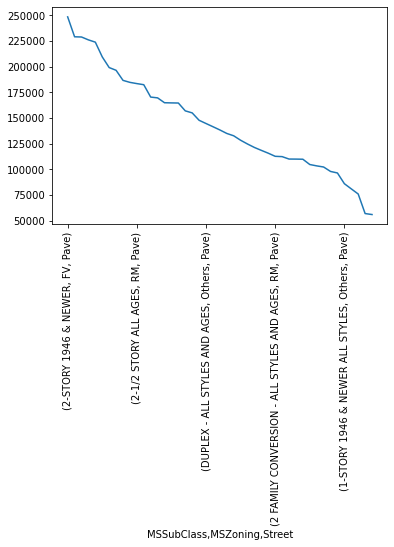

In [66]:
df.groupby(['MSSubClass','MSZoning','Street']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)["SalePrice_avg"].plot()
plt.xticks(rotation=90)
plt.show()

Properties with gravel street is mainly in residential low density and medium density,1-STORY 1945 & OLDER	type properties .

Street does not make any significant change in the average sale price, it just adds a tail for the properties with least average selling price in the graph

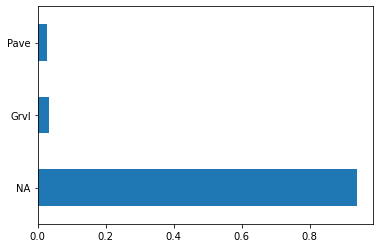

In [67]:
df['Alley'].value_counts(normalize=True).plot(kind='barh')
plt.show()

We see that there are approx 93% properties which does not have ally, rest properties have either gravel or pave type alley

In [68]:
df.groupby(['Alley']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Alley,,,,,
NA,57.553323594,9784.136961286,92.631939372,1064.997078159,179623.849890431
Pave,44.390243902,5953.121951220,69.393292683,912.853658537,168000.585365854
Grvl,57.670000000,8932.500000000,17.500000000,759.280000000,122219.080000000


In [69]:
df.groupby(['Alley']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Alley,,,,,
Pave,47.000000000,4500.000000000,0.000000000,844.000000000,172500.000000000
NA,65.000000000,9550.000000000,0.000000000,1008.000000000,165000.000000000
Grvl,60.000000000,9371.000000000,0.000000000,724.000000000,119500.000000000


we see no alley or pave alley have higher selling price as compared to gravel alley properties. Also their MasVnrArea and total basement is much larger as compared to properties with gravel alley. 

We see there are outliers in properties which does not have alley which substantially have increased the average selling price 

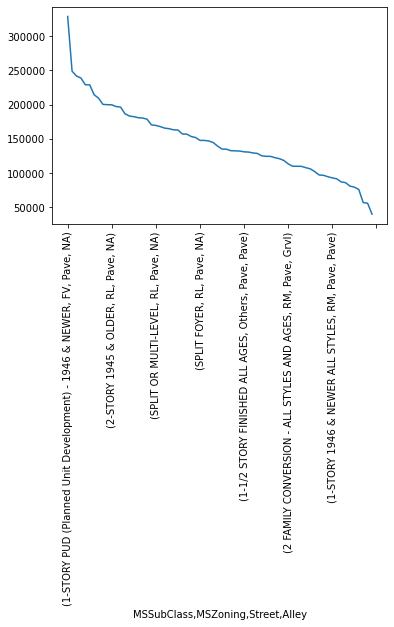

In [70]:
df.groupby(['MSSubClass','MSZoning','Street','Alley']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)["SalePrice_avg"].plot()
plt.xticks(rotation=90)
plt.show()

Top 3 type of properties have no alley , pave street and Floating Village Zone :

    - 1-STORY PUD (Planned Unit Development) - 1946 & NEWER
    - 2-STORY 1946 & NEWER
    - 1-STORY 1946 & NEWER ALL STYLES	
We see , there is significant change in curve, it start with sharp fall in average sale price, then average sale price pickup slightly then starts falling| 

Average selling price start to drop in rush but then it drops gradually and at the end makes a sharp drop

<AxesSubplot:>

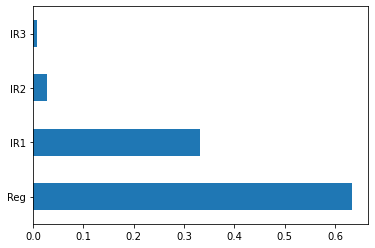

In [71]:
df['LotShape'].value_counts(normalize=True).plot(kind='barh')

In [72]:
df.groupby(['LotShape']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
LotShape,,,,,
IR2,43.804878049,13520.073170732,89.570121951,1141.292682927,223401.439024390
IR3,69.400000000,15274.850000000,41.062500000,1292.200000000,212540.250000000
IR1,49.604338843,10926.208677686,108.733987603,1147.322314050,200291.106404959
Reg,61.616756757,8745.762162162,79.808648649,992.814054054,162895.428648649


In [73]:
df.groupby(['LotShape']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
LotShape,,,,,
IR2,48.000000000,13682.000000000,0.000000000,1080.000000000,221000.000000000
IR3,63.000000000,16949.750000000,0.000000000,1255.000000000,203570.000000000
IR1,60.000000000,10638.000000000,0.000000000,1079.000000000,189000.000000000
Reg,65.000000000,8800.000000000,0.000000000,952.000000000,146000.000000000


We see that irregular shape properties are more expensive than regular shape properties. But 66% of properties are regular shaped. There is hughe difference in irregular and regular properties selling price on an average

In [74]:
df['LotShape'].replace(["IR2","IR3"],"Other",inplace=True)

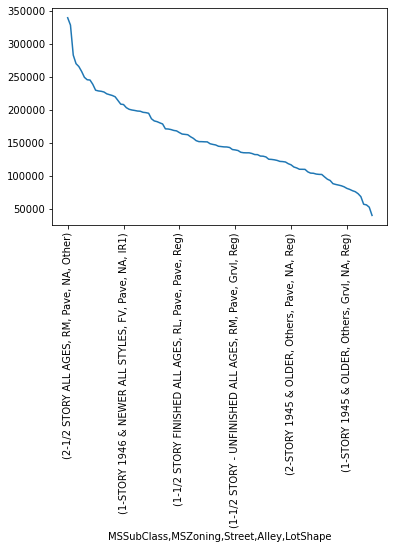

In [75]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

We see that properties of residential medium density of pave street with no alley and Other irregularities have the maximum selling price on an average. Then it starts to decrease. We see in the line in the top making a slight curve, in the middle the average selling price is more over linear

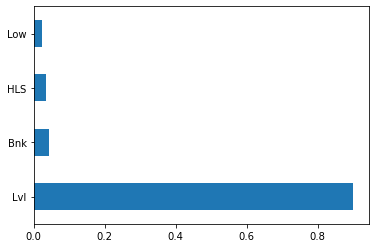

In [76]:
df['LandContour'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties are at flat level

In [77]:
df.groupby(['LandContour']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
LandContour,,,,,
HLS,67.580000000,10945.260000000,97.827500000,1177.720000000,220184.570000000
Low,38.930555556,14078.250000000,58.201388889,1222.083333333,201440.972222222
Lvl,57.022501907,9490.563691838,92.305205950,1049.353165523,176679.914569031
Bnk,62.809523810,9348.849206349,40.230158730,869.666666667,143104.079365079


In [78]:
df.groupby(['LandContour']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
LandContour,,,,,
HLS,68.500000000,11099.000000000,0.000000000,1040.000000000,222250.000000000
Low,0.000000000,16177.000000000,0.000000000,1339.500000000,190000.000000000
Lvl,63.000000000,9400.000000000,0.000000000,996.000000000,162900.000000000
Bnk,60.000000000,8472.000000000,0.000000000,818.000000000,139400.000000000


We see that properties at hill station have high average selling price and properties which are banked have lowest. Though most of the properties are of level contour but there prices on an average is minimal

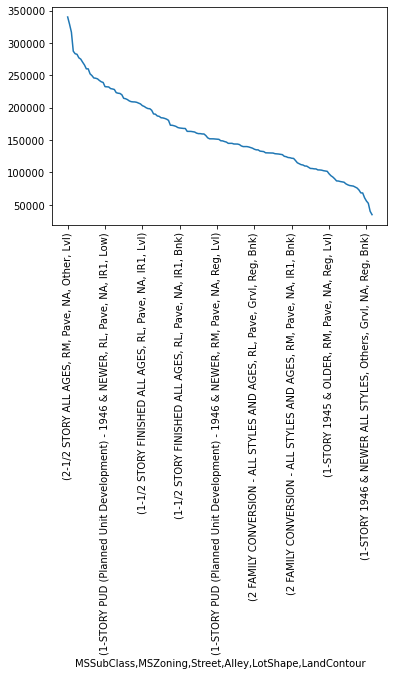

In [79]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

when we dig down further level countour property in combination with moderately irregular shape, no alley and Pave street , which is residential medium density 2-1/2 story all ages have the highest price on an average. We see noise decreasing in the plot of average selling price

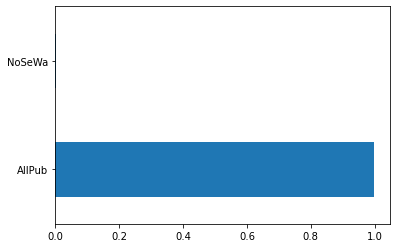

In [80]:
df['Utilities'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [81]:
df.groupby(['Utilities']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Utilities,,,,,
AllPub,57.226867718,9644.147703907,89.186172036,1050.413296779,177358.826936258
NoSeWa,0.000000000,14375.000000000,410.625000000,819.000000000,137500.000000000


In [82]:
df.groupby(['Utilities']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Utilities,,,,,
AllPub,63.000000000,9477.000000000,0.000000000,992.000000000,163000.000000000
NoSeWa,0.000000000,14375.000000000,410.625000000,819.000000000,137500.000000000


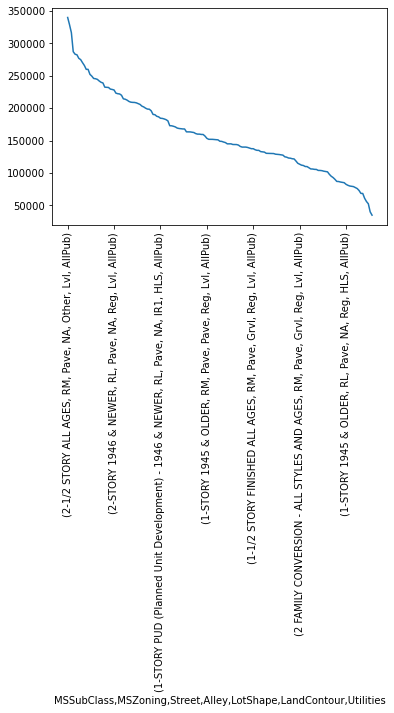

In [83]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

99% of properties have all public utilities. Only .06% of properties comes with Electricity and Gas Only utilities. Properties with all public utilities have higher selling price on on average. There is no significant change in average selling price

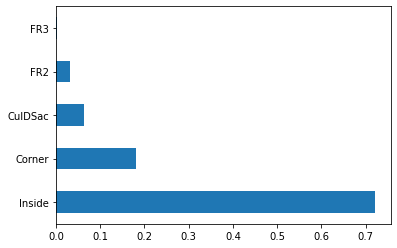

In [84]:
df['LotConfig'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [85]:
df['LotConfig'].replace(["FR2","FR3"],"Other",inplace=True)

In [86]:
df.groupby(['LotConfig']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
LotConfig,,,,,
CulDSac,28.324468085,12651.712765957,109.658244681,1179.904255319,213260.819148936
Other,46.647058824,9920.264705882,109.860294118,1028.901960784,179259.715686275
Corner,62.996197719,10413.013307985,88.828422053,1049.281368821,177408.806083650
Inside,58.825570342,9174.305608365,86.749643536,1039.948669202,174008.317490494


In [87]:
df.groupby(['LotConfig']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
LotConfig,,,,,
CulDSac,0.000000000,12654.500000000,0.000000000,1128.500000000,199262.000000000
Other,58.000000000,9764.000000000,66.000000000,912.000000000,165000.000000000
Corner,72.000000000,10400.000000000,0.000000000,991.000000000,160000.000000000
Inside,64.000000000,9100.000000000,0.000000000,986.500000000,159697.500000000


Properties having lot configuration inside are being sold most around 75% but there average price is minumum. Most expensive are the properties which are in cludsac and 3 side open, but they are not that frequently sold. There is good difference in the average price of culdsac , fr3 comparing to inside. but for rest there is not high difference in the lot configuration price

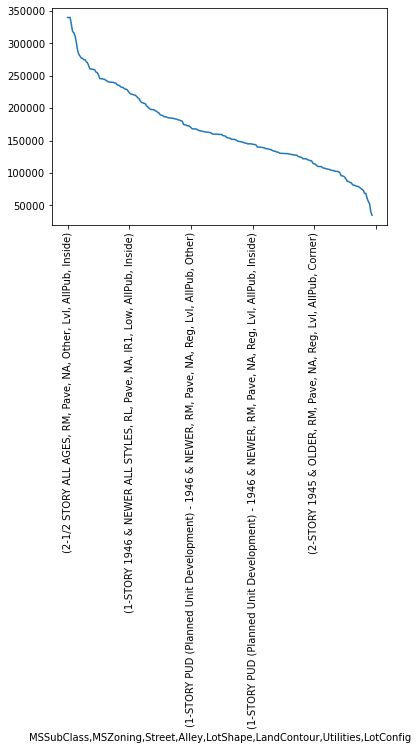

In [88]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

when we dig down further level countour property in combination with moderately irregular shape, no alley and Pave street having all public amenities and lot config is inside and  , which is residential medium density 2-1/2 story all ages have the highest price on an average. We see a small stagnation in the average selling price in the top of the curve

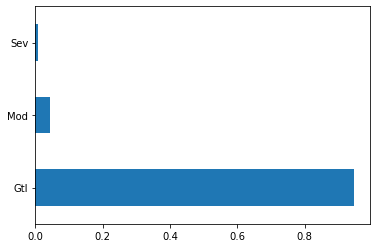

In [89]:
df['LandSlope'].value_counts(normalize=True).plot(kind='barh')
plt.show()

Most properties have gentle slope

In [90]:
df.groupby(['LandSlope']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
LandSlope,,,,,
Sev,30.961538462,15673.923076923,73.355769231,1252.769230769,201689.807692308
Mod,55.576923077,11089.407692308,77.755769231,1063.215384615,191957.984615385
Gtl,57.510130246,9522.875542692,90.105282200,1047.740231548,176414.465991317


In [91]:
df.groupby(['LandSlope']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
LandSlope,,,,,
Mod,61.000000000,10615.000000000,0.000000000,988.000000000,186700.000000000
Sev,0.000000000,17673.500000000,0.000000000,1332.000000000,185000.000000000
Gtl,63.000000000,9378.500000000,0.000000000,990.000000000,161875.000000000


There is not significant difference between gentle slope properties and moderate slope properties and severity slope properties

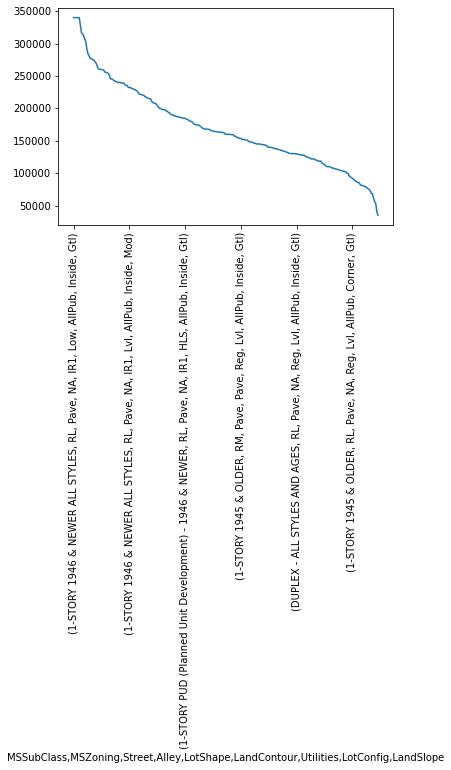

In [92]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

We see that there is stagnancy in the average selling price, which means two property types have similar average price. when we dig down further, depression countour property in combination with slightly irregular shape, no alley and Pave street having all public amenities and lot config is inside , also having gentle slope and is residential low density 1-Story 1946 & newer all styles  have the highest price on an average . The stagnation just increased a bit

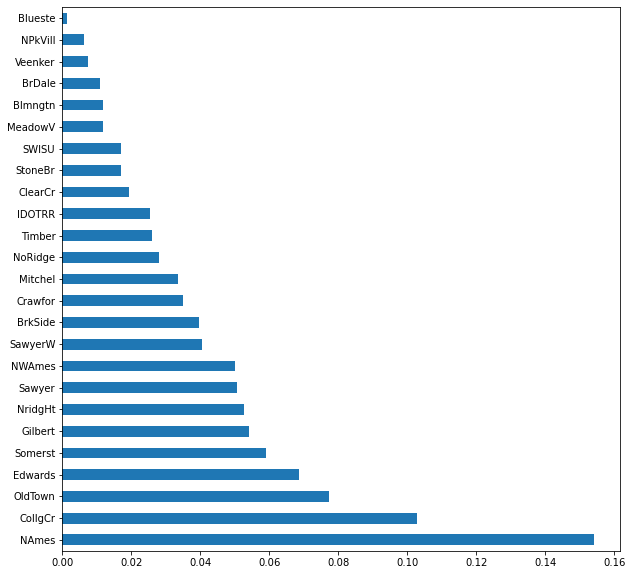

In [93]:
plt.figure(figsize=(10,10))
df['Neighborhood'].value_counts(normalize=True).plot(kind='barh')
plt.show()

Properties in the neighbourhood of north ames and college creek are sold more

In [94]:
df.groupby(['Neighborhood']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Neighborhood,,,,,
NoRidge,72.365853659,12678.682926829,287.109756098,1432.243902439,297854.158536585
NridgHt,80.818181818,10852.136363636,273.500000000,1563.428571429,288322.577922078
StoneBr,50.160000000,9238.700000000,132.405000000,1516.440000000,275573.500000000
Timber,62.855263158,12873.486842105,138.976973684,1352.315789474,239529.355263158
Veenker,38.000000000,12642.590909091,32.727272727,1321.272727273,234685.227272727
Somerst,58.651162791,7803.401162791,114.366279070,1132.755813953,224056.546511628
ClearCr,38.625000000,14233.607142857,74.866071429,1227.857142857,212565.428571429
Crawfor,57.725490196,11278.529411765,72.845588235,1032.901960784,208419.088235294
CollgCr,60.213333333,9619.146666667,95.296666667,1157.586666667,197107.340000000


We see that north ridge neighborhood properties have highest average sale, but only approx 3.5% of the buyers bought this property..

North Ames neighborhood properties are sold maximum i.e around 16% as these are midrange properties

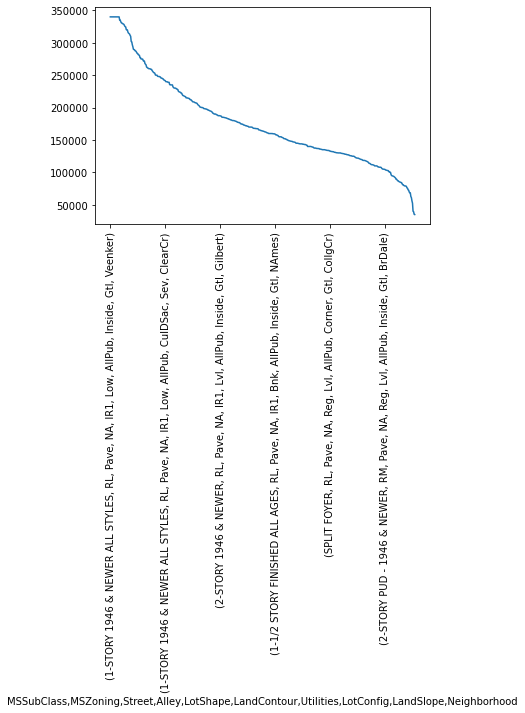

In [95]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

We see noise reducing in the curve of average selling price

In [96]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False).head(15)

LotFrontage_avg  \
MSSubClass                                         MSZoning Street Alley LotShape LandContour Utilities LotConfig LandSlope Neighborhood                    
1-STORY 1946 & NEWER ALL STYLES                    RL       Pave   NA    IR1      Low         AllPub    Inside    Gtl       Veenker          68.000000000   
                                                                         Other    Low         AllPub    Inside    Sev       Timber          134.500000000   
                                                                                  Lvl         AllPub    CulDSac   Gtl       Somerst          49.000000000   
2-1/2 STORY ALL AGES                               RM       Pave   NA    Other    Lvl         AllPub    Inside    Gtl       OldTown          90.000000000   
2-STORY 1946 & NEWER                               RL       Pave   NA    Other    HLS         AllPub    CulDSac   Mod       StoneBr          47.000000000   
                                                                                  Lvl         AllPub    Inside    Gtl       NridgHt          56.000000000   
1-STORY 1946 & NEWER ALL STYLES                    RL       Pave   NA    IR1      Lvl         AllPub    CulDSac   Gtl       StoneBr          63.000000000   
1-1/2 STORY FINISHED ALL AGES                      RL       Pave   NA    IR1      Lvl         AllPub    CulDSac   Gtl       NoRidge          56.000000000   
1-STORY 1946 & NEWER ALL STYLES                    RL       Pave   NA    IR1      HLS         AllPub    Corner    Gtl       StoneBr          86.000000000   
1-1/2 STORY FINISHED ALL AGES                      RL       Pave   NA    IR1      Lvl         AllPub    Inside    Mod       Crawfor           0.000000000   
2-STORY 1946 & NEWER                               RL       Pave   NA    Other    HLS         AllPub    CulDSac   Gtl       StoneBr          66.000000000   
1-STORY 1946 & NEWER ALL STYLES                    RL       Pave   NA    IR1      HLS         AllPub    Inside    Gtl       NridgHt          72.000000000   
                                                                         Reg      Lvl         AllPub    Inside    Gtl       NoRidge           0.000000000   
                                                                                                        Corner    Gtl       StoneBr          88.000000000   
1-STORY PUD (Planned Unit Development) - 1946 &... RL       Pave   NA    Reg      Lvl         AllPub    Corner    Gtl       NridgHt          65.000000000   

                                                                                                                                             LotArea_avg  \
MSSubClass                                         MSZoning Street Alley LotShape LandContour Utilities LotConfig LandSlope Neighborhood                   
1-STORY 1946 & NEWER ALL STYLES                    RL       Pave   NA    IR1      Low         AllPub    Inside    Gtl       Veenker      17673.500000000   
                                                                         Other    Low         AllPub    Inside    Sev       Timber       17673.500000000   
                                                                                  Lvl         AllPub    CulDSac   Gtl       Somerst      17673.500000000   
2-1/2 STORY ALL AGES                               RM       Pave   NA    Other    Lvl         AllPub    Inside    Gtl       OldTown      17673.500000000   
2-STORY 1946 & NEWER                               RL       Pave   NA    Other    HLS         AllPub    CulDSac   Mod       StoneBr      17673.500000000   
                                                                                  Lvl         AllPub    Inside    Gtl       NridgHt      17673.500000000   
1-STORY 1946 & NEWER ALL STYLES                    RL       Pave   NA    IR1      Lvl         AllPub    CulDSac   Gtl       StoneBr      17423.000000000   
1-1/2 STORY FINISHED ALL AGES                      RL       Pave

we see that 15 properties are having same average selling pice.

Most of them have stone brook and north ridge heights as their neighborhood

Majority of these homes have gentle slope.

Inside and CulDSac are more prominent lot config in these properties.

All these properties have all public amenities

Most of the properties are situated at flat level then hills

Most are slightly irregular shaped properties, with no ally

Property type is resident low density

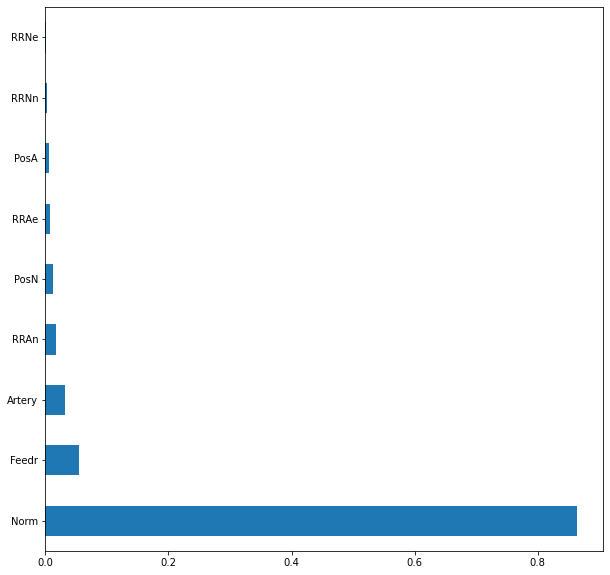

In [97]:
plt.figure(figsize=(10,10))
df['Condition1'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [98]:
df['Condition1'].replace(["RRAe","PosA","RRNn","RRNe"],"Other",inplace=True)

85% of properties are normal in condition

In [99]:
df.groupby(['Condition1']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Condition1,,,,,
PosN,38.473684211,11389.263157895,157.730263158,1249.105263158,212817.763157895
Other,54.884615385,12058.653846154,104.125000000,1116.461538462,183573.076923077
RRAn,61.192307692,11425.288461538,41.384615385,982.038461538,181205.750000000
Norm,56.802777778,9536.013492063,91.320337302,1062.438095238,180544.674603175
Feedr,60.518518519,9648.000000000,79.537037037,936.185185185,142475.481481481
Artery,68.156250000,9611.312500000,46.812500000,845.312500000,132279.947916667


In [100]:
df.groupby(['Condition1']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Condition1,,,,,
PosN,0.000000000,11050.000000000,72.000000000,1296.000000000,200000.000000000
Other,64.000000000,11834.500000000,0.000000000,1084.000000000,175500.000000000
RRAn,60.000000000,10546.500000000,0.000000000,824.000000000,171495.000000000
Norm,63.000000000,9423.000000000,0.000000000,1008.000000000,166500.000000000
Feedr,65.000000000,9170.000000000,0.000000000,912.000000000,140000.000000000
Artery,60.000000000,9000.000000000,0.000000000,817.000000000,119550.000000000


Adjacent to postive off-site feature properties have higher average because number of houses of such conditions are very less. On an average properties of condition Within 200' of North-South Railroad have higher selling price.

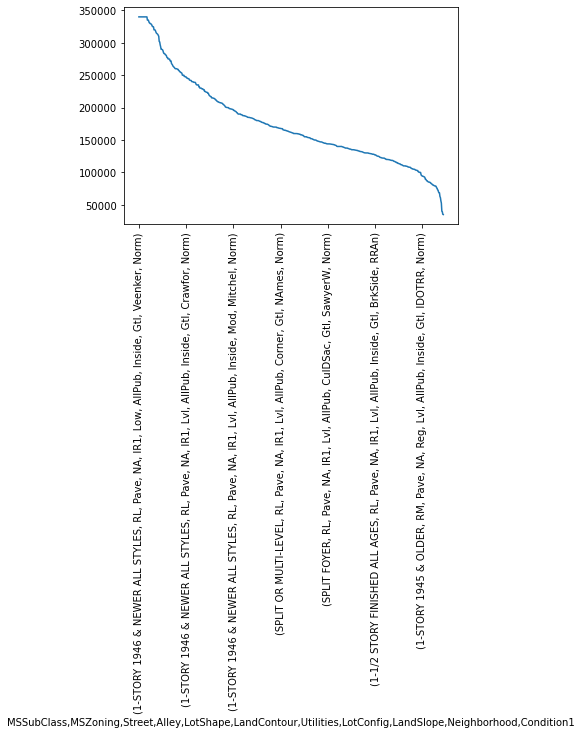

In [101]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

There is not much change evident on the average selling price having other features, just smoothens the curve a bit

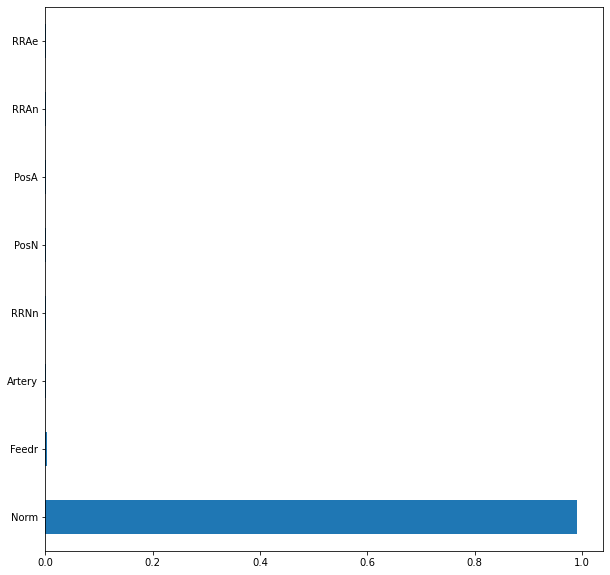

In [102]:
plt.figure(figsize=(10,10))
df['Condition2'].value_counts(normalize=True).plot(kind='barh')
plt.show()

we see that other condition present is normal in 99% of the cases

In [103]:
df['Condition2'].replace(["Feedr","Artery","RRNn","PosN","PosA","RRAn","RRAe"],"Other",inplace=True)

In [104]:
df.groupby(['Condition2']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Condition2,,,,,
Norm,57.087889273,9636.377508651,89.651903114,1050.174394464,177573.588927336
Other,66.800000000,10708.066666667,65.750000000,1058.000000000,154012.833333333


In [105]:
df.groupby(['Condition2']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Condition2,,,,,
Norm,63.000000000,9477.000000000,0.000000000,992.000000000,163500.000000000
Other,60.000000000,10300.000000000,0.000000000,978.000000000,128000.000000000


Given second condition present in the property , property with Adjacent to postive off-site feature have higher selling price on an average

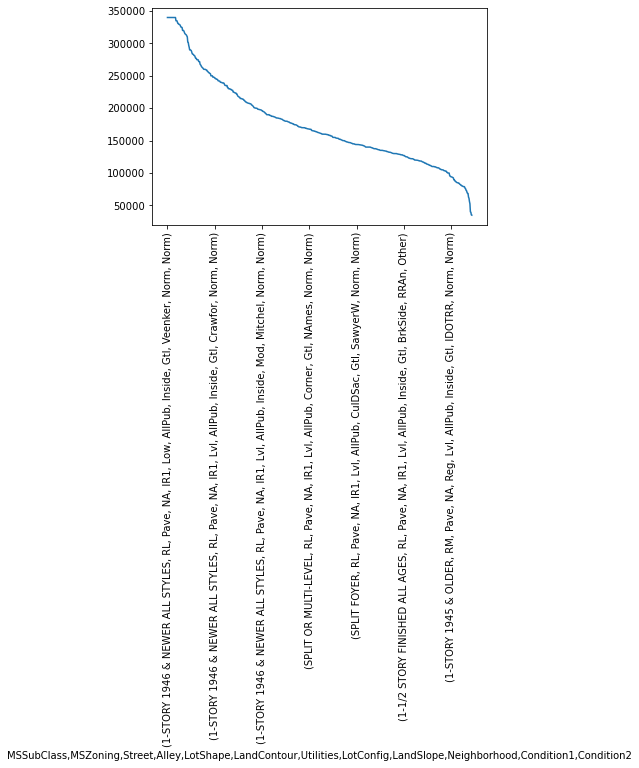

In [106]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

There is not much change in average selling price after introducing condition 1 and 2

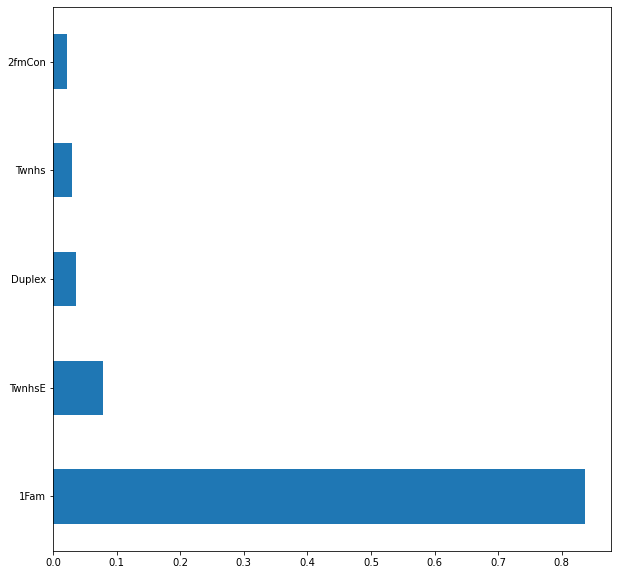

In [107]:
plt.figure(figsize=(10,10))
df['BldgType'].value_counts(normalize=True).plot(kind='barh')
plt.show()

85% of the sold properties are single family detached building

In [108]:
df.groupby(['BldgType']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BldgType,,,,,
1Fam,60.180327869,10353.525409836,87.246721311,1064.950819672,181533.316803279
TwnhsE,33.877192982,4768.236842105,102.525219298,1095.359649123,181260.052631579
Twnhs,22.953488372,2391.209302326,150.802325581,756.534883721,135911.627906977
Duplex,64.711538462,9555.769230769,104.805288462,969.769230769,133541.076923077
2fmCon,60.000000000,10018.854838710,15.161290323,848.451612903,128432.258064516


In [109]:
df.groupby(['BldgType']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BldgType,,,,,
TwnhsE,37.000000000,4240.500000000,16.000000000,1194.500000000,172200.000000000
1Fam,66.000000000,9819.000000000,0.000000000,998.500000000,167900.000000000
Twnhs,21.000000000,2117.000000000,116.000000000,673.000000000,137500.000000000
Duplex,67.500000000,9050.000000000,0.000000000,1028.500000000,135980.000000000
2fmCon,60.000000000,10120.000000000,0.000000000,925.000000000,127500.000000000


We see that town house end unit and single family detached unit are more expensive 

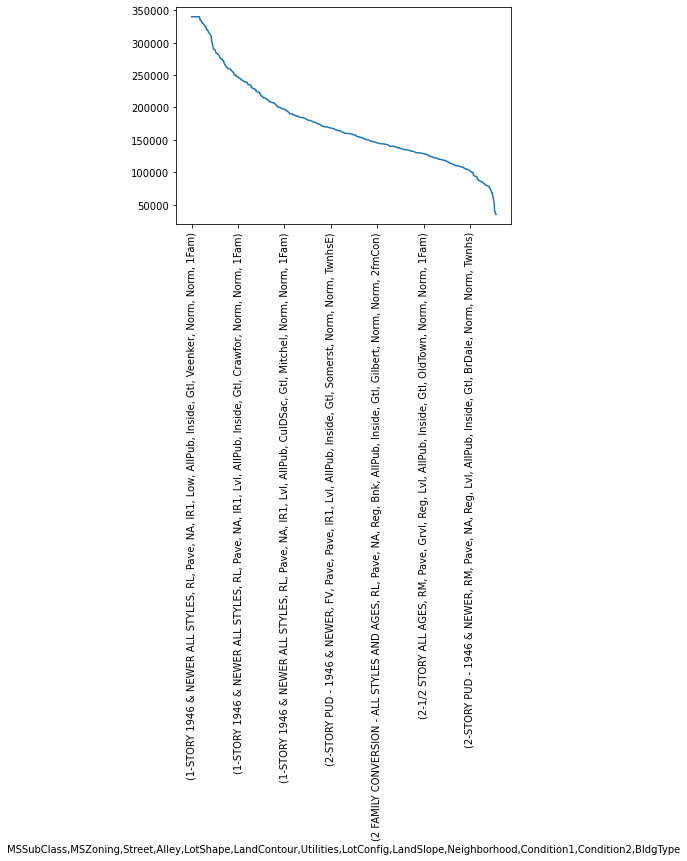

In [110]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

if you notice the dampness in the curve of average selling price is decreased

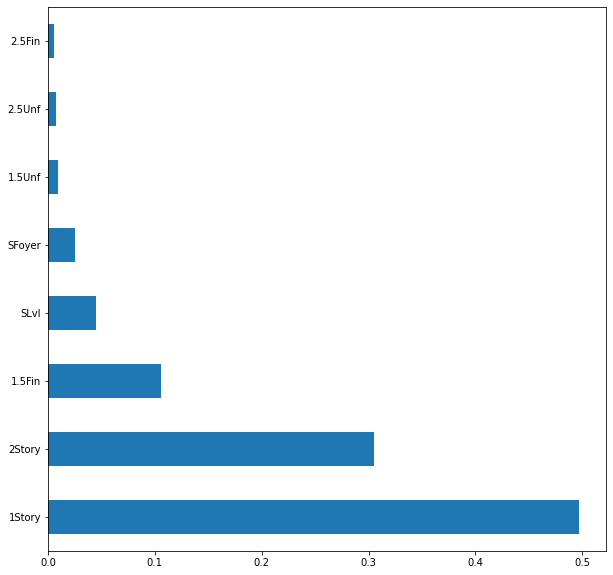

In [111]:
plt.figure(figsize=(10,10))
df['HouseStyle'].value_counts(normalize=True).plot(kind='barh')
plt.show()

50% of the properties sold are single story buildings and 30% of the properties sold are double story 

In [112]:
df['HouseStyle'].replace(["1.5Unf","2.5Unf","2.5Fin"],"Others",inplace=True)

In [113]:
df.groupby(['HouseStyle']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
HouseStyle,,,,,
2Story,56.464044944,9706.523595506,121.858426966,925.934831461,203636.739325843
1Story,58.781680441,9742.267906336,85.471935262,1200.216253444,173044.181129477
SLvl,51.646153846,10420.569230769,118.198076923,895.123076923,166627.038461538
Others,59.333333333,8912.242424242,0.000000000,877.696969697,148425.378787879
1.5Fin,56.233766234,9334.782467532,27.572240260,848.246753247,142396.448051948
SFoyer,46.405405405,7672.959459459,62.827702703,870.189189189,135074.486486486


In [114]:
df.groupby(['HouseStyle']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
HouseStyle,,,,,
2Story,65.000000000,9900.000000000,0.000000000,860.000000000,190000.000000000
SLvl,70.000000000,9967.000000000,82.000000000,985.000000000,164500.000000000
1Story,65.000000000,9330.000000000,0.000000000,1199.000000000,154750.000000000
SFoyer,60.000000000,7838.000000000,0.000000000,870.000000000,135960.000000000
1.5Fin,60.000000000,8759.000000000,0.000000000,810.500000000,132000.000000000
Others,60.000000000,8100.000000000,0.000000000,832.000000000,128000.000000000


we see that single story unit is generally bought cheaper comparatively to two story unit but due to presence of expensive units

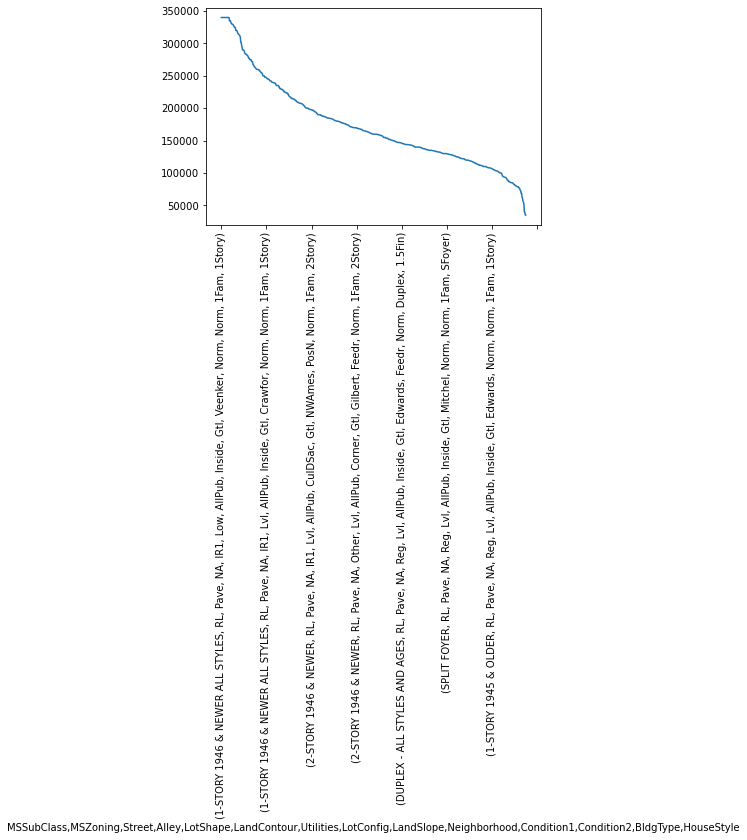

In [115]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

Not much significant difference on average selling price

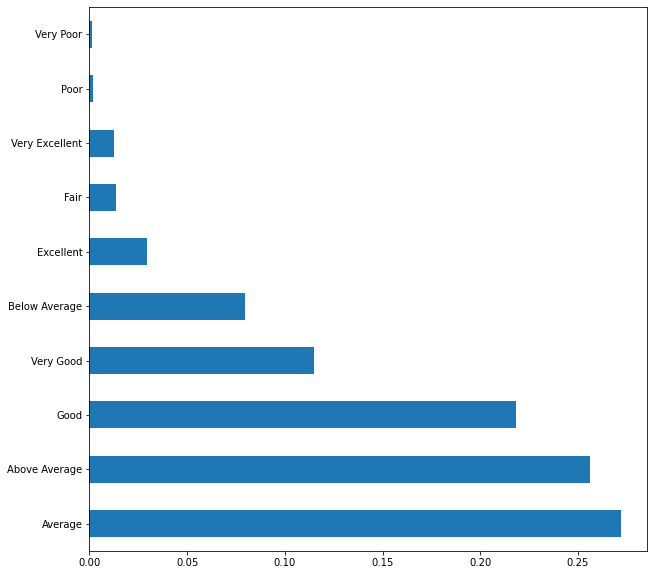

In [116]:
plt.figure(figsize=(10,10))
df['OverallQual'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [117]:
df['OverallQual'].replace(["Poor","Very Poor"],"Poor",inplace=True)

76% of the properties have overall quality in range of 5-7. 28% itself have overall quality 5

In [118]:
df.groupby(['OverallQual']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
OverallQual,,,,,
Excellent,83.279069767,12601.976744186,271.505813953,1720.162790698,325042.709302326
Very Excellent,97.166666667,14544.472222222,270.145833333,1793.277777778,318763.194444444
Very Good,65.288690476,10653.160714286,181.420386905,1399.904761905,267723.732142857
Good,57.695924765,9718.203761755,92.829937304,1107.332288401,207466.086206897
Above Average,50.717914439,9314.552139037,96.064505348,983.639037433,161603.034759358
Average,57.035264484,9389.333753149,40.392317380,930.914357683,133523.347607053
Below Average,50.362068966,8405.780172414,13.798491379,759.939655172,108420.655172414
Fair,56.300000000,8342.225000000,17.000000000,566.850000000,87473.750000000
Poor,42.200000000,7708.000000000,0.000000000,351.800000000,51122.200000000


In [119]:
df.groupby(['OverallQual']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
OverallQual,,,,,
Very Excellent,100.000000000,13786.500000000,357.812500000,2029.000000000,340037.500000000
Excellent,85.000000000,12919.000000000,300.000000000,1766.000000000,340037.500000000
Very Good,75.000000000,10748.500000000,175.000000000,1467.000000000,269750.000000000
Good,64.000000000,9600.000000000,0.000000000,1080.000000000,200141.000000000
Above Average,60.000000000,9327.000000000,0.000000000,934.000000000,160000.000000000
Average,60.000000000,8892.000000000,0.000000000,927.000000000,133000.000000000
Below Average,60.000000000,8487.500000000,0.000000000,796.000000000,108000.000000000
Fair,58.000000000,8359.000000000,0.000000000,660.500000000,86250.000000000
Poor,50.000000000,8400.000000000,0.000000000,290.000000000,60000.000000000


We see as the overall quality decreases average selling price also decreases. Fort top 3 qualities , i.e 10 to 8 , there is not much % decrease. 

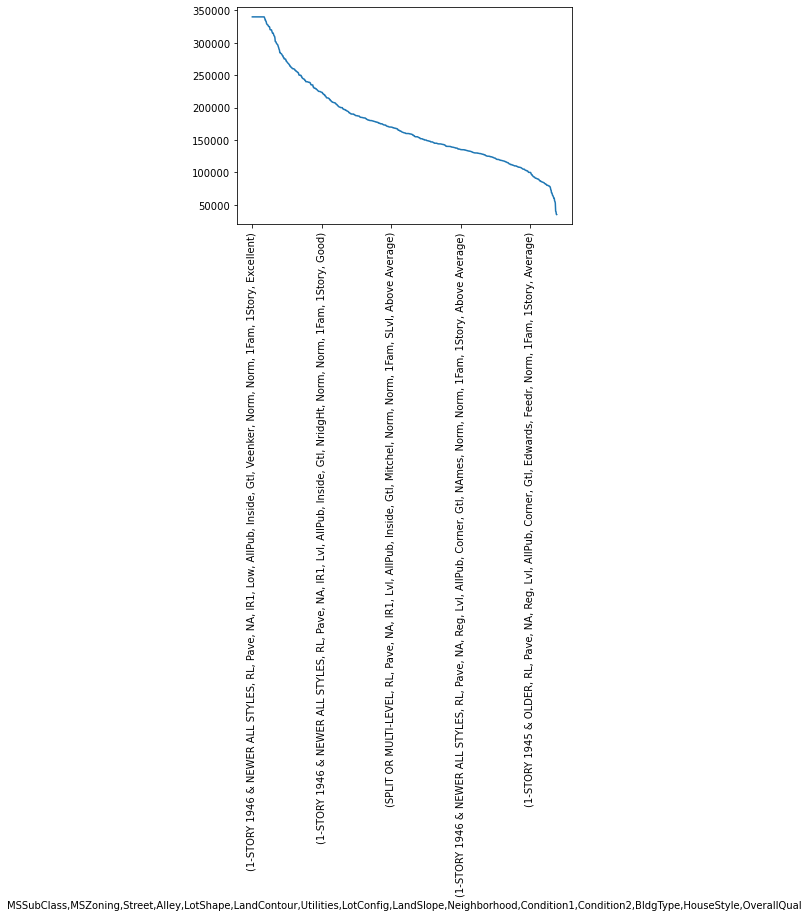

In [120]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

We see the average selling price constant for more houses having different combination of configuration and type.

Elbow at the top is no more there. 

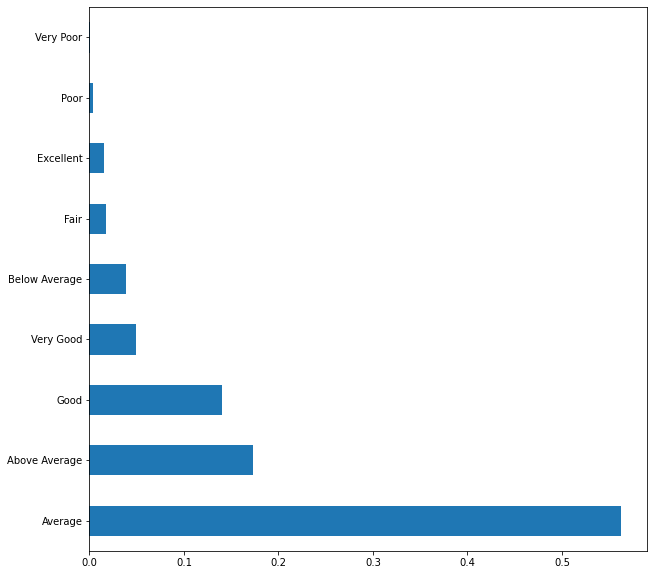

In [121]:
plt.figure(figsize=(10,10))
df['OverallCond'].value_counts(normalize=True).plot(kind='barh')
plt.show()

around 70% of houses are average to above average band

In [122]:
df['OverallCond'].replace(["Poor","Very Poor"],"Poor",inplace=True)

In [123]:
df.groupby(['OverallCond']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
OverallCond,,,,,
Excellent,46.272727273,10928.613636364,84.392045455,886.318181818,208007.954545455
Average,59.204019488,9748.579780755,117.059531060,1144.834348356,197729.468940317
Good,54.219512195,9604.409756098,46.478658537,904.229268293,157819.024390244
Very Good,53.833333333,8818.041666667,32.717013889,874.583333333,155651.736111111
Above Average,55.478174603,9468.944444444,67.883928571,970.210317460,151993.535714286
Below Average,57.877192982,10027.956140351,41.344298246,924.526315789,120438.438596491
Poor,61.333333333,8966.833333333,58.333333333,1056.000000000,119422.916666667
Fair,49.240000000,9032.060000000,34.945000000,884.000000000,101929.400000000


In [124]:
df.groupby(['OverallCond']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
OverallCond,,,,,
Average,65.000000000,9600.000000000,31.000000000,1094.000000000,185000.000000000
Excellent,51.500000000,9502.500000000,0.000000000,807.000000000,176200.000000000
Good,60.000000000,9250.000000000,0.000000000,876.000000000,145000.000000000
Above Average,60.000000000,9223.500000000,0.000000000,937.000000000,142750.000000000
Very Good,60.000000000,8432.000000000,0.000000000,854.500000000,142500.000000000
Below Average,60.000000000,9525.000000000,0.000000000,925.000000000,115000.000000000
Fair,50.000000000,8500.000000000,0.000000000,824.000000000,89500.000000000
Poor,60.000000000,9283.500000000,0.000000000,987.000000000,80750.000000000


we see since properties of overall condition graded 9 are very less around approx 3%, hence few high priced properties have inflated the average selling price. Normally one can buy them in 176200 on an average. In general higher price is paid for properties of grade 5 

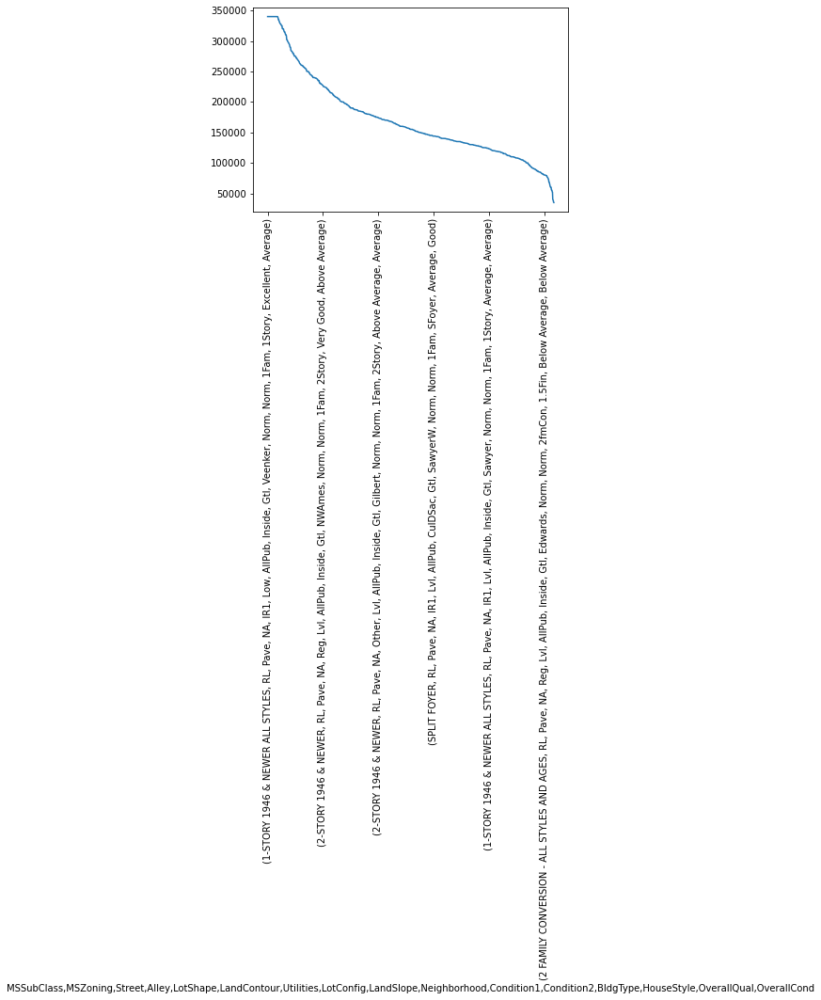

In [125]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

Overallcondtion did not bring any significant change in average selling price

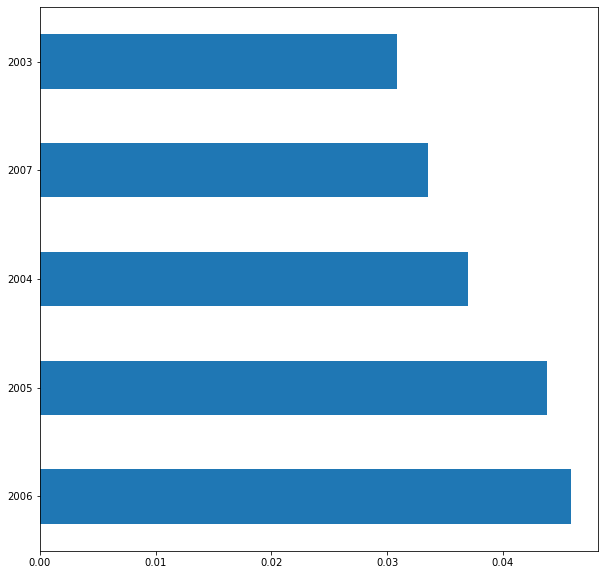

In [126]:
plt.figure(figsize=(10,10))
df['YearBuilt'].value_counts(normalize=True).head().plot(kind='barh')
plt.show()

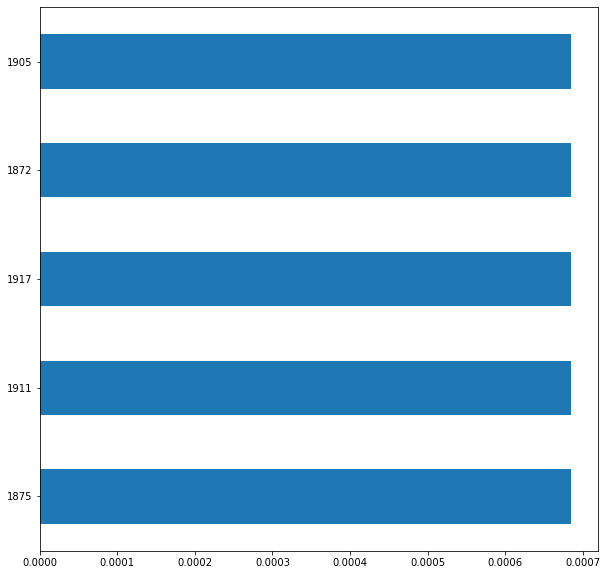

In [127]:
plt.figure(figsize=(10,10))
df['YearBuilt'].value_counts(normalize=True).tail().plot(kind='barh')
plt.show()

we see as year decreases probability or percentage sold properties drops

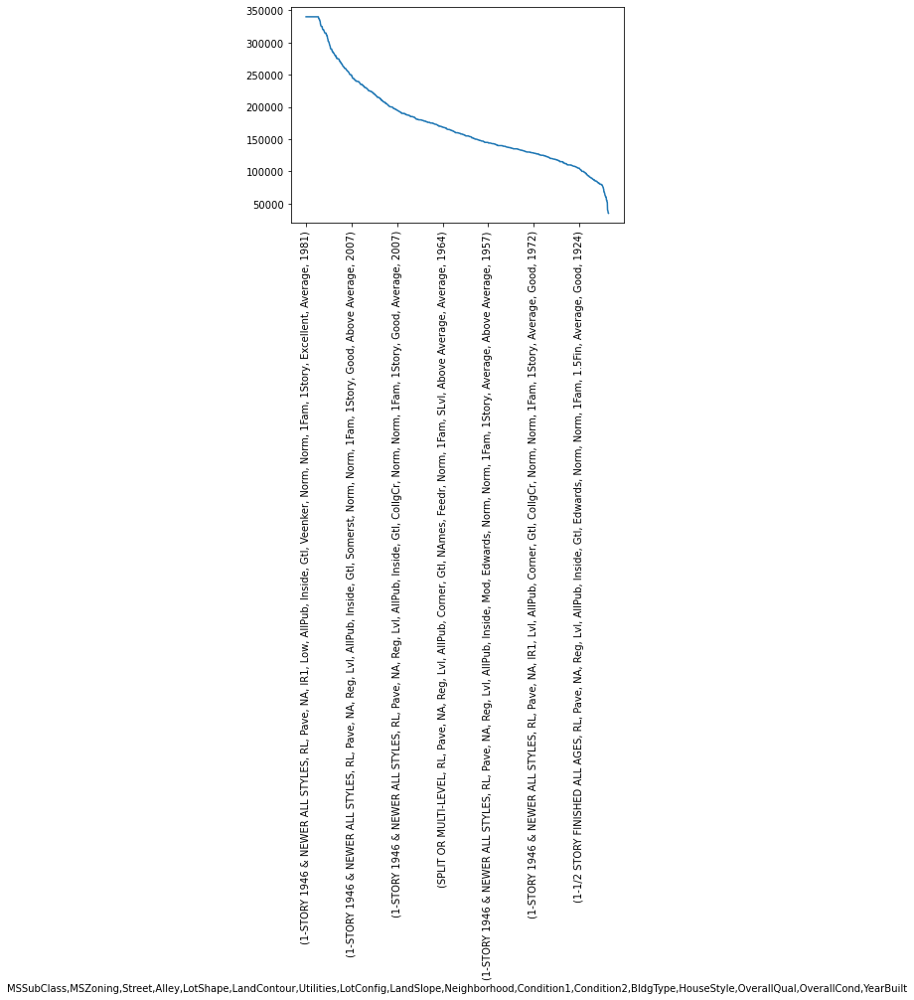

In [128]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

we see there does not exist any correlation on the age of property with its selling price

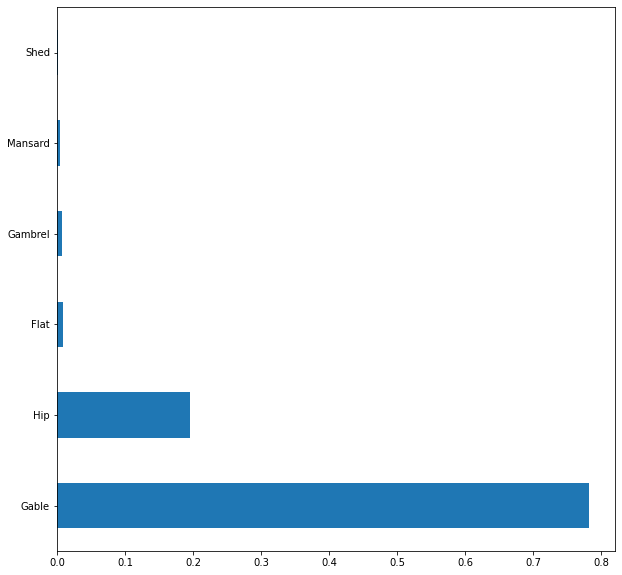

In [129]:
plt.figure(figsize=(10,10))
df['RoofStyle'].value_counts(normalize=True).plot(kind='barh')
plt.show()

75%+ properties have gable roof top

In [130]:
df['RoofStyle'].replace(["Flat","Gambrel","Mansard","Shed"],"Other",inplace=True)

In [131]:
df.groupby(['RoofStyle']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
RoofStyle,,,,,
Hip,65.463286713,10713.424825175,159.096590909,1271.213286713,206094.054195804
Other,54.196969697,12658.424242424,41.636363636,949.303030303,178271.181818182
Gable,55.199824715,9293.092900964,73.319566170,997.789658195,170094.811568799


In [132]:
df.groupby(['RoofStyle']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
RoofStyle,,,,,
Other,60.000000000,11700.000000000,0.000000000,840.000000000,180000.000000000
Hip,73.000000000,10369.500000000,120.000000000,1220.000000000,176500.000000000
Gable,60.000000000,9120.000000000,0.000000000,950.000000000,160000.000000000


we see that there are very less properties with shed , but the average selling price with shed roof top is maximum. Properties are mostly with gable roof top , probably because they are cheaper

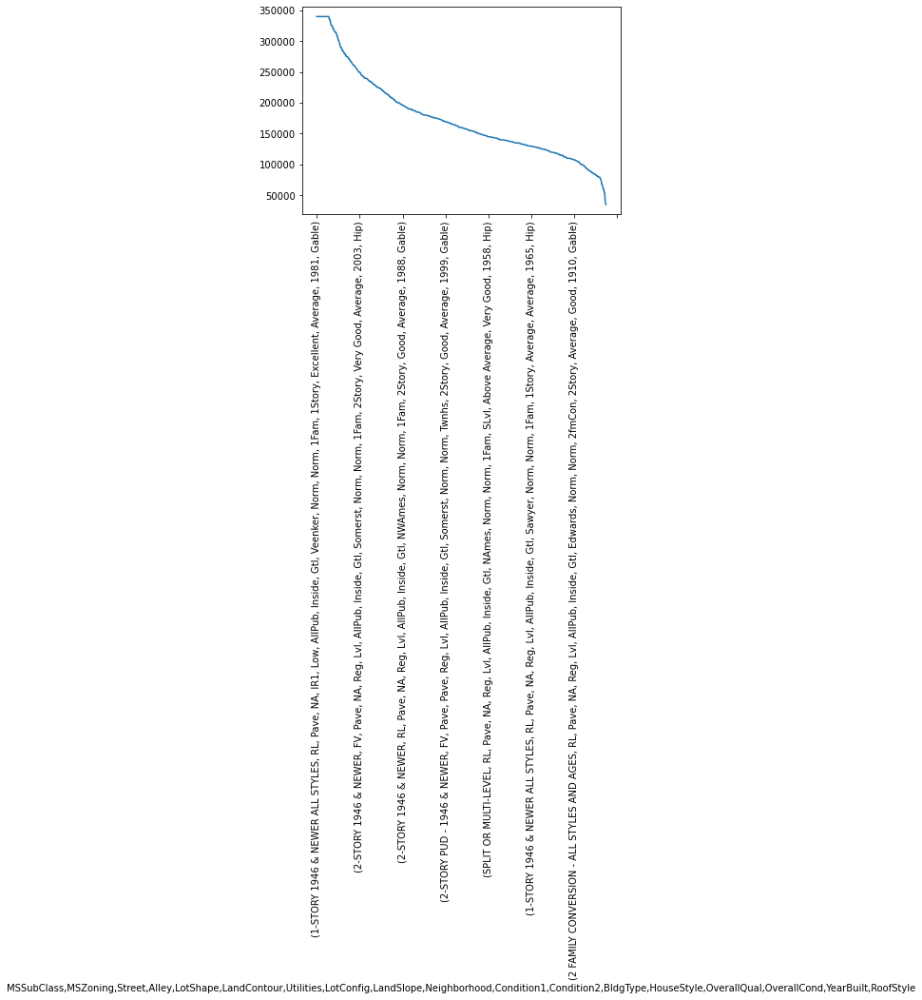

In [133]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

we see by adding roofstyle, the curve is reducing a bit , moving to be bit linear

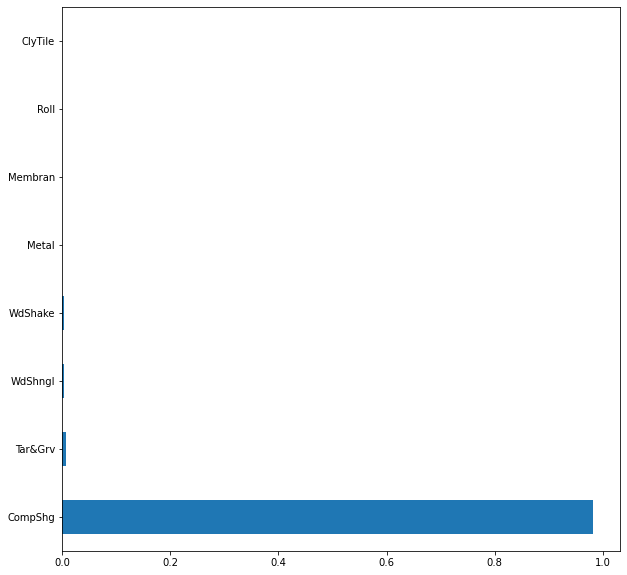

In [134]:
plt.figure(figsize=(10,10))
df['RoofMatl'].value_counts(normalize=True).plot(kind='barh')
plt.show()

in 99% of properties roof top material used is Standard (Composite) Shingle

In [135]:
df['RoofMatl'].replace(["Tar&Grv","WdShngl","WdShake","Metal","Membran","Roll","ClyTile"],"Other",inplace=True)

In [136]:
df.groupby(['RoofMatl']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
RoofMatl,,,,,
Other,60.230769231,14924.500000000,110.365384615,1260.384615385,219676.250000000
CompShg,57.132496513,9551.708158996,89.026324965,1046.444909344,176563.769874477


In [137]:
df.groupby(['RoofMatl']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
RoofMatl,,,,,
Other,73.500000000,17673.500000000,0.000000000,1262.500000000,234750.000000000
CompShg,63.000000000,9402.500000000,0.000000000,990.000000000,162000.000000000


properties with roof top material used Standard (Composite) Shingle have lesser selling price on an average. But it is skewed because 99% of houses have it. It won't affect the selling price

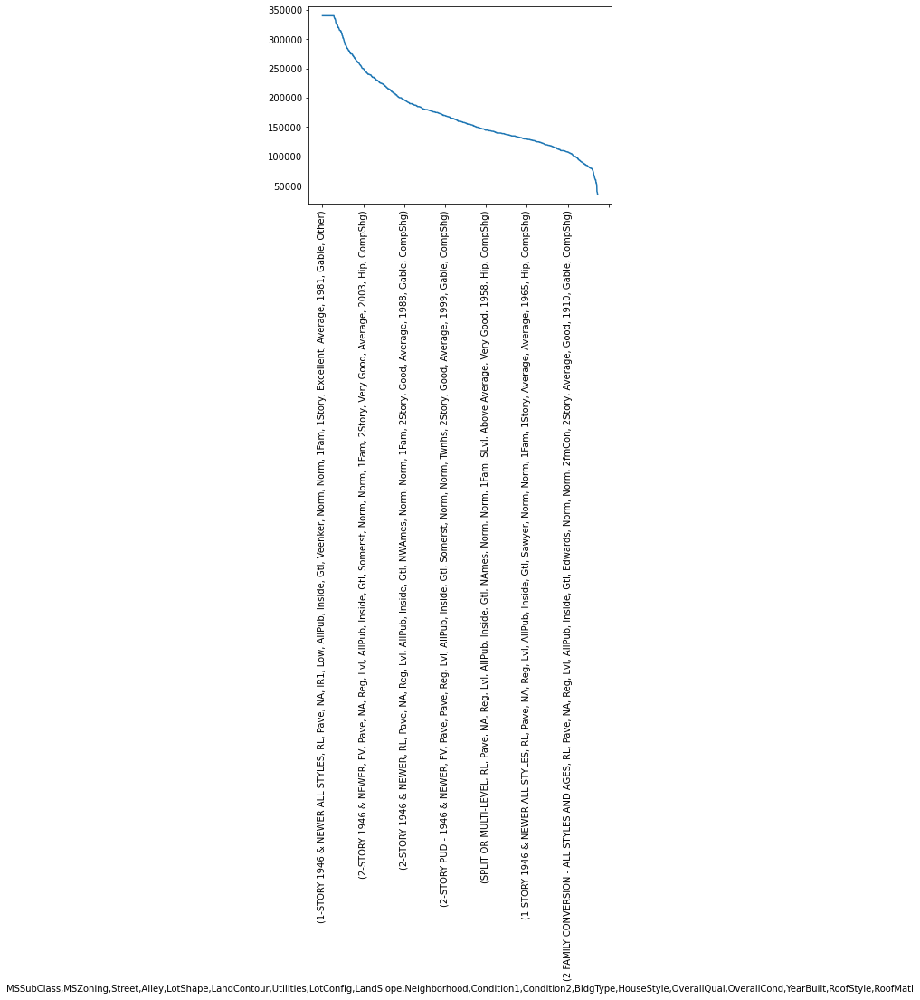

In [138]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

RoofMatl does not affect average selling price, but we see one of the expensive property have Wood Shingles as material used to make the roof top

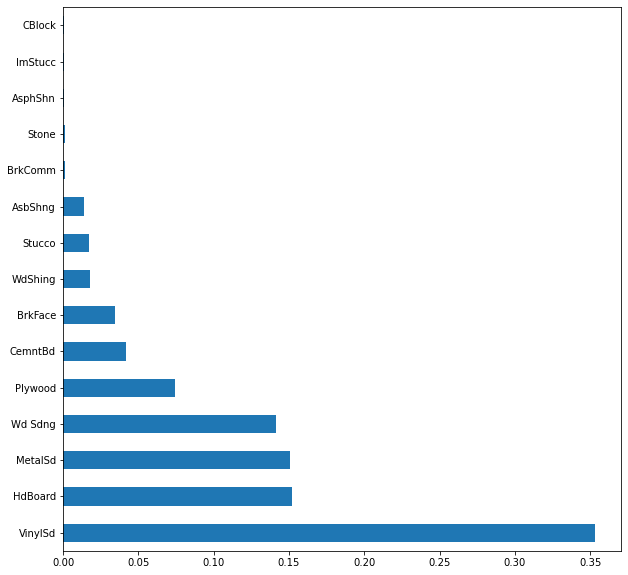

In [139]:
plt.figure(figsize=(10,10))
df['Exterior1st'].value_counts(normalize=True).plot(kind='barh')
plt.show()

around 35% of properties have Vinyl Siding as exterior

In [140]:
df['Exterior1st'].replace(["BrkComm","Stone","AsphShn","ImStucc","CBlock"],"Other",inplace=True)

In [141]:
df.groupby(['Exterior1st']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Exterior1st,,,,,
CemntBd,53.918032787,8186.795081967,115.782786885,1235.327868852,217102.385245902
VinylSd,62.752427184,9803.387378641,115.090533981,1153.250485437,208407.194174757
BrkFace,59.510000000,10663.590000000,2.240000000,1151.580000000,191693.250000000
Plywood,46.907407407,10883.782407407,98.831018519,1151.666666667,175896.430555556
Other,69.428571429,11010.857142857,0.000000000,923.142857143,160857.142857143
HdBoard,51.270270270,9797.020270270,114.347409910,994.527027027,159924.635135135
Stucco,58.240000000,9462.640000000,79.300000000,895.560000000,159813.000000000
MetalSd,53.943181818,8394.934090909,72.007954545,926.259090909,149016.806818182
WdShing,62.153846154,9169.403846154,57.254807692,838.192307692,148734.884615385


In [142]:
df.groupby(['Exterior1st']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Exterior1st,,,,,
CemntBd,47.000000000,8640.000000000,0.000000000,1300.000000000,236500.000000000
VinylSd,68.000000000,9591.000000000,30.000000000,1108.000000000,200000.000000000
Plywood,60.000000000,10505.000000000,0.000000000,1144.500000000,167450.000000000
BrkFace,70.000000000,9574.500000000,0.000000000,1137.000000000,165750.000000000
HdBoard,65.000000000,9754.000000000,62.000000000,966.500000000,149900.000000000
Stucco,55.000000000,8544.000000000,0.000000000,864.000000000,144000.000000000
MetalSd,60.000000000,8402.500000000,0.000000000,894.000000000,139000.000000000
Wd Sdng,60.000000000,9600.000000000,0.000000000,903.500000000,138943.500000000
WdShing,61.500000000,8648.500000000,0.000000000,839.000000000,128700.000000000


We see properties with  Vinyl Siding as exterior have descent selling price

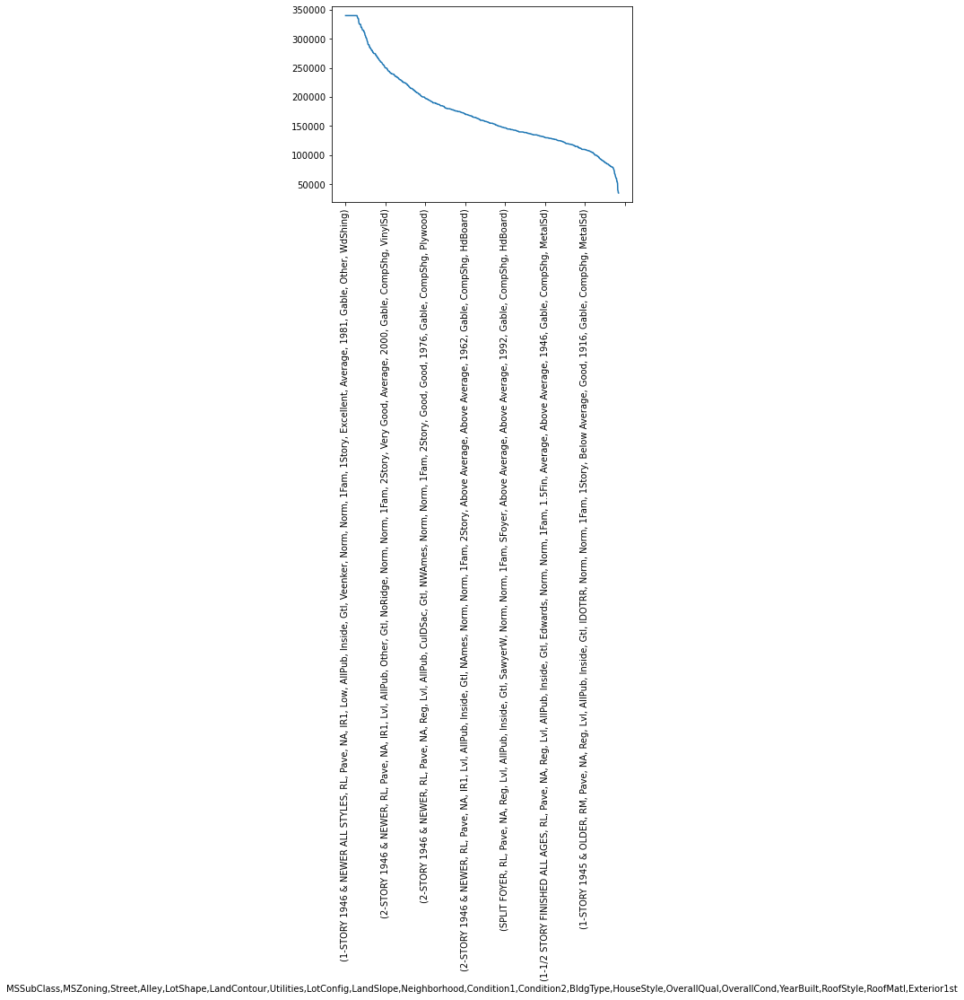

In [143]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

Curve has become bit steeper

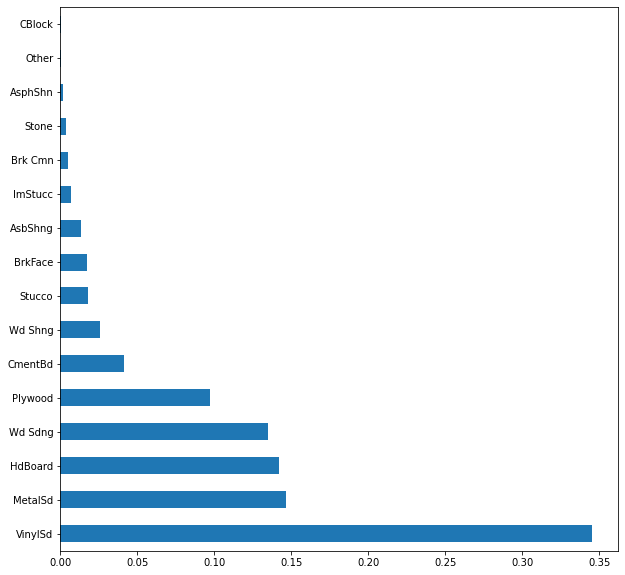

In [144]:
plt.figure(figsize=(10,10))
df['Exterior2nd'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [145]:
df['Exterior2nd'].replace(["Other","CBlock"],"Other",inplace=True)

In [146]:
df.groupby(['Exterior2nd']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Exterior2nd,,,,,
CmentBd,55.516666667,8012.666666667,110.868750000,1241.983333333,217920.758333333
Other,79.500000000,8351.000000000,119.000000000,1327.000000000,212000.000000000
ImStucc,72.050000000,9558.100000000,130.362500000,1341.200000000,211477.500000000
VinylSd,63.139880952,9857.096230159,115.314732143,1153.363095238,208990.517857143
BrkFace,60.940000000,10513.820000000,0.000000000,1237.680000000,190821.000000000
Plywood,50.894366197,11428.883802817,88.012323944,1101.281690141,168112.387323944
HdBoard,49.893719807,9873.198067633,117.602657005,1013.396135266,164280.285024155
Stone,53.400000000,11018.100000000,0.000000000,817.600000000,158224.800000000
Wd Shng,51.894736842,8250.552631579,51.375000000,845.631578947,154805.592105263


In [147]:
df.groupby(['Exterior2nd']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Exterior2nd,,,,,
CmentBd,53.000000000,8570.000000000,0.000000000,1319.000000000,238750.000000000
Other,79.500000000,8351.000000000,119.000000000,1327.000000000,212000.000000000
VinylSd,68.000000000,9595.500000000,25.500000000,1110.500000000,200070.500000000
ImStucc,81.000000000,10174.500000000,45.000000000,1439.000000000,187600.000000000
Stone,60.000000000,8544.000000000,0.000000000,896.000000000,177000.000000000
Plywood,62.500000000,10614.000000000,0.000000000,1073.500000000,160750.000000000
BrkFace,70.000000000,9600.000000000,0.000000000,1246.000000000,160000.000000000
HdBoard,65.000000000,9842.000000000,72.000000000,996.000000000,155000.000000000
Brk Cmn,24.000000000,2308.000000000,0.000000000,855.000000000,147000.000000000


Properties with cement board have the highest average selling price

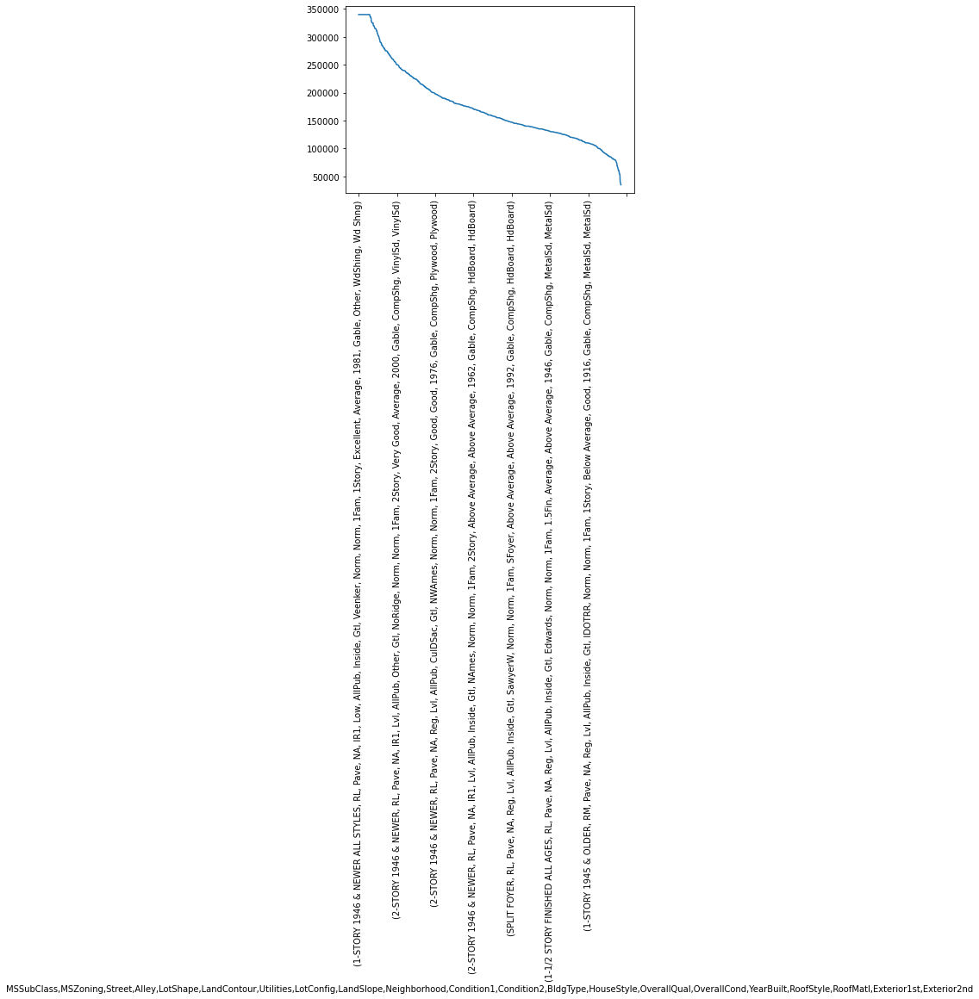

In [148]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

Exterior2nd does not bring any change in average selling price

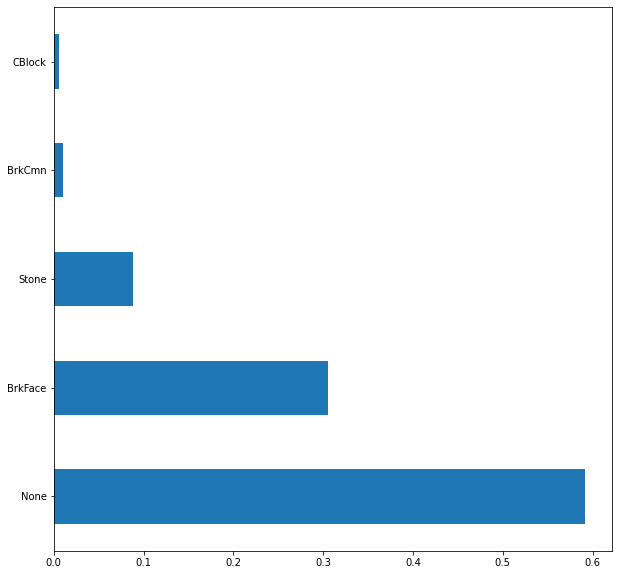

In [149]:
plt.figure(figsize=(10,10))
df['MasVnrType'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [150]:
df['MasVnrType'].replace(["CBlock","BrkCmn"],"Other",inplace=True)

In [151]:
df.groupby(['MasVnrType']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
MasVnrType,,,,,
Stone,69.804687500,10227.097656250,216.251953125,1431.187500000,249253.261718750
BrkFace,55.625842697,9943.719101124,221.502247191,1163.766292135,199859.414606742
Other,49.695652174,10872.347826087,145.152173913,1168.478260870,172247.065217391
None,56.322337963,9376.271990741,1.094907407,932.209490741,155208.899305556


In [152]:
df.groupby(['MasVnrType']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
MasVnrType,,,,,
Stone,77.000000000,10384.000000000,206.500000000,1495.000000000,246839.000000000
BrkFace,70.000000000,10140.000000000,202.000000000,1144.000000000,181000.000000000
Other,65.000000000,9600.000000000,70.000000000,1128.000000000,164900.000000000
None,60.000000000,9000.000000000,0.000000000,907.000000000,143000.000000000


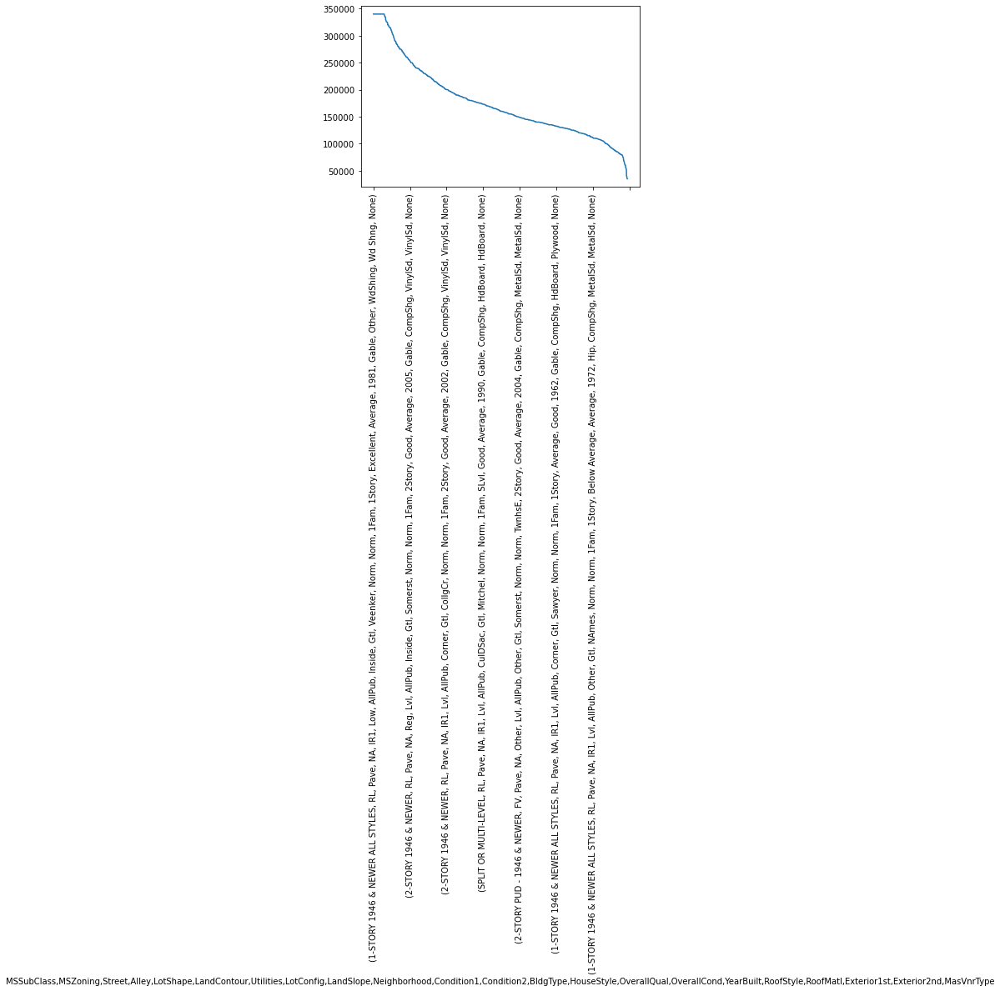

In [153]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

There is no change in average selling price via adding masvnrtype

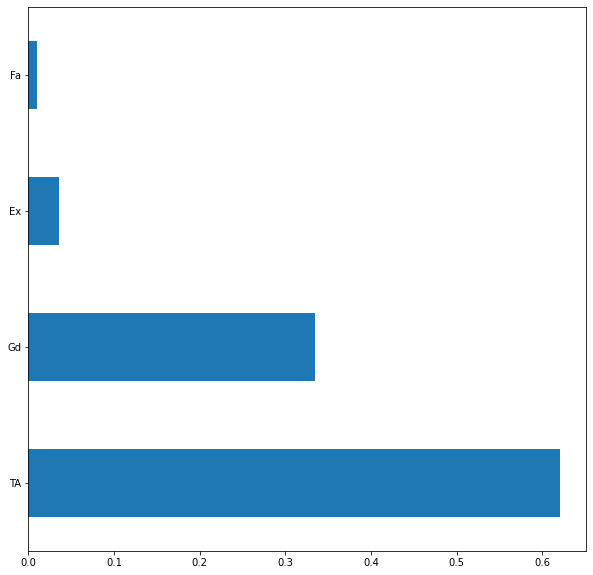

In [154]:
plt.figure(figsize=(10,10))
df['ExterQual'].value_counts(normalize=True).plot(kind='barh')
plt.show()

Aroun 65% of properties have exteriar materials used of average-typical quality

In [155]:
df.groupby(['ExterQual']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
ExterQual,,,,,
Ex,77.528846154,12345.836538462,298.954326923,1690.000000000,309806.519230769
Gd,60.106557377,9881.097336066,122.359887295,1225.600409836,227226.761270492
TA,54.280905077,9387.432671082,61.011037528,924.749448124,144233.594922737
Fa,68.000000000,8300.964285714,0.000000000,684.000000000,87985.214285714


In [156]:
df.groupby(['ExterQual']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
ExterQual,,,,,
Ex,85.000000000,12465.000000000,351.000000000,1740.000000000,340037.500000000
Gd,66.500000000,9944.000000000,72.000000000,1240.000000000,220000.000000000
TA,60.000000000,9110.500000000,0.000000000,912.000000000,139450.000000000
Fa,60.000000000,8435.000000000,0.000000000,768.500000000,82250.000000000


Properties which used excellent external materials have higher selling price on an average, as quality dips , average selling price of property decreases

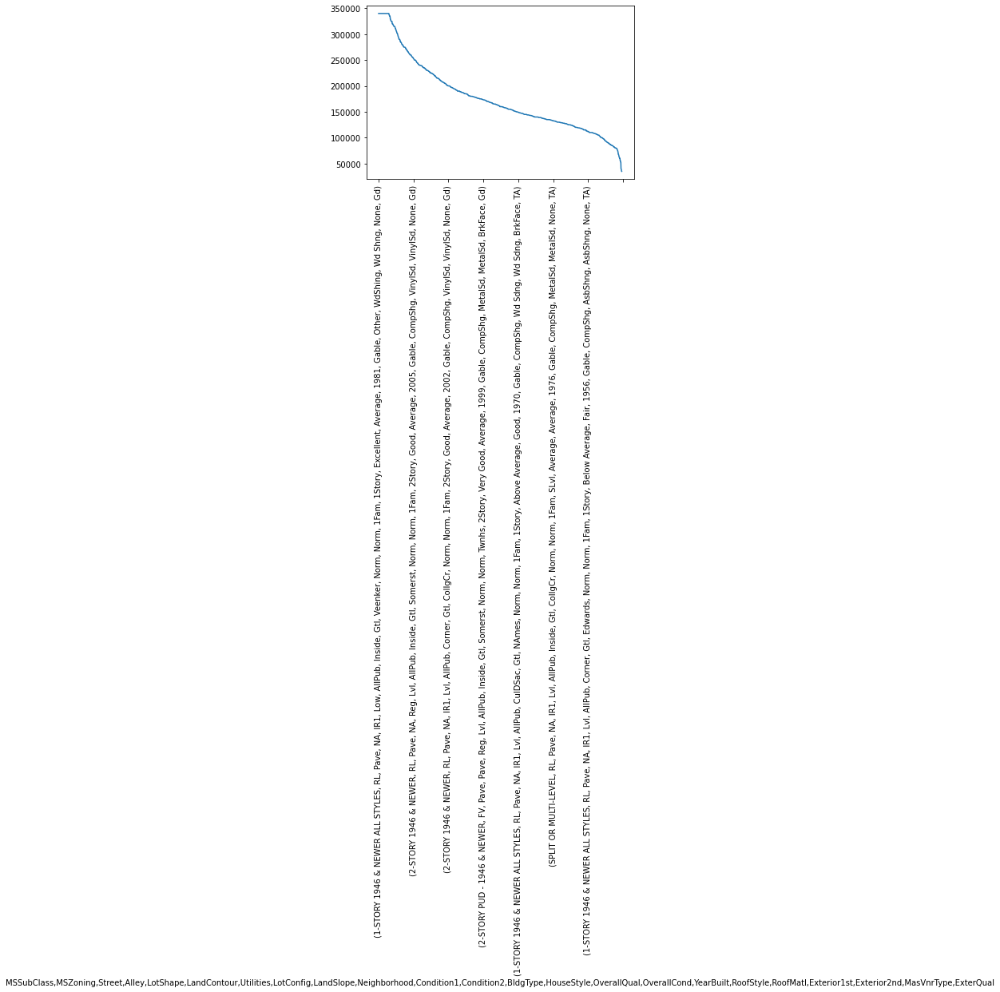

In [157]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

Curve of average selling price has become more steeper comparatively

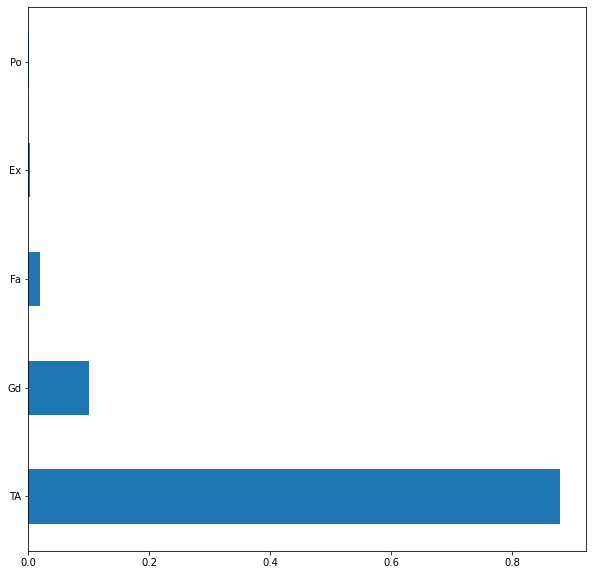

In [158]:
plt.figure(figsize=(10,10))
df['ExterCond'].value_counts(normalize=True).plot(kind='barh')
plt.show()

85% of the properties have Average exterior condition

In [159]:
df.groupby(['ExterCond']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
ExterCond,,,,,
Ex,61.666666667,10835.000000000,0.000000000,874.666666667,201333.333333333
TA,57.825663027,9644.904056162,93.942765211,1066.812792512,180314.094773791
Gd,51.441780822,9927.671232877,63.808219178,978.568493151,165672.568493151
Fa,57.535714286,8325.875000000,27.950892857,696.250000000,102595.142857143
Po,55.000000000,5350.000000000,0.000000000,728.000000000,76500.000000000


In [160]:
df.groupby(['ExterCond']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
ExterCond,,,,,
TA,64.000000000,9536.000000000,0.000000000,1008.000000000,167370.000000000
Ex,60.000000000,9600.000000000,0.000000000,698.000000000,161000.000000000
Gd,60.000000000,9286.500000000,0.000000000,904.000000000,151250.000000000
Fa,60.000000000,8306.000000000,0.000000000,778.000000000,95750.000000000
Po,55.000000000,5350.000000000,0.000000000,728.000000000,76500.000000000


We see that there is a very high priced property which inflate the average price of properties having excellent exterior condition. On an average buyer purchase properties with average-typical condition have higher selling price

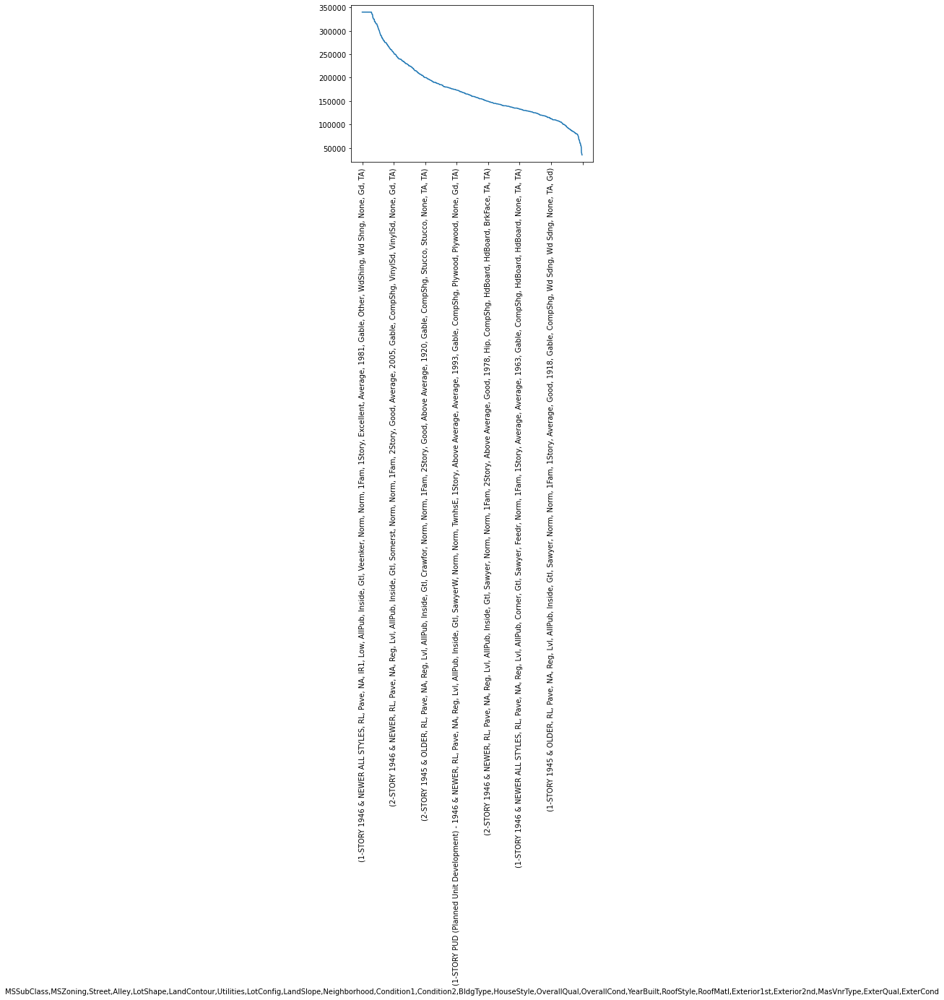

In [161]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

There is no significant change in average selling price because of external condition

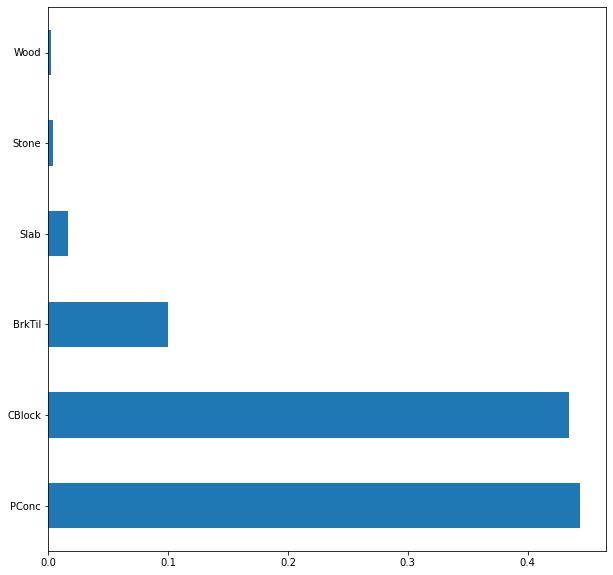

In [162]:
plt.figure(figsize=(10,10))
df['Foundation'].value_counts(normalize=True).plot(kind='barh')
plt.show()

80% of properties have foundation of poured concrete and cinder block

In [163]:
df['Foundation'].replace(['Wood',"Stone"],"Wood & Stone",inplace=True)

In [164]:
df.groupby(['Foundation']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Foundation,,,,,
PConc,59.482998454,9693.374034003,116.838292117,1191.077279753,217630.316074189
Wood & Stone,68.833333333,10167.444444444,0.000000000,882.333333333,172528.333333333
CBlock,54.790220820,9811.537854890,83.273856467,1001.291798107,149508.122239748
BrkTil,57.623287671,8813.732876712,6.833047945,814.910958904,131366.674657534
Slab,51.625000000,8947.770833333,47.734375000,42.000000000,107365.625000000


In [165]:
df.groupby(['Foundation']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Foundation,,,,,
PConc,65.000000000,9591.000000000,22.000000000,1151.000000000,205000.000000000
Wood & Stone,66.000000000,9142.000000000,0.000000000,994.000000000,143000.000000000
CBlock,65.000000000,9600.000000000,0.000000000,954.500000000,141500.000000000
BrkTil,60.000000000,8510.000000000,0.000000000,793.000000000,125250.000000000
Slab,60.000000000,8369.500000000,0.000000000,42.000000000,104150.000000000


Properties with foundation of poured concrete are expensive, their price are significantly higher than others, and yet properties with them are sold more

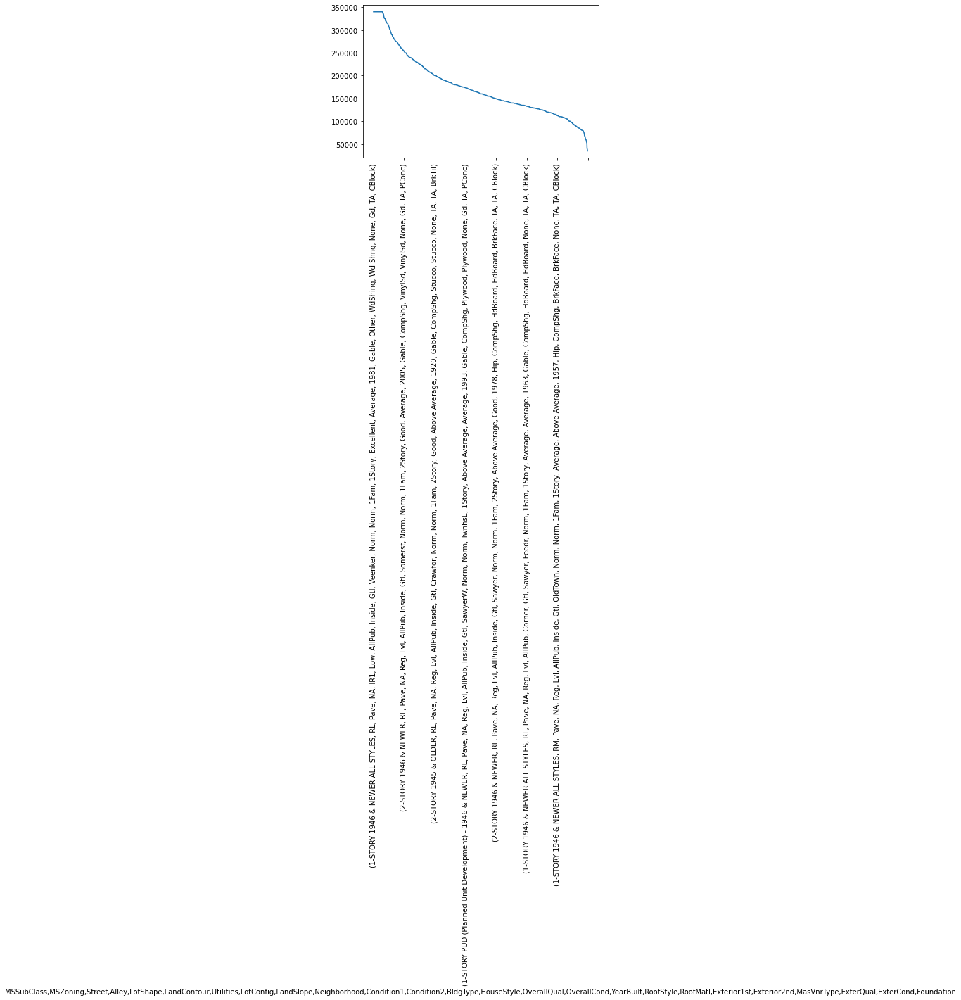

In [166]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

There is no significant difference in average price because of Foundation

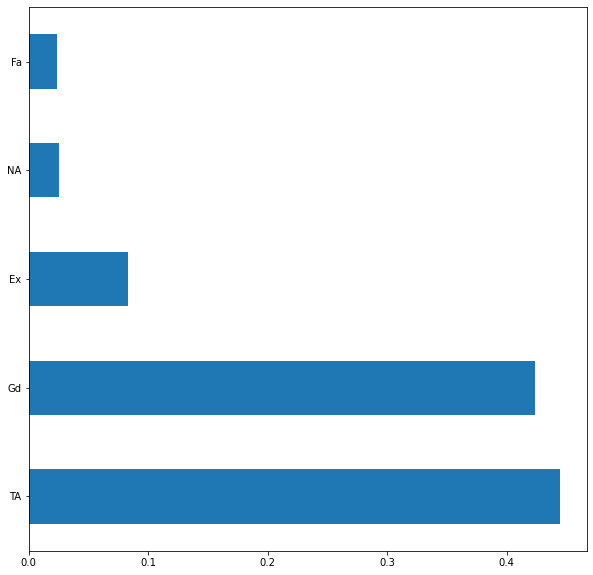

In [167]:
plt.figure(figsize=(10,10))
df['BsmtQual'].value_counts(normalize=True).plot(kind='barh')
plt.show()

There are approx 80% of properties with average or good basement quality

In [168]:
df.groupby(['BsmtQual']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtQual,,,,,
Ex,79.433884298,11581.958677686,236.817148760,1575.942148760,291029.326446281
Gd,54.148867314,9637.404530744,97.268406149,1125.741100324,201543.535598705
TA,55.868258860,9394.375963020,61.307010786,954.953775039,140488.747303544
Fa,60.828571429,8315.342857143,20.989285714,733.028571429,115692.028571429
NA,54.891891892,9185.581081081,33.611486486,42.000000000,105652.891891892


In [169]:
df.groupby(['BsmtQual']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtQual,,,,,
Ex,85.000000000,11924.000000000,270.000000000,1684.000000000,318000.000000000
Gd,64.000000000,9600.000000000,0.000000000,1092.000000000,192070.000000000
TA,60.000000000,9100.000000000,0.000000000,912.000000000,135500.000000000
Fa,60.000000000,8777.000000000,0.000000000,691.000000000,112000.000000000
NA,60.000000000,8544.000000000,0.000000000,42.000000000,101800.000000000


properties with excelent basement quality are significantly expensive than others.

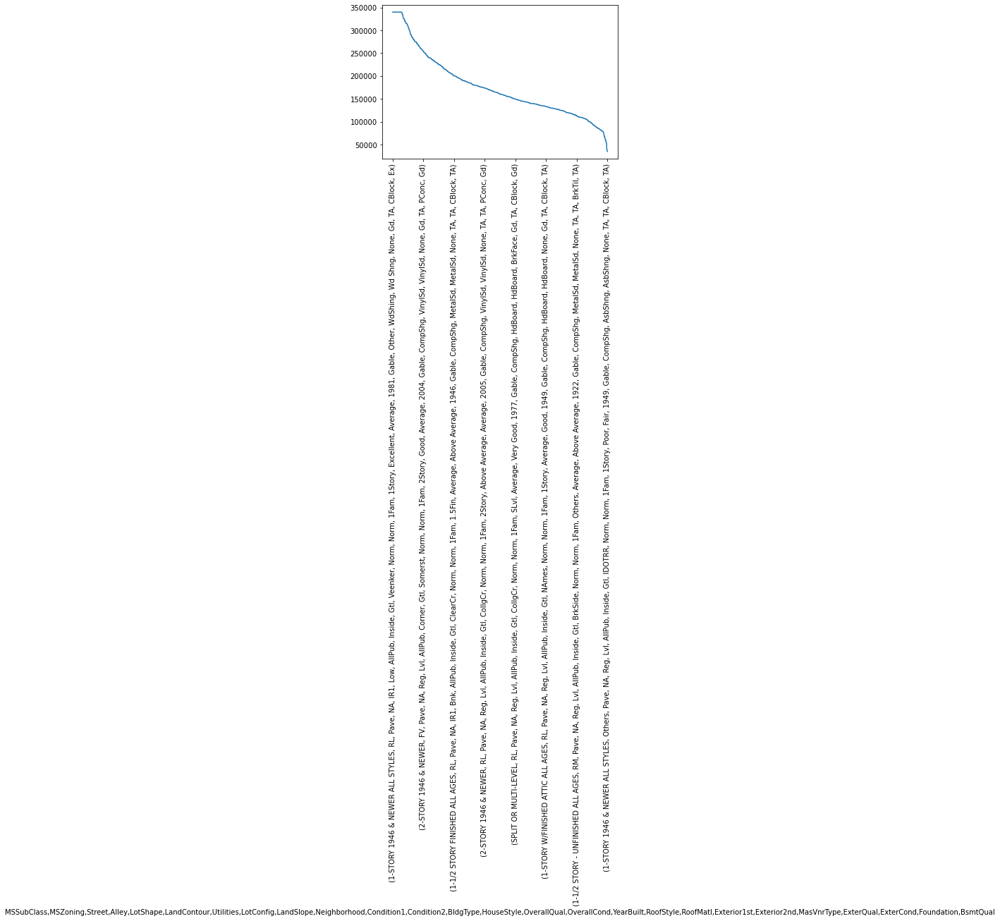

In [170]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

There is no difference in average selling price curve

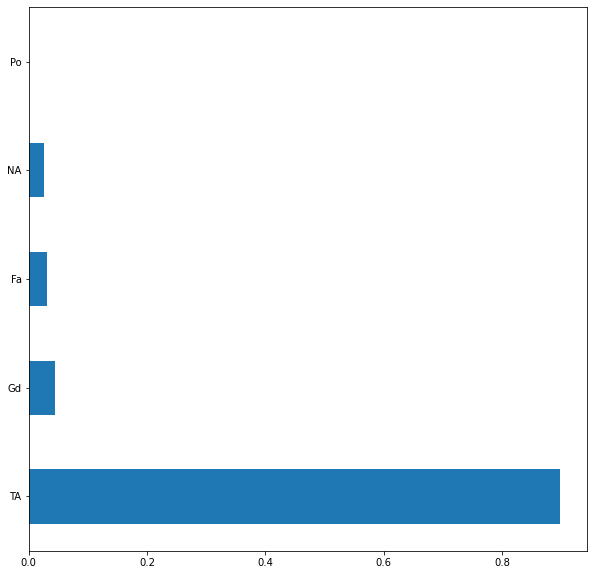

In [171]:
plt.figure(figsize=(10,10))
df['BsmtCond'].value_counts(normalize=True).plot(kind='barh')
plt.show()

85% properties have average basement condition 

In [172]:
df.groupby(['BsmtCond']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtCond,,,,,
Gd,57.953846154,10217.684615385,92.038461538,1131.246153846,210347.415384615
TA,57.205186880,9654.414569031,93.034420290,1081.234935164,179796.232265446
Fa,58.666666667,9005.466666667,29.755555556,869.866666667,121809.533333333
NA,54.891891892,9185.581081081,33.611486486,42.000000000,105652.891891892
Po,30.000000000,9493.500000000,0.000000000,822.000000000,64000.000000000


In [173]:
df.groupby(['BsmtCond']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtCond,,,,,
Gd,60.000000000,9600.000000000,0.000000000,1122.000000000,193879.000000000
TA,64.000000000,9500.000000000,0.000000000,1008.000000000,165000.000000000
Fa,60.000000000,9000.000000000,0.000000000,796.000000000,118500.000000000
NA,60.000000000,8544.000000000,0.000000000,42.000000000,101800.000000000
Po,30.000000000,9493.500000000,0.000000000,822.000000000,64000.000000000


Properties with good basement condition have bit significant difference in average sale price, and have higher average selling price

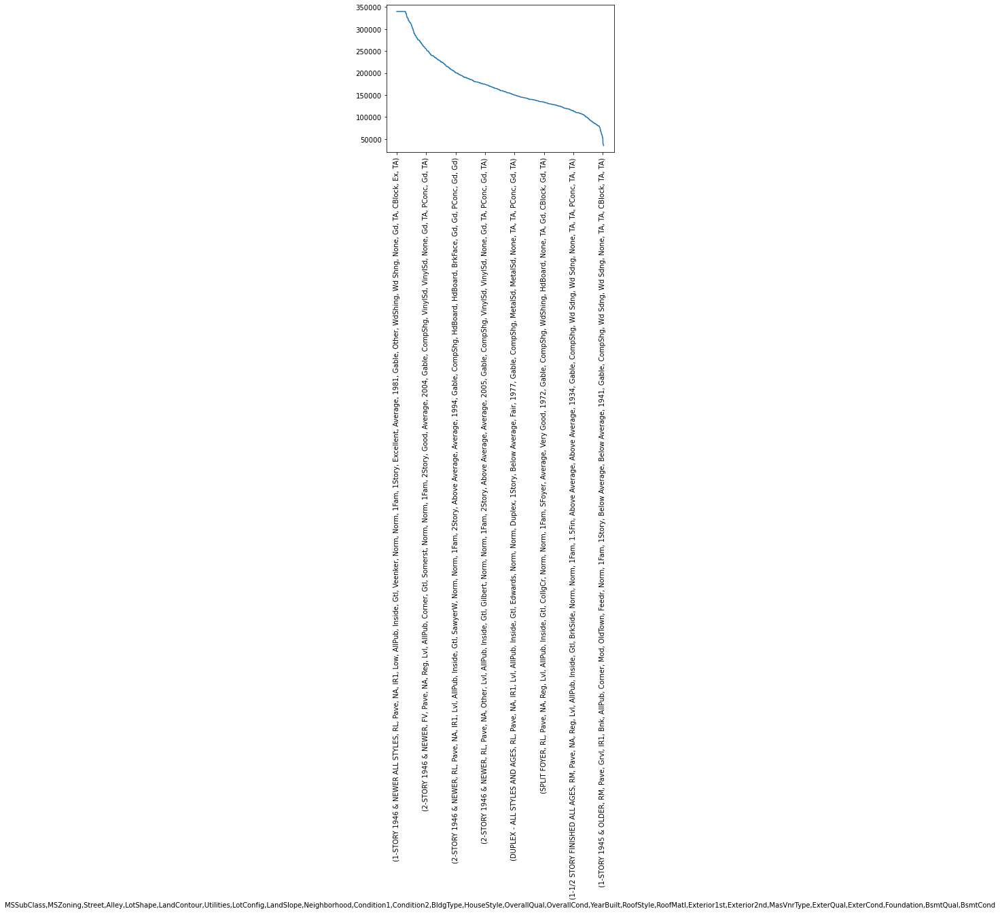

In [174]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

Average selling price curve becomes less steeper due to basement condition

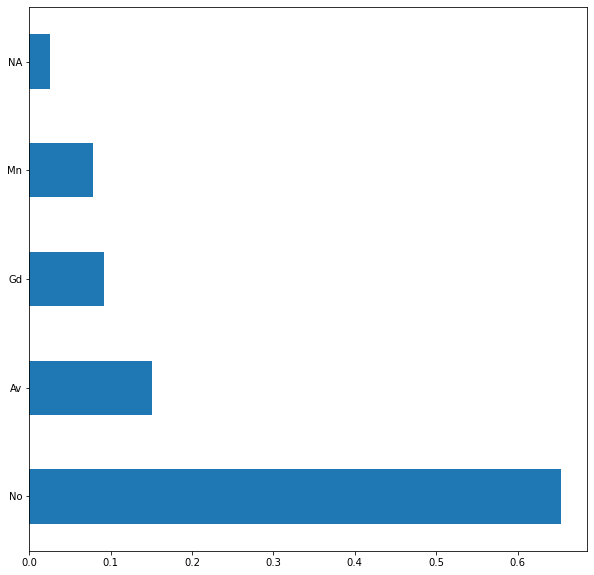

In [175]:
plt.figure(figsize=(10,10))
df['BsmtExposure'].value_counts(normalize=True).plot(kind='barh')
plt.show()

65% of properties doe not have exposure from basement

In [176]:
df.groupby(['BsmtExposure']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtExposure,,,,,
Gd,61.250000000,12154.962686567,153.478544776,1398.305970149,236992.391791045
Av,59.549773756,9929.780542986,110.348416290,1181.253393665,200432.579185520
Mn,58.315789474,10333.267543860,81.391447368,1099.043859649,189796.210526316
No,56.014690451,9160.624344176,78.608473242,1004.366211962,164861.514165792
NA,55.157894737,9312.434210526,36.516447368,65.526315789,107938.342105263


In [177]:
df.groupby(['BsmtExposure']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtExposure,,,,,
Gd,72.500000000,12386.000000000,113.500000000,1442.000000000,226975.000000000
Av,68.000000000,9873.000000000,32.000000000,1144.000000000,185850.000000000
Mn,64.500000000,10253.500000000,0.000000000,1058.000000000,182450.000000000
No,60.000000000,9120.000000000,0.000000000,941.000000000,154000.000000000
NA,60.000000000,8544.000000000,0.000000000,42.000000000,104025.000000000


Properties with good basement exposure are expensive

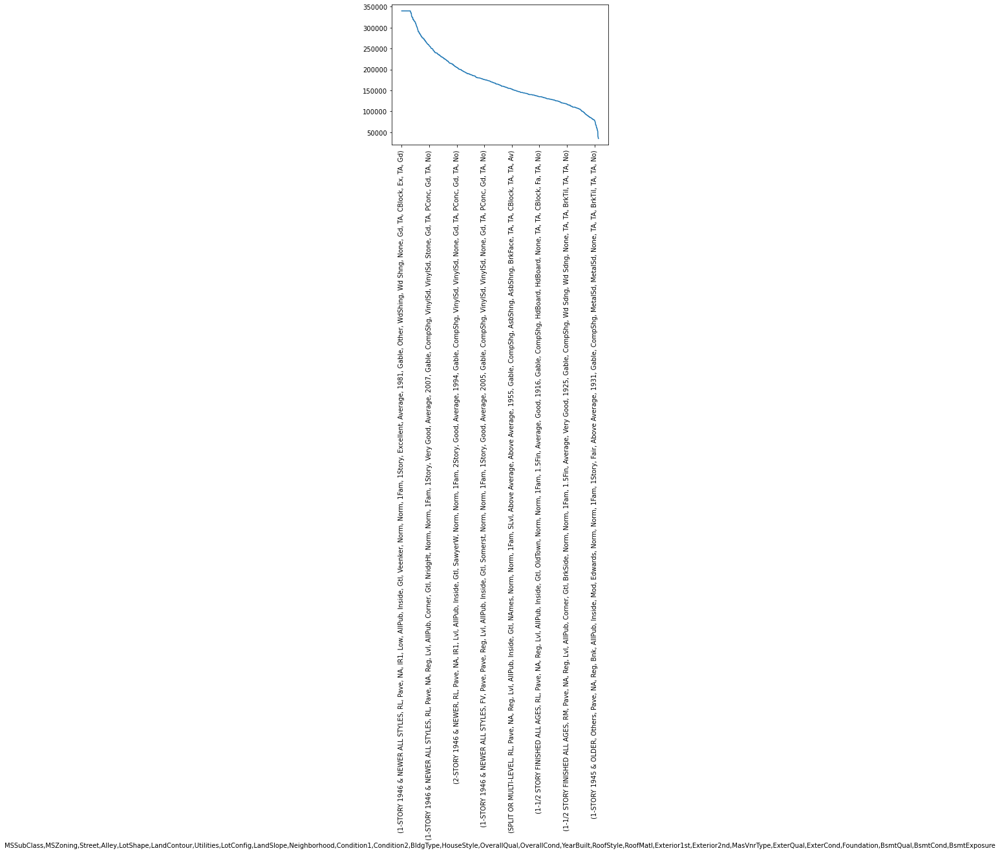

In [178]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

There is no change evident in average selling price when introduced BsmtExposure variable 

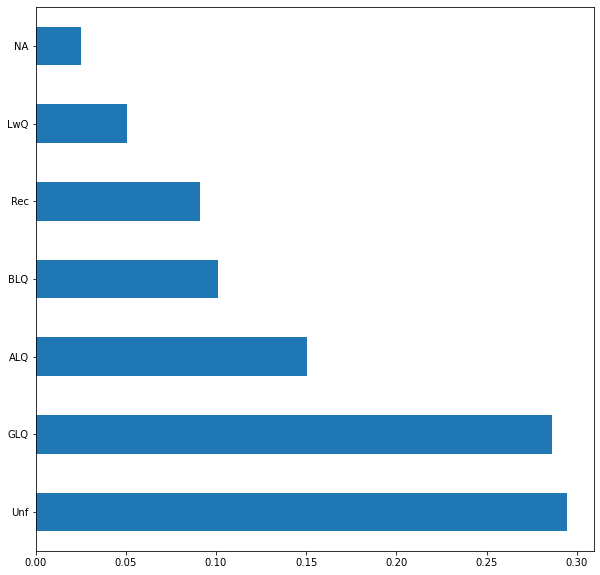

In [179]:
plt.figure(figsize=(10,10))
df['BsmtFinType1'].value_counts(normalize=True).plot(kind='barh')
plt.show()

60% of the properties have unfinished or good living quarters of basement

In [180]:
df.groupby(['BsmtFinType1']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtFinType1,,,,,
GLQ,58.045454545,9866.430622010,139.741028708,1251.557416268,225698.870813397
Unf,60.177906977,9357.910465116,65.547965116,978.879069767,168607.412790698
ALQ,53.413636364,9541.450000000,73.772159091,1039.009090909,160514.318181818
LwQ,52.128378378,9110.486486486,50.057432432,1024.445945946,151852.702702703
BLQ,51.766891892,10114.550675676,70.989864865,1002.912162162,149364.854729730
Rec,60.552631579,9977.458646617,92.117481203,1014.488721805,146581.259398496
NA,54.891891892,9185.581081081,33.611486486,42.000000000,105652.891891892


In [181]:
df.groupby(['BsmtFinType1']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtFinType1,,,,,
GLQ,65.000000000,9696.000000000,99.500000000,1223.500000000,213750.000000000
Unf,60.000000000,9157.000000000,0.000000000,894.000000000,161750.000000000
ALQ,61.000000000,9575.000000000,0.000000000,995.500000000,149250.000000000
Rec,70.000000000,9500.000000000,0.000000000,979.000000000,142000.000000000
BLQ,60.000000000,9838.500000000,0.000000000,971.500000000,139100.000000000
LwQ,60.000000000,8938.500000000,0.000000000,949.000000000,139000.000000000
NA,60.000000000,8544.000000000,0.000000000,42.000000000,101800.000000000


Properties with good living quarter of unfinished basement have higher selling price on an average compared to others.

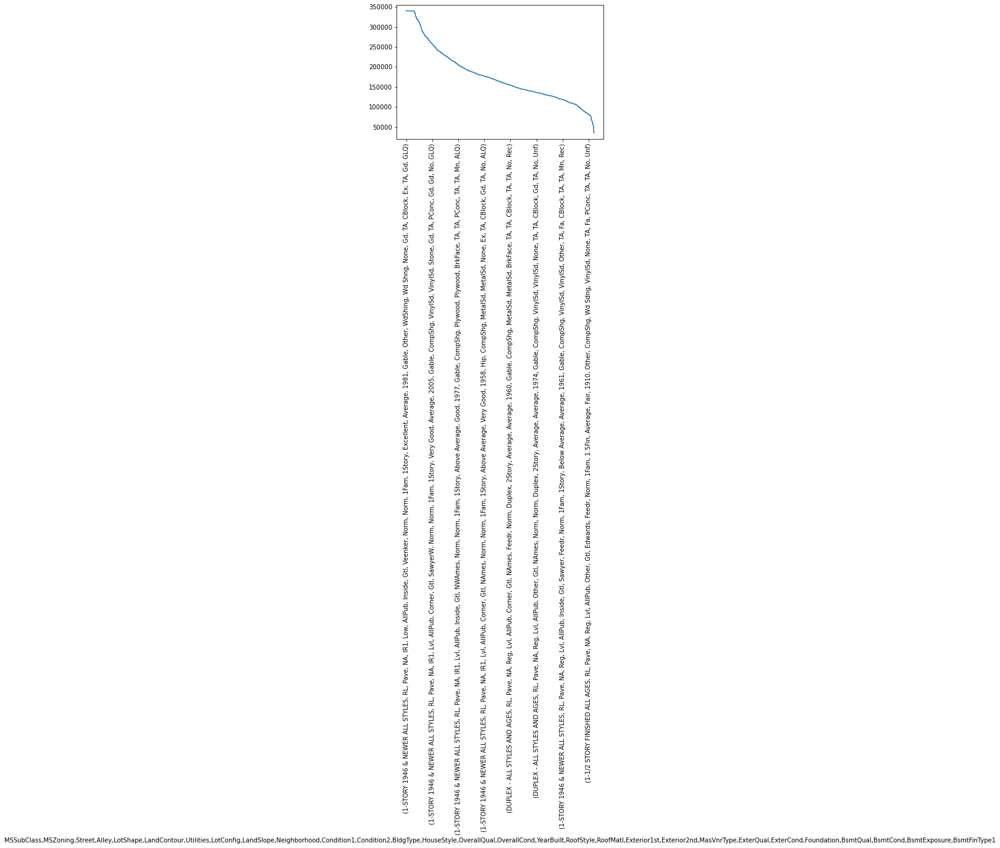

In [182]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

No significant change in average price evident

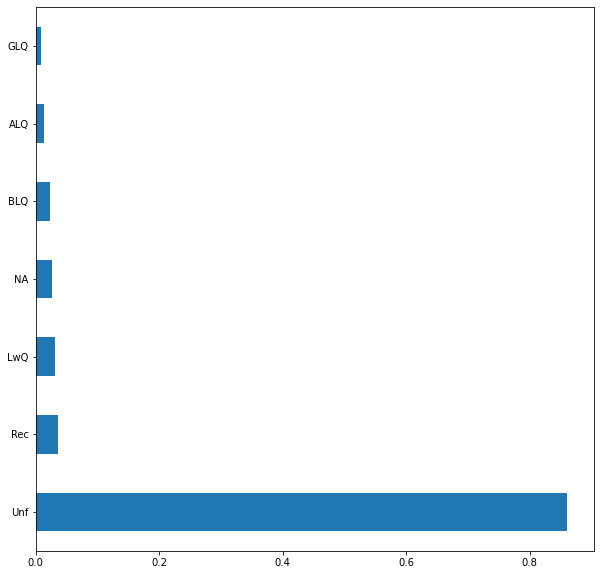

In [183]:
plt.figure(figsize=(10,10))
df['BsmtFinType2'].value_counts(normalize=True).plot(kind='barh')
plt.show()

85% of properties have unfinished second basement

In [184]:
df.groupby(['BsmtFinType2']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtFinType2,,,,,
ALQ,53.631578947,11379.052631579,97.822368421,1159.947368421,198628.289473684
GLQ,59.071428571,9009.392857143,12.214285714,1123.214285714,180982.142857143
Unf,57.566878981,9559.444267516,93.817376592,1071.680732484,180770.303343949
LwQ,53.793478261,10227.250000000,71.288043478,1081.760869565,164364.130434783
Rec,52.518518519,10954.740740741,74.490740741,1119.740740741,163122.222222222
BLQ,58.106060606,9807.878787879,55.382575758,1083.151515152,151101.000000000
NA,55.684210526,9224.250000000,40.516447368,94.894736842,110346.236842105


In [185]:
df.groupby(['BsmtFinType2']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtFinType2,,,,,
GLQ,54.500000000,9359.500000000,0.000000000,1092.000000000,203125.000000000
ALQ,57.000000000,10650.000000000,0.000000000,1127.000000000,174900.000000000
Unf,63.000000000,9400.000000000,0.000000000,992.000000000,167000.000000000
LwQ,65.500000000,9973.500000000,0.000000000,1046.500000000,154000.000000000
Rec,65.000000000,9810.000000000,0.000000000,1051.000000000,148750.000000000
BLQ,60.000000000,9200.000000000,0.000000000,1029.000000000,143000.000000000
NA,60.000000000,8544.000000000,0.000000000,42.000000000,104025.000000000


We notice that there is/are a/some property with second basement of average living quarter type, selling price is higher which has inflated average of selling price.

We notice that on an average people purchase property with second basement as good living quarter by paying more than other types 

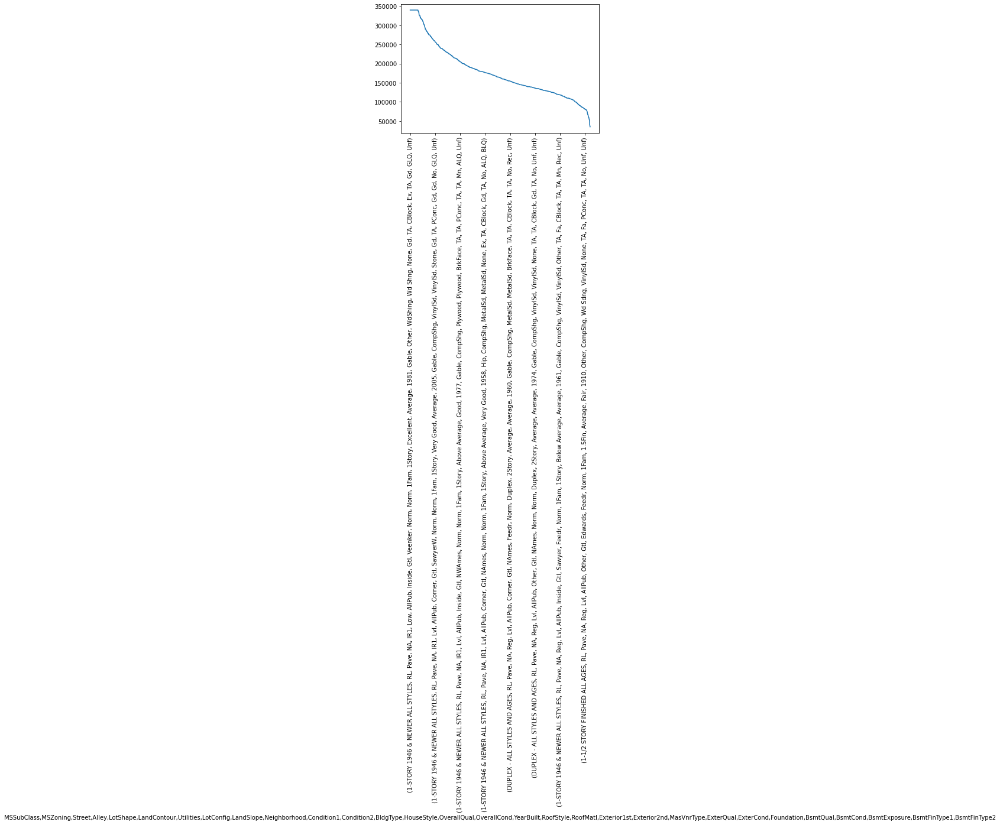

In [186]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

Second basement finish does not affect average selling price that significantly , average is remaining the constant 

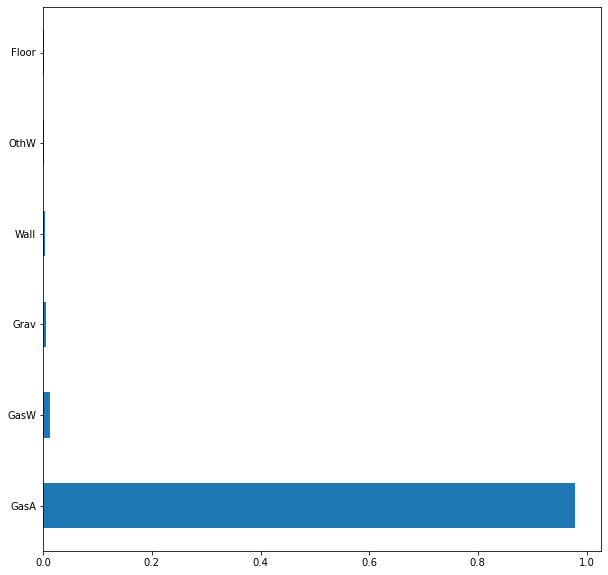

In [187]:
plt.figure(figsize=(10,10))
df['Heating'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [188]:
df['Heating'].replace(['Grav','Wall','OthW','Floor'],"Other",inplace=True)

In [189]:
df.groupby(['Heating']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Heating,,,,,
GasA,57.088235294,9650.567577031,90.933648459,1056.261904762,178375.568627451
GasW,71.194444444,10700.833333333,18.888888889,1048.888888889,164689.805555556
Other,49.321428571,7968.642857143,24.285714286,439.285714286,87092.857142857


In [190]:
df.groupby(['Heating']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Heating,,,,,
GasA,63.000000000,9478.500000000,0.000000000,993.500000000,164500.000000000
GasW,62.500000000,10053.000000000,0.000000000,1015.000000000,134950.000000000
Other,53.000000000,8474.500000000,0.000000000,586.000000000,88750.000000000


Average selling Price is almost similar between properties with heting type Gas A and Gas W. It is just mostly on an average people while purchasing property pay more for properties with heating type Gas A than rest

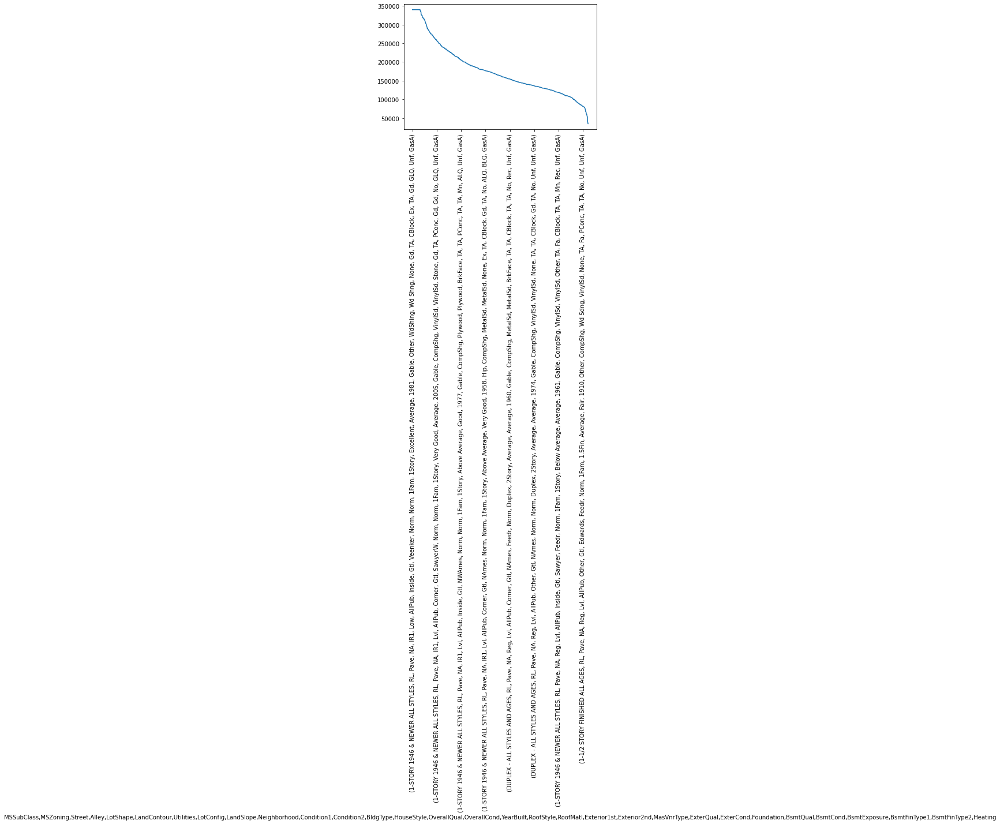

In [191]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

it appears to be that there lies 4 cluster for different property types. There is no change in average selling price

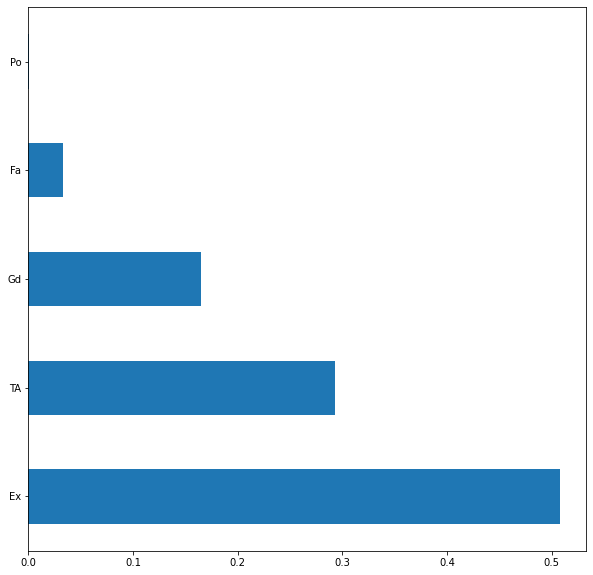

In [192]:
plt.figure(figsize=(10,10))
df['HeatingQC'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [193]:
df.groupby(['HeatingQC']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
HeatingQC,,,,,
Ex,60.565452092,9866.410931174,112.016194332,1162.981106613,208056.122807018
Gd,54.510373444,9353.738589212,62.955394191,936.128630705,156423.653526971
TA,53.514018692,9505.984813084,70.697137850,950.179906542,142236.649532710
Fa,51.510204082,9109.459183673,42.829081633,787.734693878,123919.489795918
Po,50.000000000,5000.000000000,0.000000000,720.000000000,87000.000000000


In [194]:
df.groupby(['HeatingQC']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
HeatingQC,,,,,
Ex,65.000000000,9600.000000000,0.000000000,1113.000000000,194700.000000000
Gd,60.000000000,9156.000000000,0.000000000,896.000000000,152000.000000000
TA,60.000000000,9202.000000000,0.000000000,926.500000000,135000.000000000
Fa,60.000000000,8854.000000000,0.000000000,792.000000000,123500.000000000
Po,50.000000000,5000.000000000,0.000000000,720.000000000,87000.000000000


50% home purchased have 50% excellent quality heating. Properties price for such are more as compared to rest on an average



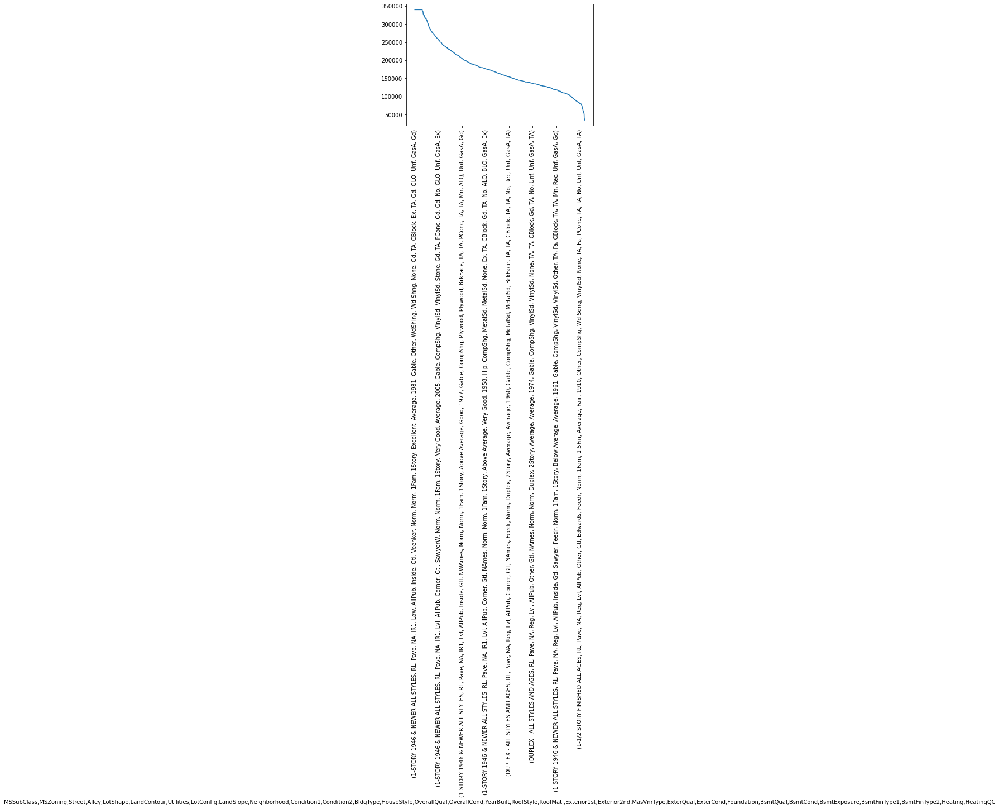

In [195]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

heating quality does not affect the average selling price

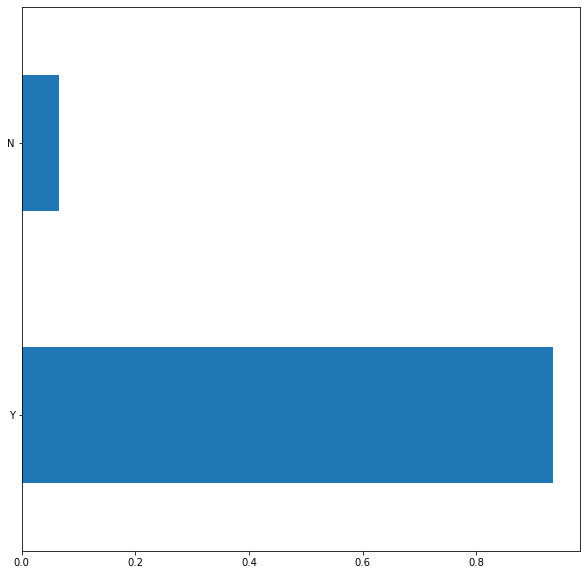

In [196]:
plt.figure(figsize=(10,10))
df['CentralAir'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties have central air system

In [197]:
df.groupby(['CentralAir']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
CentralAir,,,,,
Y,57.064102564,9733.760805861,94.486172161,1073.446153846,182347.209890110
N,58.963157895,8406.347368421,16.417105263,717.031578947,105264.073684211


In [198]:
df.groupby(['CentralAir']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
CentralAir,,,,,
Y,64.000000000,9554.000000000,0.000000000,1012.000000000,168000.000000000
N,60.000000000,8470.000000000,0.000000000,735.000000000,98000.000000000


Properties with central air sytem are more expensive

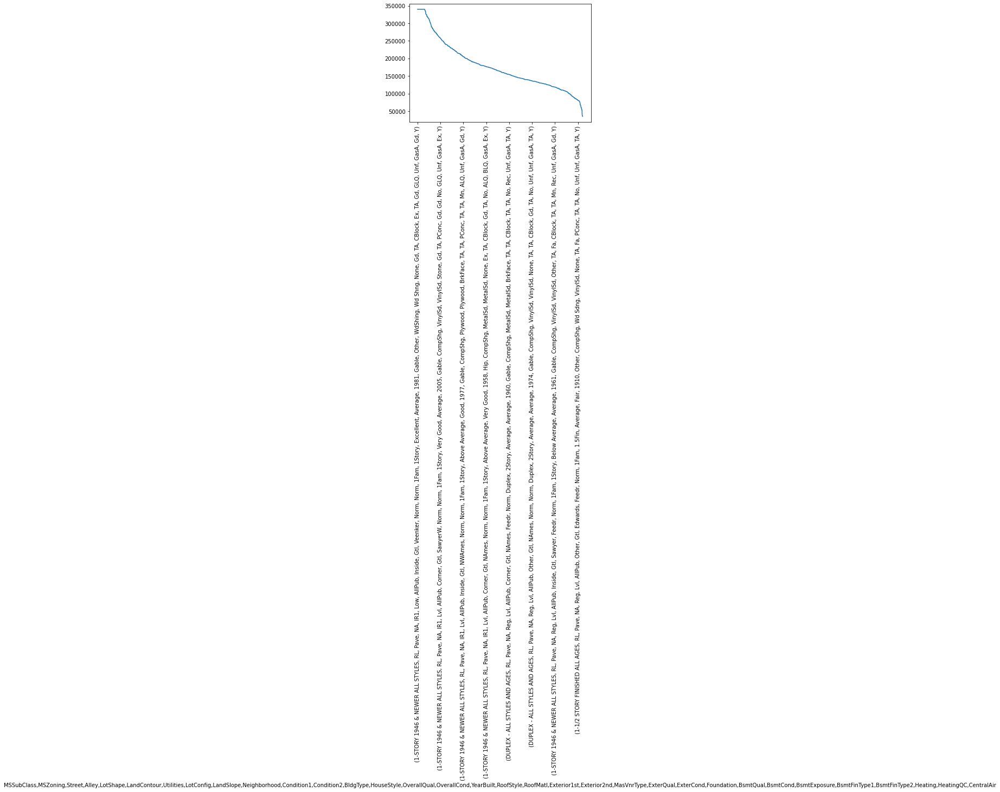

In [199]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

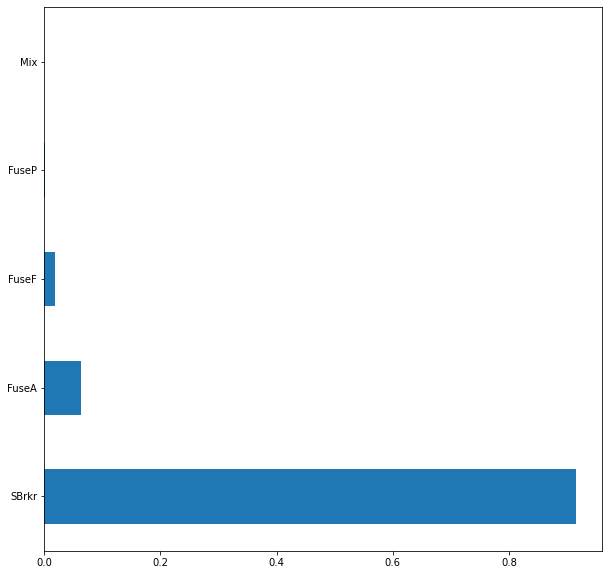

In [200]:
plt.figure(figsize=(10,10))
df['Electrical'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [201]:
df['Electrical'].replace(["Mix","FuseP"],"Other",inplace=True)

In [202]:
df.groupby(['Electrical']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Electrical,,,,,
SBrkr,57.264044944,9714.013857678,94.602808989,1072.271910112,182884.856554307
FuseA,55.281914894,9154.351063830,28.130319149,860.734042553,122196.893617021
FuseF,60.222222222,8410.666666667,59.046296296,676.925925926,107675.444444444
Other,56.000000000,7345.250000000,0.000000000,675.750000000,89750.000000000


In [203]:
df.groupby(['Electrical']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Electrical,,,,,
SBrkr,64.000000000,9587.000000000,0.000000000,1010.000000000,170000.000000000
FuseA,60.000000000,8759.000000000,0.000000000,879.000000000,121250.000000000
FuseF,60.000000000,8248.000000000,0.000000000,793.000000000,115000.000000000
Other,62.500000000,7503.500000000,0.000000000,820.500000000,77500.000000000


properties with standard breaker circuit are expensive on an average

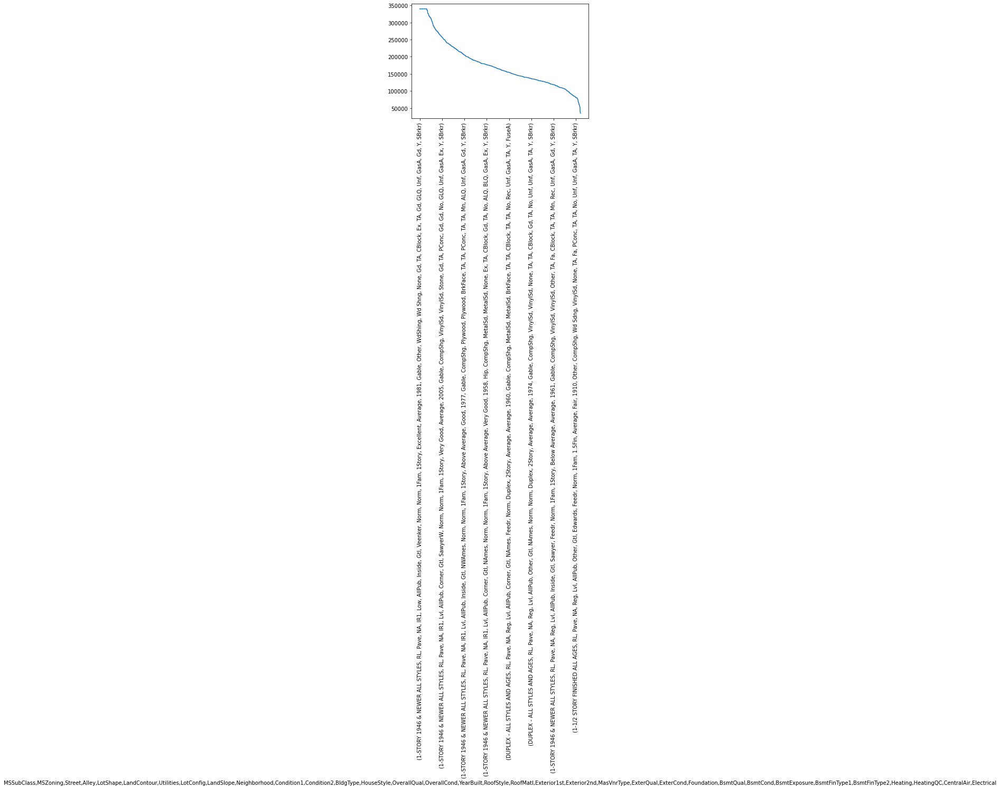

In [204]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

Electrical does not change the average selling price

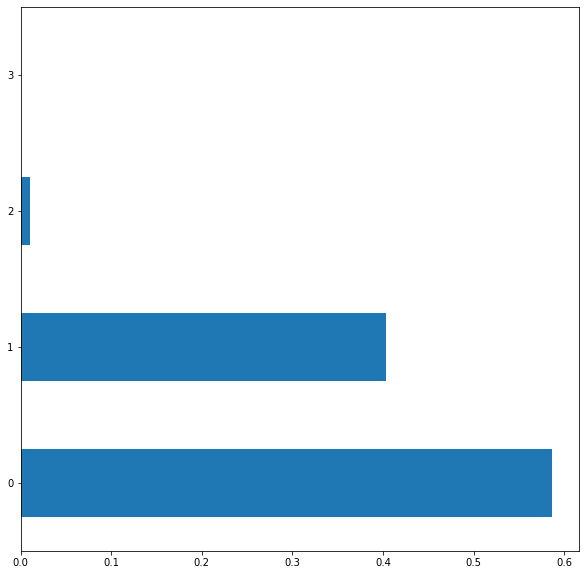

In [205]:
plt.figure(figsize=(10,10))
df['BsmtFullBath'].value_counts(normalize=True).plot(kind='barh')
plt.show()

96% of properties either have only one full bath or no in basement

In [206]:
df.groupby(['BsmtFullBath']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtFullBath,,,,,
2,67.100000000,12953.500000000,59.041666667,1492.066666667,207734.733333333
1,56.331632653,10026.090136054,108.171556122,1182.493197279,196509.162414966
3,60.000000000,10800.000000000,0.000000000,1200.000000000,179000.000000000
0,57.598714953,9327.970794393,77.152745327,951.501168224,163623.387850467


In [207]:
df.groupby(['BsmtFullBath']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtFullBath,,,,,
2,64.000000000,12900.000000000,0.000000000,1437.000000000,188000.000000000
3,60.000000000,10800.000000000,0.000000000,1200.000000000,179000.000000000
1,65.000000000,9744.000000000,0.000000000,1114.000000000,178800.000000000
0,60.000000000,9245.000000000,0.000000000,910.000000000,154150.000000000


Properties with no or one full bath in basement , tend to sell less for cheap price comparatively. But there are properties with 1 full bath in basement whos price is inflated.

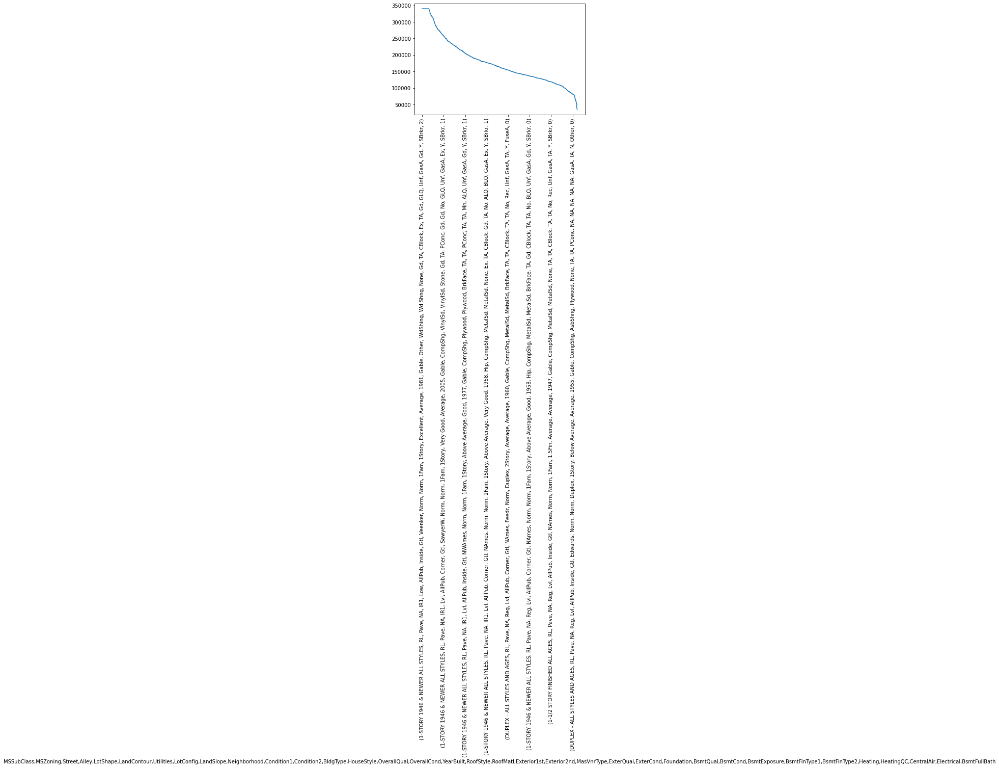

In [208]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

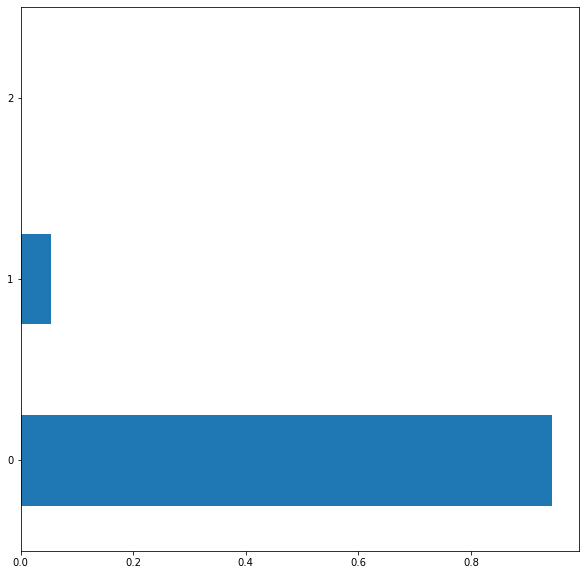

In [209]:
plt.figure(figsize=(10,10))
df['BsmtHalfBath'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties have 0 half bath in basement

In [210]:
df.groupby(['BsmtHalfBath']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtHalfBath,,,,,
0,57.414731495,9604.520682148,88.490203193,1050.211175617,177766.257256894
1,53.606250000,10460.437500000,103.396875000,1049.725000000,170255.312500000
2,44.000000000,6661.000000000,161.000000000,1101.500000000,160850.500000000


In [211]:
df.groupby(['BsmtHalfBath']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BsmtHalfBath,,,,,
0,63.000000000,9451.000000000,0.000000000,990.500000000,163250.000000000
2,44.000000000,6661.000000000,161.000000000,1101.500000000,160850.500000000
1,60.000000000,10005.500000000,0.000000000,1022.500000000,159000.000000000


Properties with no half bath in basement are sold on higher prices

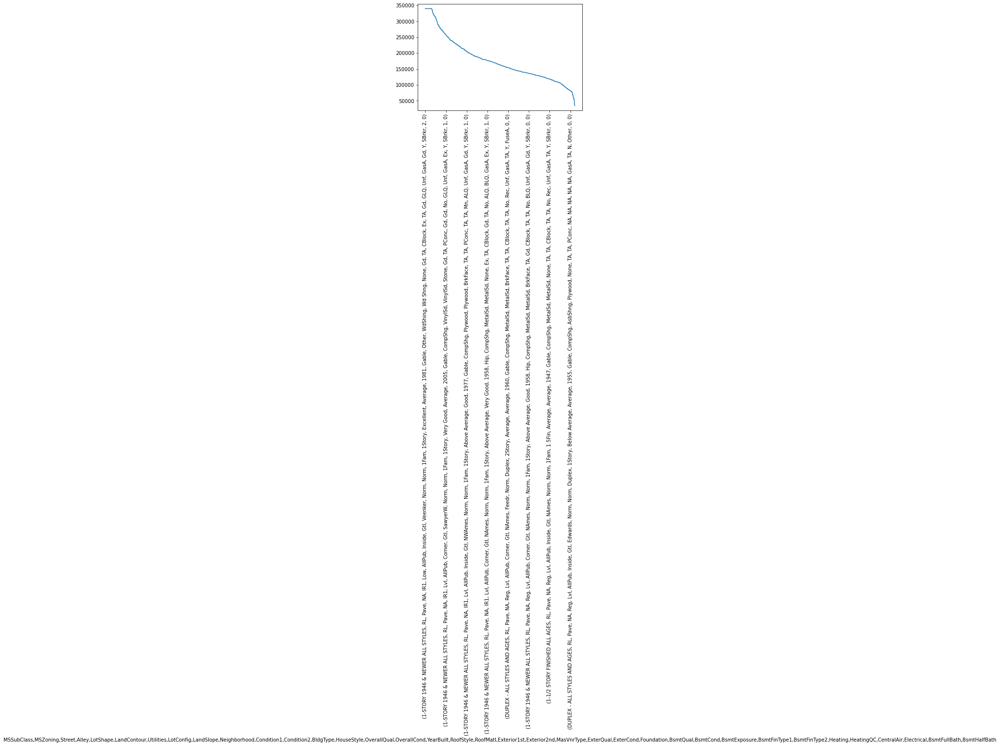

In [212]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

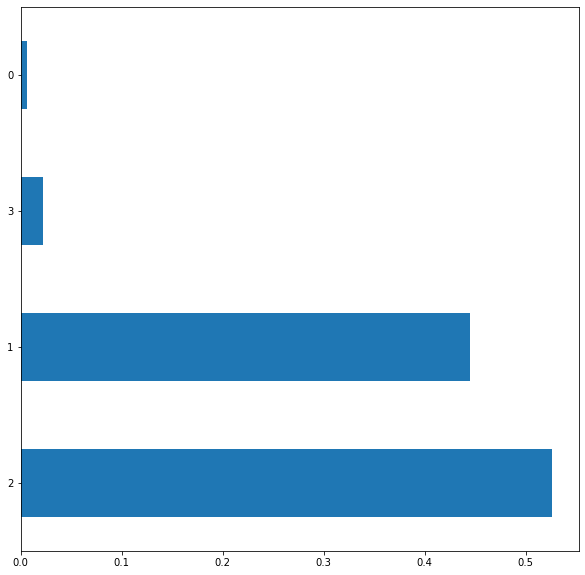

In [213]:
plt.figure(figsize=(10,10))
df['FullBath'].value_counts(normalize=True).plot(kind='barh')
plt.show()

98% of properties have atleast 1 full bath

In [214]:
df.groupby(['FullBath']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
FullBath,,,,,
3,79.393939394,13597.181818182,187.018939394,1377.666666667,280267.772727273
2,59.104166667,10123.619791667,118.736816406,1160.391927083,209361.359375000
0,39.888888889,10603.555555556,38.555555556,1064.777777778,160205.055555556
1,54.035384615,8870.934615385,50.499615385,903.300000000,134498.188461538


In [215]:
df.groupby(['FullBath']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
FullBath,,,,,
3,84.000000000,13518.000000000,143.000000000,1410.000000000,320000.000000000
2,65.000000000,10084.000000000,30.000000000,1137.000000000,196750.000000000
0,53.000000000,10020.000000000,0.000000000,1086.000000000,145000.000000000
1,60.000000000,8762.500000000,0.000000000,894.000000000,132375.000000000


Properties with 3 full baths are sold on higher prices

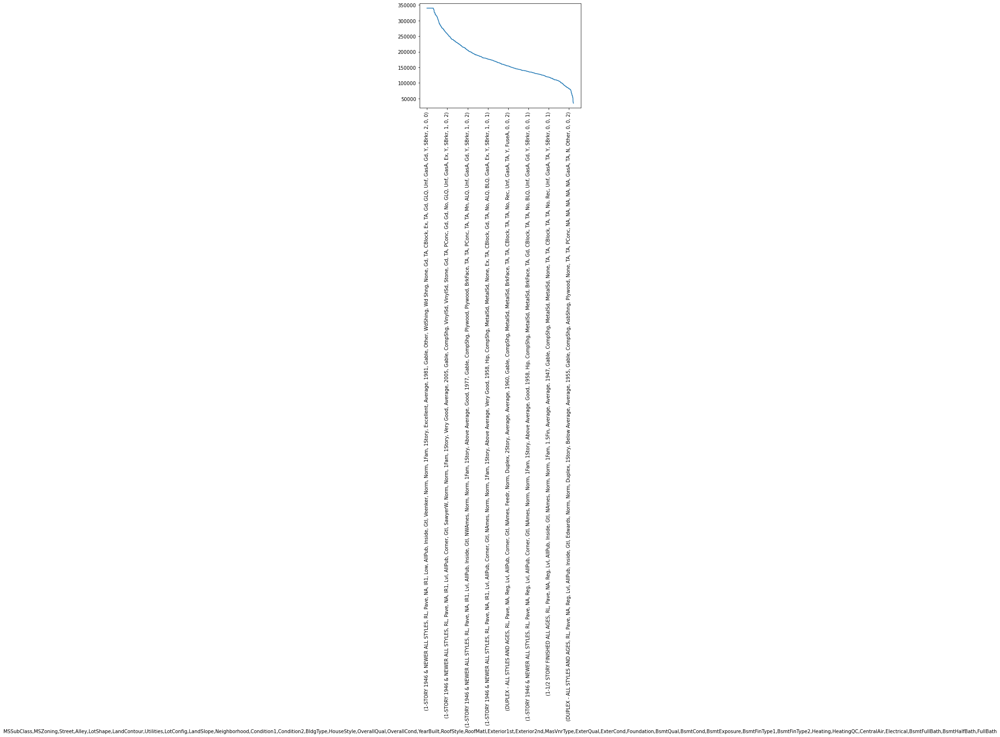

In [216]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

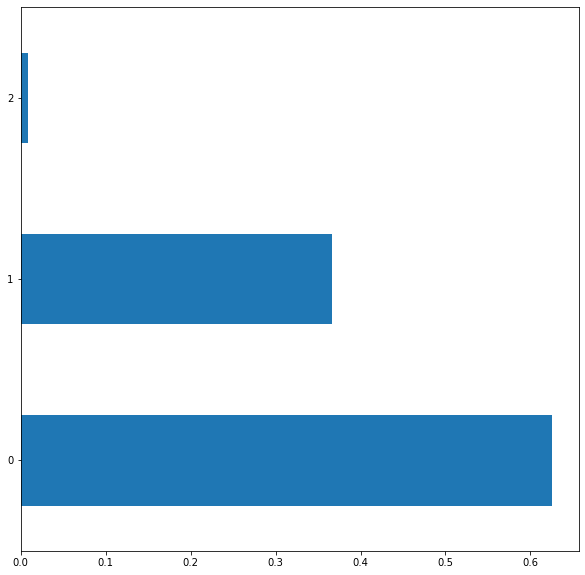

In [217]:
plt.figure(figsize=(10,10))
df['HalfBath'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties have no or 1 half bath

In [218]:
df.groupby(['HalfBath']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
HalfBath,,,,,
1,56.300000000,10092.121495327,123.050700935,1014.413084112,205217.539252336
2,60.750000000,10644.958333333,154.083333333,1047.416666667,162028.916666667
0,57.661007667,9373.671412924,68.841319825,1071.294633078,161192.002190581


In [219]:
df.groupby(['HalfBath']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
HalfBath,,,,,
1,65.000000000,10120.000000000,0.000000000,939.000000000,189000.000000000
2,65.500000000,11003.000000000,132.000000000,1063.000000000,159243.500000000
0,60.000000000,9017.000000000,0.000000000,1026.000000000,143000.000000000


Properties with 1 half bath are expensive

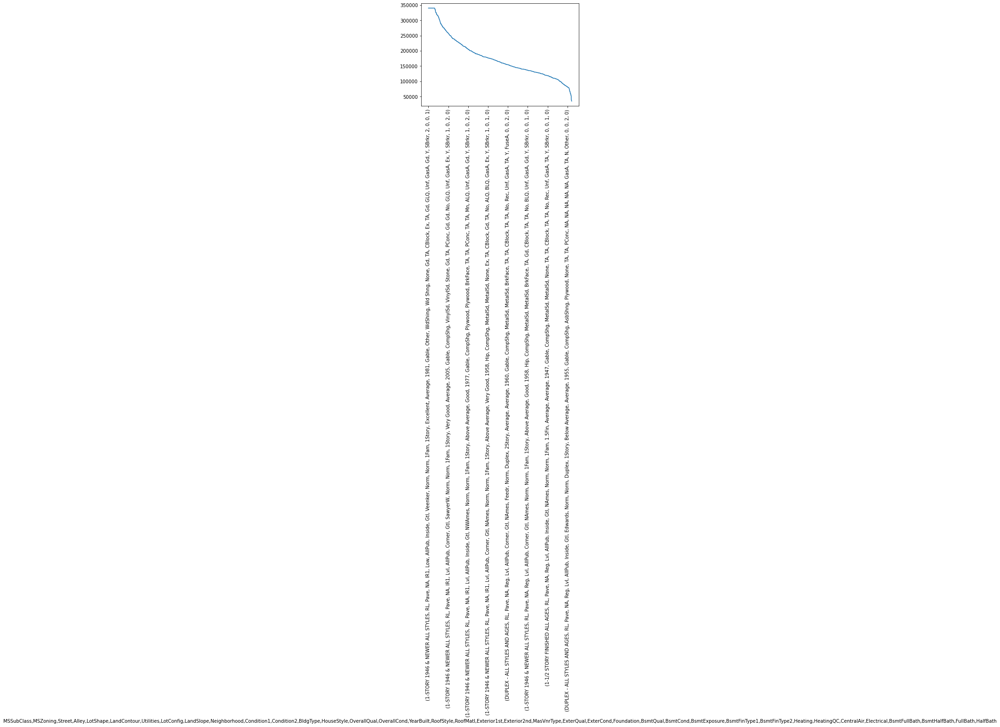

In [220]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

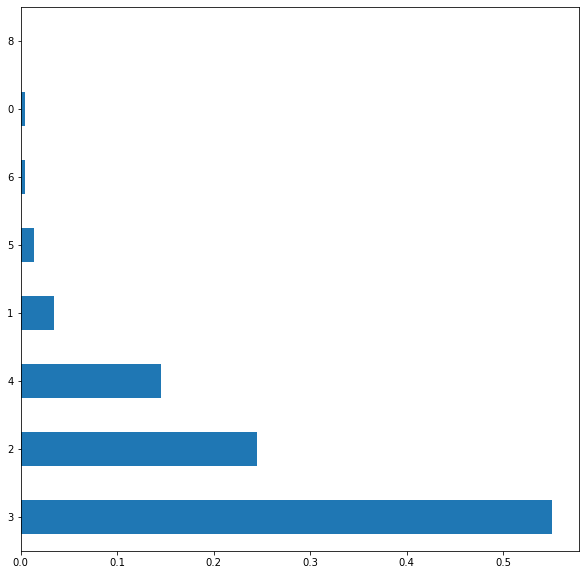

In [221]:
plt.figure(figsize=(10,10))
df['BedroomAbvGr'].value_counts(normalize=True).plot(kind='barh')
plt.show()

55% of properties have 3 rooms above ground

In [222]:
df.groupby(['BedroomAbvGr']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BedroomAbvGr,,,,,
0,38.833333333,11732.500000000,0.000000000,1278.166666667,213999.416666667
4,63.922535211,11365.762910798,132.473591549,1059.835680751,207879.903755869
8,60.000000000,10896.000000000,0.000000000,1440.000000000,200000.000000000
5,58.190476190,11032.357142857,60.190476190,1019.333333333,180819.047619048
3,58.661691542,10054.001865672,89.898631841,1069.032338308,179789.077736318
1,34.920000000,7579.380000000,82.177500000,1033.660000000,166634.160000000
2,53.127094972,7887.567039106,66.393854749,996.851955307,154904.561452514
6,62.000000000,9310.428571429,128.000000000,1293.428571429,143779.000000000


In [223]:
df.groupby(['BedroomAbvGr']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
BedroomAbvGr,,,,,
0,50.500000000,11573.000000000,0.000000000,1265.000000000,202500.000000000
8,60.000000000,10896.000000000,0.000000000,1440.000000000,200000.000000000
4,70.000000000,11000.000000000,0.000000000,994.000000000,193500.000000000
3,68.000000000,9788.000000000,0.000000000,1017.000000000,169945.000000000
5,70.000000000,11275.000000000,0.000000000,907.000000000,161500.000000000
1,36.500000000,5657.000000000,0.000000000,854.500000000,145250.000000000
6,70.000000000,9100.000000000,84.000000000,1728.000000000,141000.000000000
2,58.000000000,7537.500000000,0.000000000,938.000000000,137250.000000000


There are properties which do not have any bedroom above ground and are sold at higher prices on average then rest

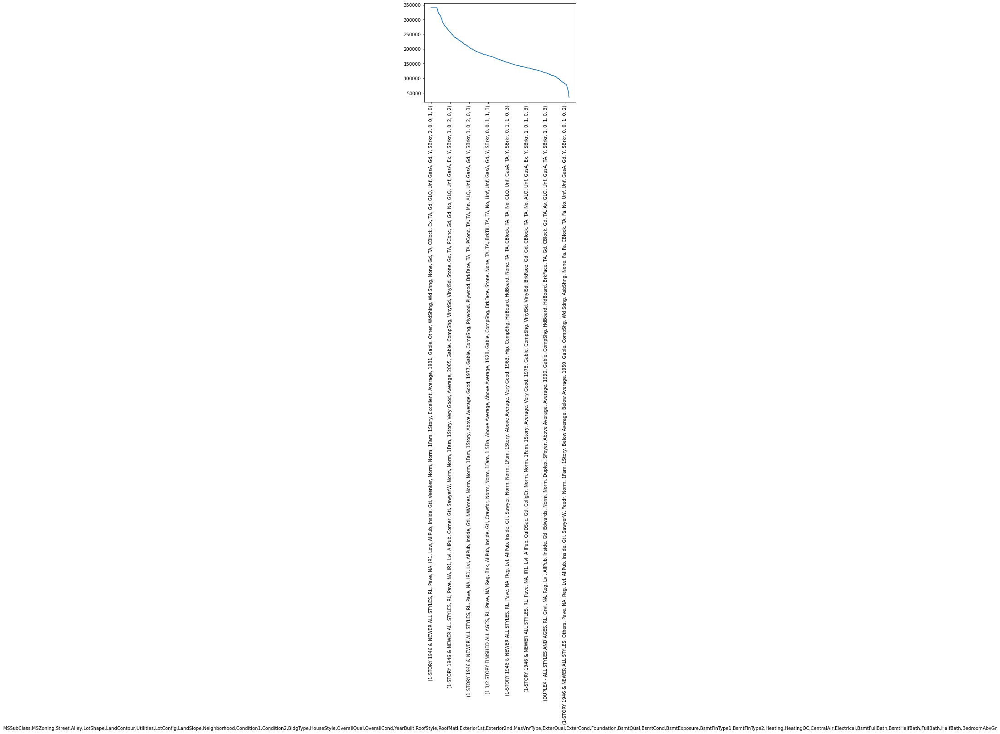

In [224]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

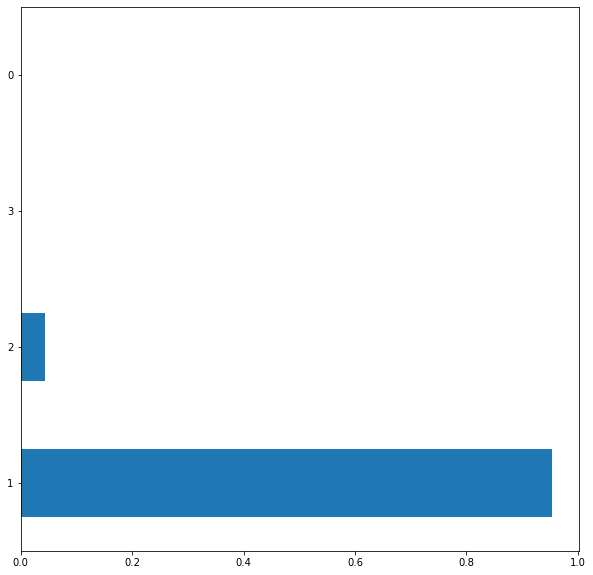

In [225]:
plt.figure(figsize=(10,10))
df['KitchenAbvGr'].value_counts(normalize=True).plot(kind='barh')
plt.show()

95% of properties have only 1 kitchen

In [226]:
df.groupby(['KitchenAbvGr']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
KitchenAbvGr,,,,,
1,56.928879310,9658.332614943,90.213631466,1056.183189655,179623.763290230
2,62.938461538,9520.484615385,72.398076923,932.846153846,131096.153846154
0,35.000000000,9400.000000000,250.000000000,945.000000000,127500.000000000
3,61.500000000,6278.000000000,0.000000000,792.500000000,109500.000000000


In [227]:
df.groupby(['KitchenAbvGr']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
KitchenAbvGr,,,,,
1,63.000000000,9501.500000000,0.000000000,992.000000000,165550.000000000
2,64.000000000,9142.000000000,0.000000000,979.000000000,133900.000000000
0,35.000000000,9400.000000000,250.000000000,945.000000000,127500.000000000
3,61.500000000,6278.000000000,0.000000000,792.500000000,109500.000000000


Average selling price of properties with single kitchen is higher than the rest

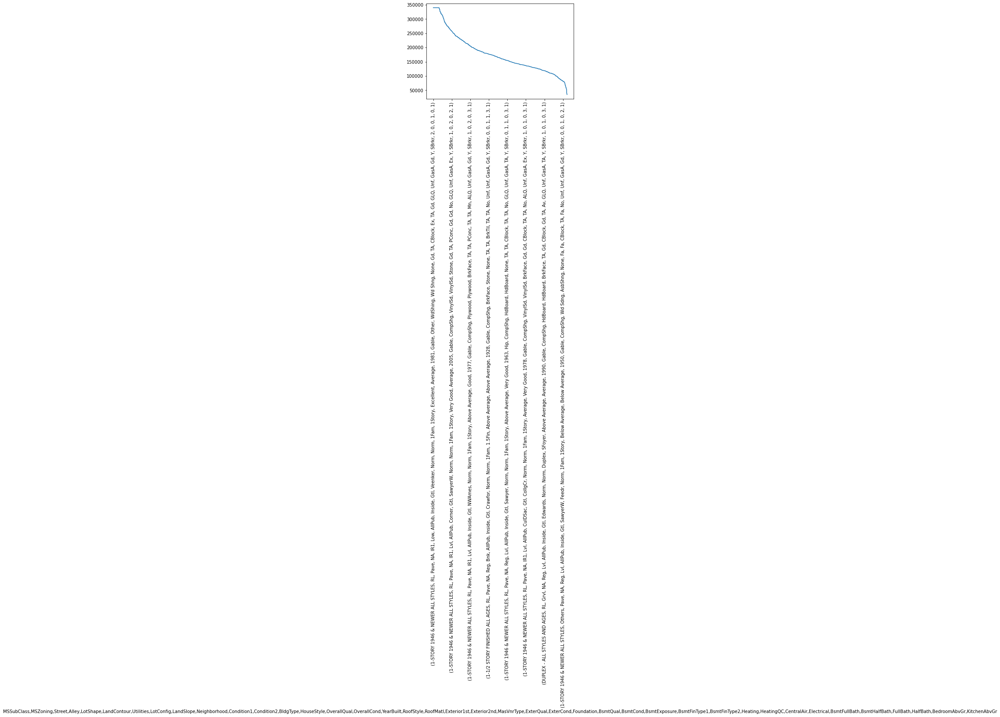

In [228]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

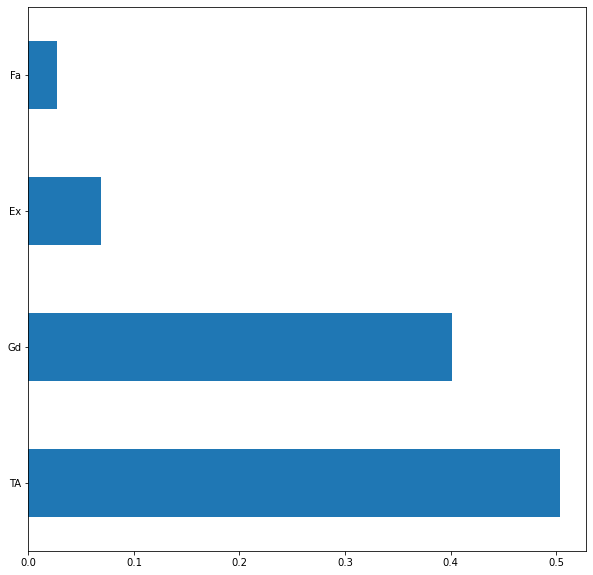

In [229]:
plt.figure(figsize=(10,10))
df['KitchenQual'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties have average or good kitchen quality

In [230]:
df.groupby(['KitchenQual']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
KitchenQual,,,,,
Ex,77.590000000,11950.965000000,207.712500000,1554.220000000,288718.080000000
Gd,57.067406143,9697.087883959,108.507465870,1145.107508532,210062.724402730
TA,54.227210884,9356.009523810,62.017176871,923.082993197,139889.008163265
Fa,62.474358974,8485.371794872,15.230769231,729.512820513,105565.205128205


In [231]:
df.groupby(['KitchenQual']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
KitchenQual,,,,,
Ex,83.500000000,12044.000000000,225.000000000,1621.000000000,316750.000000000
Gd,65.000000000,9590.500000000,16.000000000,1119.500000000,201400.000000000
TA,60.000000000,9084.000000000,0.000000000,912.000000000,137000.000000000
Fa,60.000000000,8400.000000000,0.000000000,728.000000000,115000.000000000


We see properties with excelent kitchen quality have higher selling price

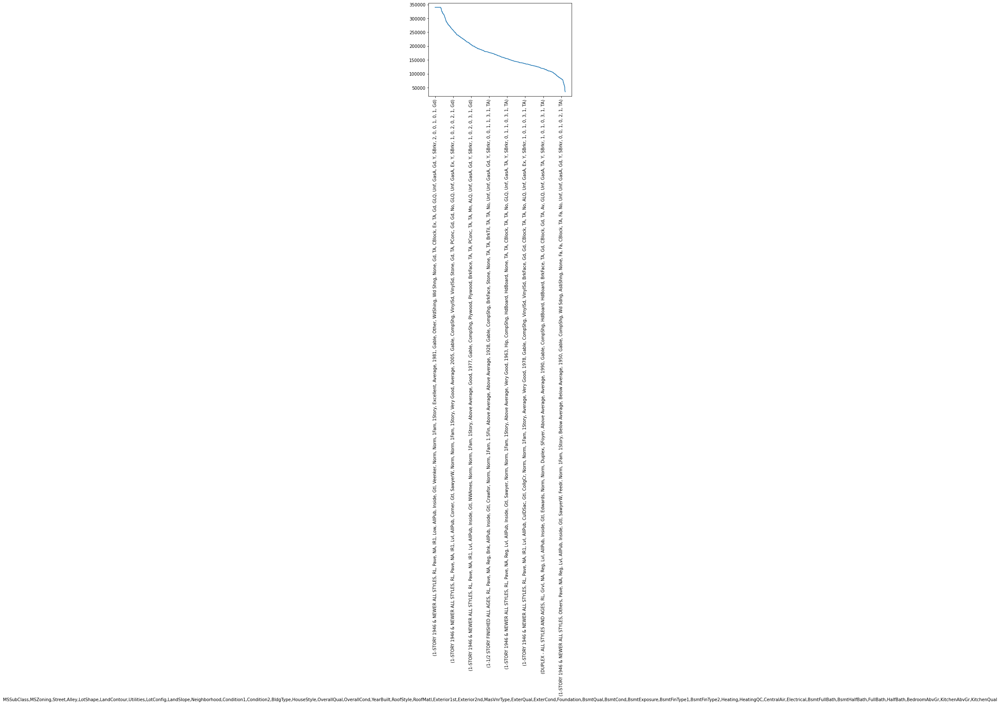

In [232]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

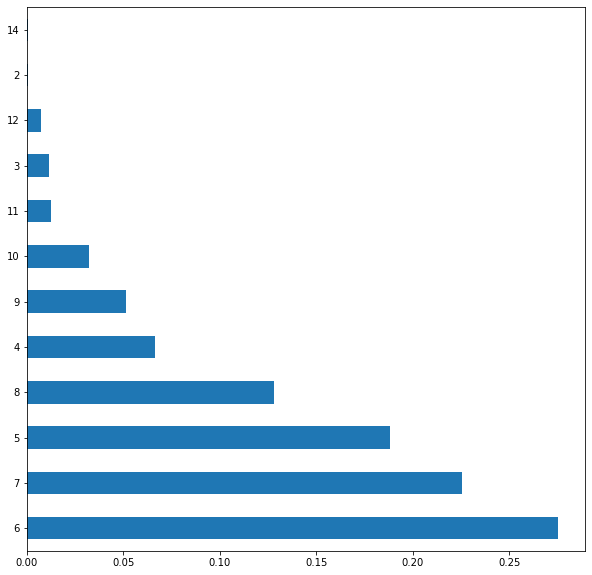

In [233]:
plt.figure(figsize=(10,10))
df['TotRmsAbvGrd'].value_counts(normalize=True).plot(kind='barh')
plt.show()

In [234]:
df['TotRmsAbvGrd_bracket']=pd.cut(df['TotRmsAbvGrd'],bins=4,precision=0,labels=["Below_Five","Below_Eight","Below_Eleven","Below_Fourteen"]).values

In [235]:
df['TotRmsAbvGrd_bracket']=df['TotRmsAbvGrd_bracket'].ravel().tolist()

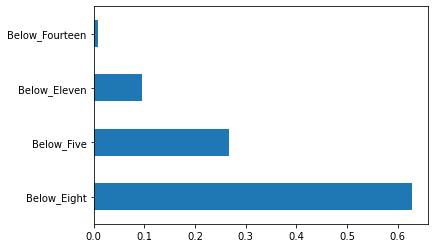

In [236]:
df['TotRmsAbvGrd_bracket'].value_counts(normalize=True).plot(kind='barh')
plt.show()

65% of properties have 5 to 8 total rooms

In [237]:
df.groupby(['TotRmsAbvGrd_bracket']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
TotRmsAbvGrd_bracket,,,,,
Below_Eleven,68.042857143,12310.721428571,166.188392857,1245.485714286,251923.192857143
Below_Fourteen,82.500000000,14664.208333333,178.822916667,1296.083333333,226238.791666667
Below_Eight,58.776688453,9882.124727669,96.760484749,1079.363834423,183273.372549020
Below_Five,48.771794872,7984.421794872,41.781730769,904.089743590,135064.000000000


In [238]:
df.groupby(['TotRmsAbvGrd_bracket']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
TotRmsAbvGrd_bracket,,,,,
Below_Eleven,77.000000000,12094.500000000,120.000000000,1166.500000000,262390.000000000
Below_Fourteen,85.000000000,16277.500000000,92.500000000,1376.500000000,200000.000000000
Below_Eight,65.000000000,9624.000000000,0.000000000,1032.000000000,174250.000000000
Below_Five,55.500000000,8006.000000000,0.000000000,884.000000000,129000.000000000


Properties with total rooms between 8 to 11 have higher selling price on an average

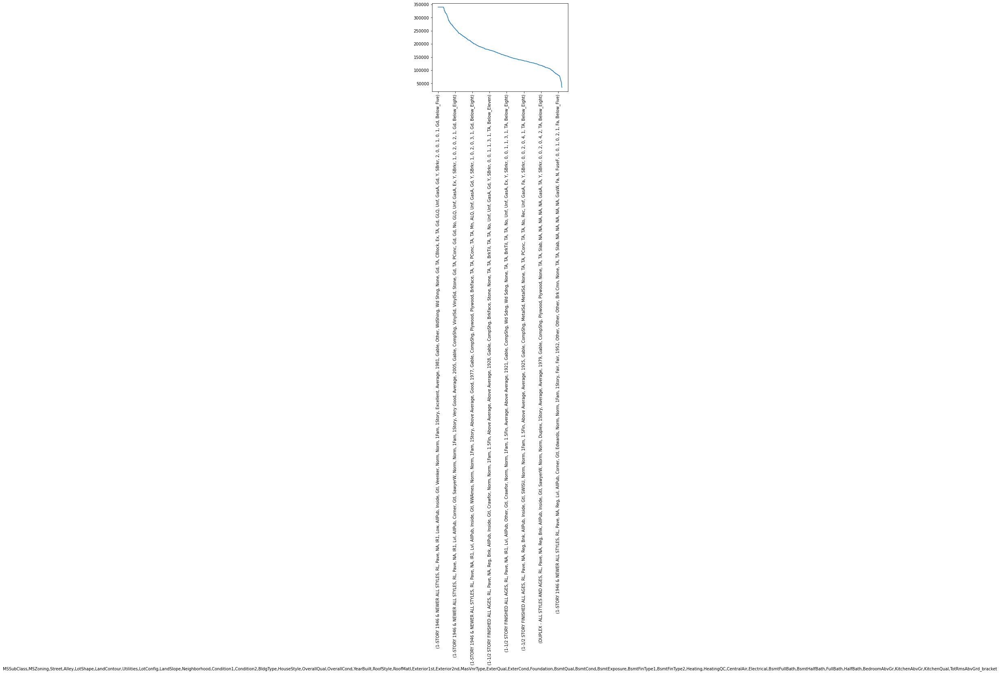

In [239]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

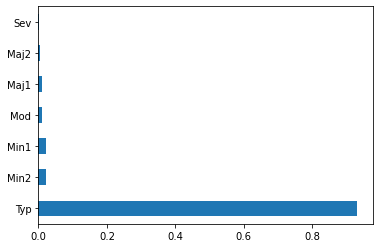

In [240]:
df['Functional'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties have typical functionality

In [241]:
df.groupby(['Functional']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Functional,,,,,
Typ,57.258823529,9607.834926471,92.986488971,1056.846323529,179721.091911765
Mod,64.633333333,10940.266666667,42.308333333,1101.266666667,155195.833333333
Maj1,52.535714286,8346.857142857,23.857142857,1073.928571429,153948.142857143
Min1,51.290322581,9875.612903226,59.903225806,931.258064516,146385.483870968
Min2,58.235294118,10865.191176471,26.970588235,879.647058824,144240.647058824
Sev,0.000000000,17673.500000000,113.000000000,1021.000000000,129000.000000000
Maj2,69.400000000,8867.400000000,43.200000000,941.800000000,85800.000000000


In [242]:
df.groupby(['Functional']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Functional,,,,,
Typ,63.000000000,9400.000000000,0.000000000,992.000000000,165500.000000000
Maj1,46.500000000,8320.500000000,0.000000000,970.000000000,140750.000000000
Min2,60.000000000,10816.000000000,0.000000000,923.000000000,140000.000000000
Min1,60.000000000,9600.000000000,0.000000000,978.000000000,139000.000000000
Mod,63.000000000,10680.000000000,0.000000000,1362.000000000,137900.000000000
Sev,0.000000000,17673.500000000,113.000000000,1021.000000000,129000.000000000
Maj2,60.000000000,8967.000000000,0.000000000,1022.000000000,85000.000000000


Properties with typical functionality have higher selling price comparatively

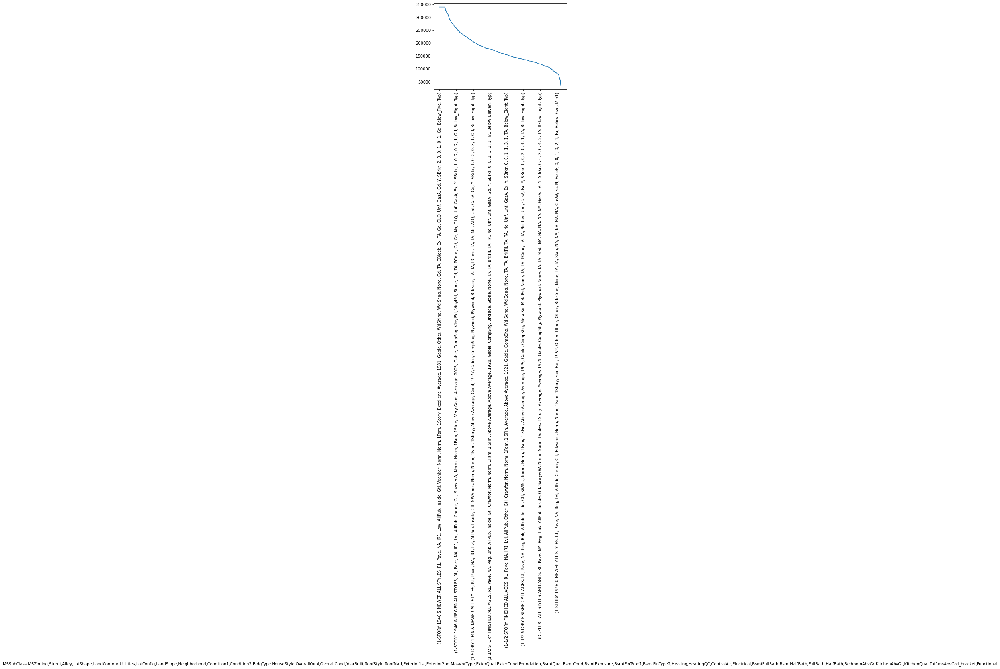

In [243]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

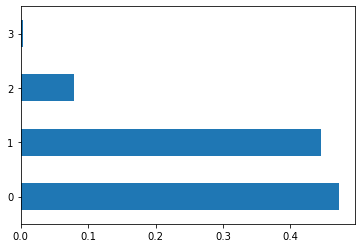

In [244]:
df['Fireplaces'].value_counts(normalize=True).plot(kind='barh')
plt.show()

there are approximately 85% of properties with 0 or 1 fireplaces .

In [245]:
df.groupby(['Fireplaces']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Fireplaces,,,,,
3,76.900000000,13643.900000000,117.325000000,1657.000000000,247015.000000000
2,54.647826087,12584.969565217,129.722826087,1267.565217391,222764.639130435
1,58.902307692,10348.504615385,122.655000000,1150.015384615,206976.773076923
0,55.852898551,8468.358695652,51.163405797,915.662318841,141327.706521739


In [246]:
df.groupby(['Fireplaces']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
Fireplaces,,,,,
2,60.000000000,12168.000000000,28.000000000,1210.000000000,206900.000000000
3,85.000000000,13600.000000000,0.000000000,1896.000000000,205000.000000000
1,65.000000000,10231.500000000,17.000000000,1095.500000000,189975.000000000
0,60.000000000,8640.000000000,0.000000000,888.000000000,135000.000000000


We see that on an average selling price for properties with 2 fireplaces are higher as people mostly pay higher price for such property. There are few properties with bit inflated price for properties with 3 fireplaces, hence average selling price for them is slightly up 

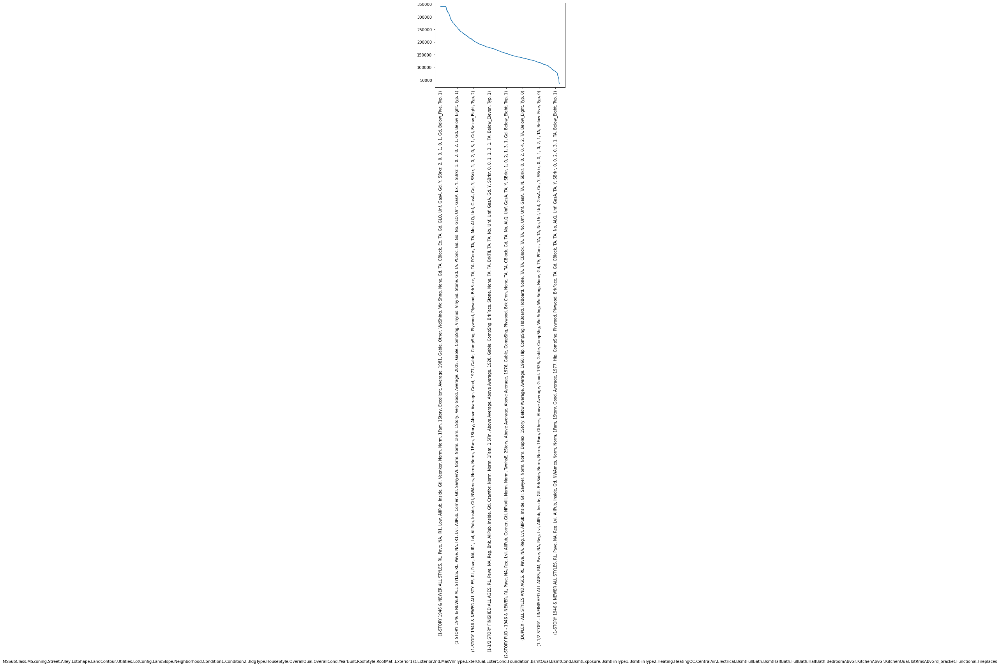

In [247]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

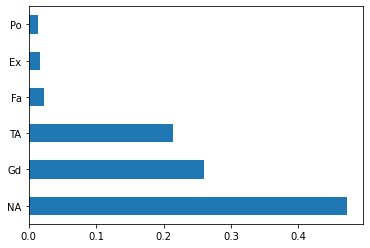

In [248]:
df['FireplaceQu'].value_counts(normalize=True).plot(kind='barh')
plt.show()

Approximately 48% properties does not have fireplace, 25% of properties have good fireplace quality

In [249]:
df.groupby(['FireplaceQu']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
FireplaceQu,,,,,
Ex,71.812500000,12450.729166667,203.072916667,1570.125000000,294097.541666667
Gd,63.885526316,10779.592105263,126.555592105,1221.384210526,218106.526315789
TA,52.091054313,10653.589456869,122.003194888,1107.370607029,202341.715654952
Fa,50.515151515,9883.681818182,93.018939394,1106.181818182,167298.484848485
NA,55.852898551,8468.358695652,51.163405797,915.662318841,141327.706521739
Po,49.200000000,9311.075000000,50.450000000,832.250000000,129764.150000000


In [250]:
df.groupby(['FireplaceQu']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
FireplaceQu,,,,,
Ex,85.500000000,12648.000000000,238.000000000,1636.000000000,314250.000000000
Gd,67.000000000,10599.500000000,5.500000000,1181.000000000,206950.000000000
TA,62.000000000,10434.000000000,40.000000000,1057.000000000,187500.000000000
Fa,65.000000000,10011.000000000,0.000000000,1070.000000000,158000.000000000
NA,60.000000000,8640.000000000,0.000000000,888.000000000,135000.000000000
Po,60.000000000,9900.000000000,0.000000000,879.000000000,131500.000000000


Properties with fireplacequality as excellent have higher selling price on average

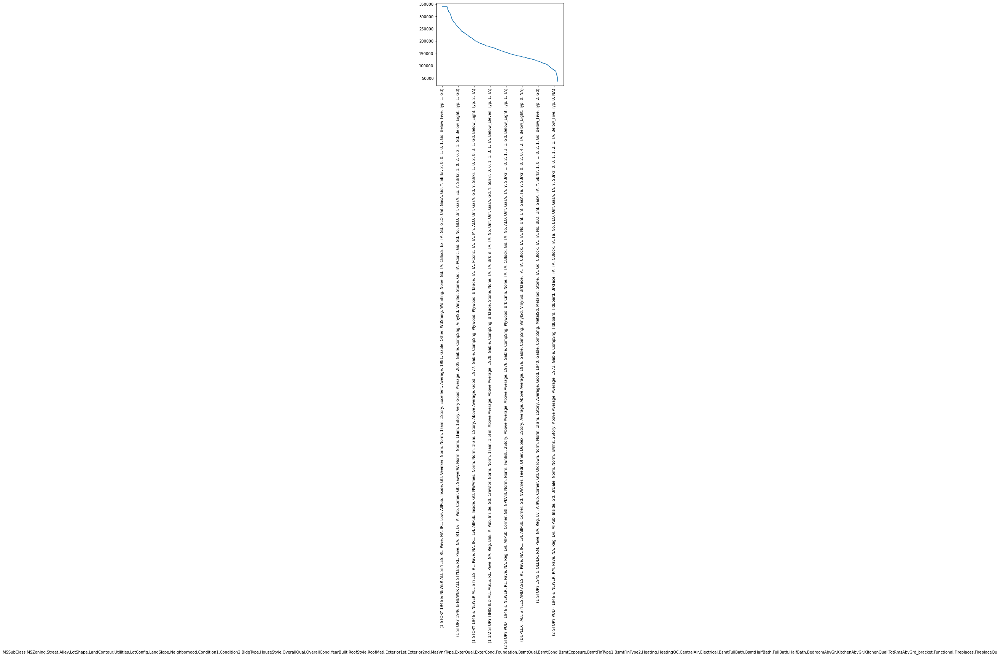

In [251]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

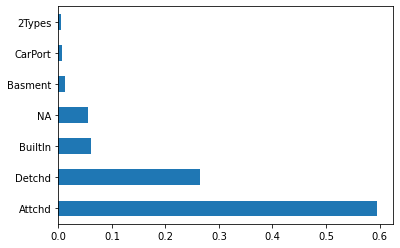

In [252]:
df['GarageType'].value_counts(normalize=True).plot(kind='barh')
plt.show()

59% of properties have attached garages

In [253]:
df.groupby(['GarageType']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
GarageType,,,,,
BuiltIn,58.028409091,10989.471590909,148.910511364,989.250000000,238593.323863636
Attchd,59.171264368,10315.881034483,113.585488506,1182.951724138,198680.067816092
Basment,62.289473684,10258.710526316,80.769736842,909.947368421,159567.394736842
2Types,57.166666667,11876.666666667,88.333333333,1305.333333333,151283.333333333
Detchd,52.506459948,8186.410852713,39.395671835,834.847545220,133742.422480620
CarPort,68.222222222,11588.055555556,20.333333333,718.111111111,109962.111111111
NA,54.913580247,7465.277777778,13.777777778,771.358024691,103317.283950617


In [254]:
df.groupby(['GarageType']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
GarageType,,,,,
BuiltIn,72.000000000,11131.500000000,83.000000000,954.000000000,227500.000000000
Attchd,70.000000000,10035.000000000,35.000000000,1144.500000000,185000.000000000
2Types,64.500000000,10335.000000000,77.500000000,1172.000000000,159000.000000000
Basment,68.000000000,9600.000000000,0.000000000,920.000000000,148000.000000000
Detchd,60.000000000,8263.000000000,0.000000000,845.000000000,129500.000000000
CarPort,70.000000000,10791.000000000,0.000000000,816.000000000,108000.000000000
NA,58.000000000,7711.000000000,0.000000000,780.000000000,100000.000000000


Properties with Built In Garages have higher selling price

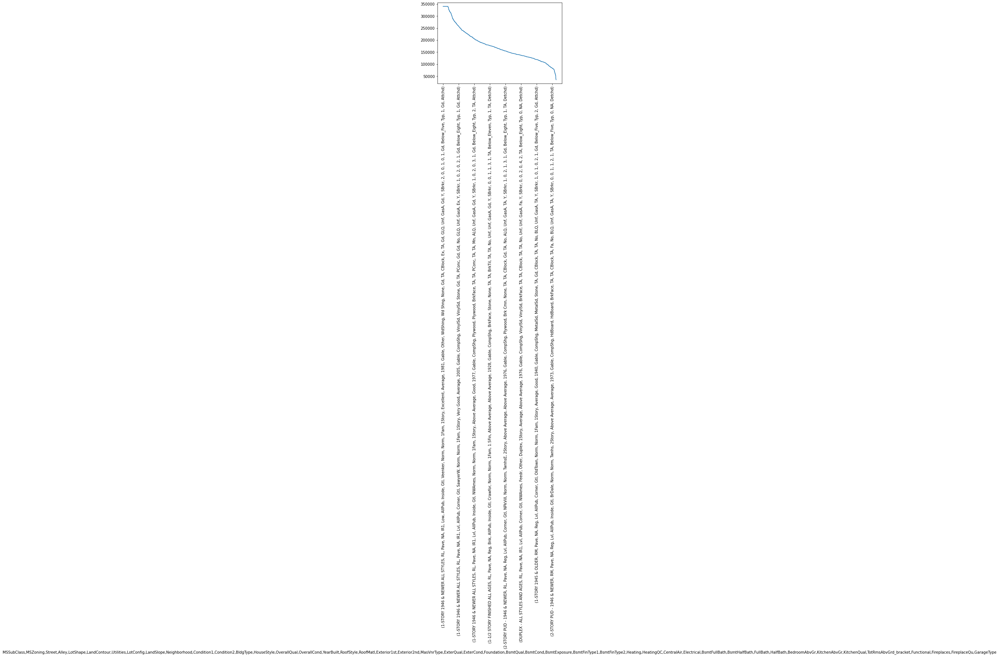

In [255]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

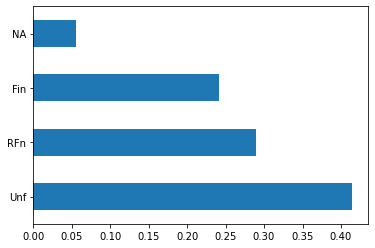

In [256]:
df['GarageFinish'].value_counts(normalize=True).plot(kind='barh')
plt.show()

70% of properties had either unfinished or rough finished garage

In [257]:
df.groupby(['GarageFinish']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
GarageFinish,,,,,
Fin,60.441761364,10565.332386364,133.321377841,1231.681818182,228475.362215909
RFn,60.242890995,10033.873222749,122.070793839,1166.383886256,199768.607819905
Unf,53.467768595,9135.880165289,51.197107438,901.034710744,141834.129752066
NA,54.913580247,7465.277777778,13.777777778,771.358024691,103317.283950617


In [258]:
df.groupby(['GarageFinish']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,SalePrice_avg
GarageFinish,,,,,
Fin,70.000000000,10630.000000000,72.000000000,1210.500000000,215000.000000000
RFn,70.000000000,9813.500000000,80.500000000,1144.500000000,190000.000000000
Unf,60.000000000,8944.000000000,0.000000000,896.000000000,135000.000000000
NA,58.000000000,7711.000000000,0.000000000,780.000000000,100000.000000000


Selling price of a property goes down as finish of garage goes down , i.e from finish to NA on an average

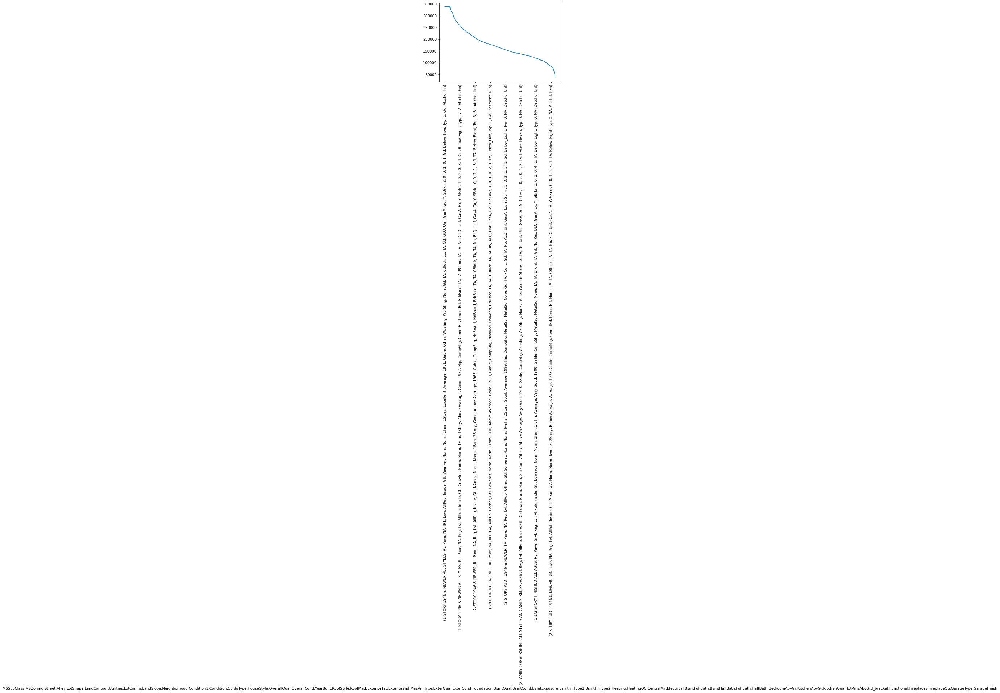

In [259]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

In [260]:
df.groupby(['GarageFinish']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
GarageFinish,,,,,,
Fin,60.441761364,10565.332386364,133.321377841,1231.681818182,569.553977273,228475.362215909
RFn,60.242890995,10033.873222749,122.070793839,1166.383886256,549.729265403,199768.607819905
Unf,53.467768595,9135.880165289,51.197107438,901.034710744,421.009090909,141834.129752066
NA,54.913580247,7465.277777778,13.777777778,771.358024691,0.000000000,103317.283950617


In [261]:
df.groupby(['GarageFinish']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
GarageFinish,,,,,,
Fin,70.000000000,10630.000000000,72.000000000,1210.500000000,533.500000000,215000.000000000
RFn,70.000000000,9813.500000000,80.500000000,1144.500000000,528.000000000,190000.000000000
Unf,60.000000000,8944.000000000,0.000000000,896.000000000,406.000000000,135000.000000000
NA,58.000000000,7711.000000000,0.000000000,780.000000000,0.000000000,100000.000000000


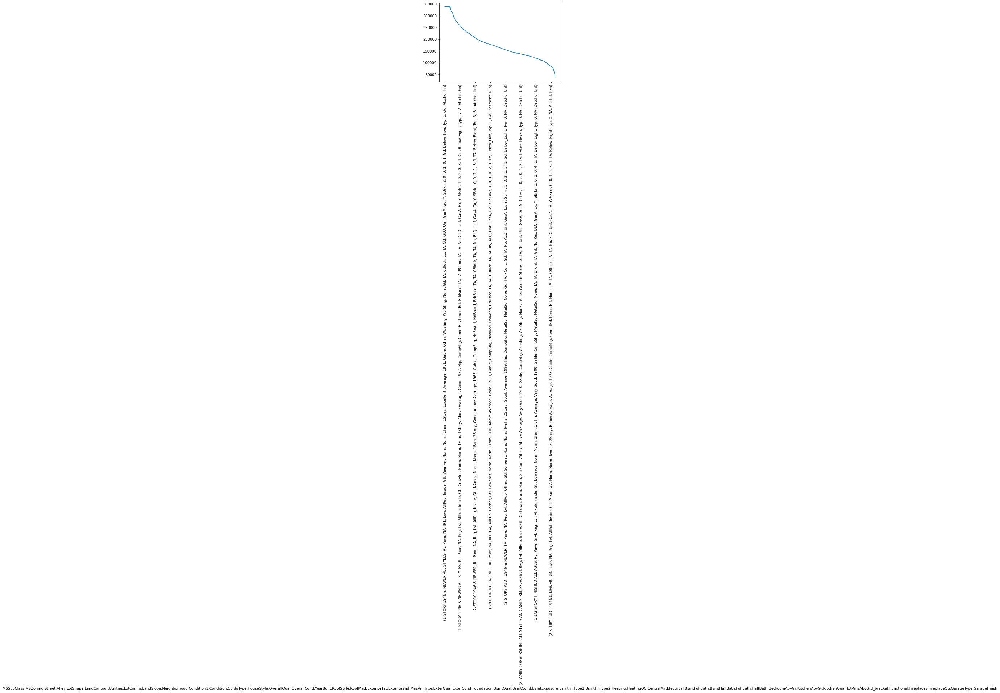

In [262]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

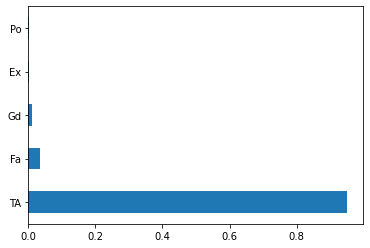

In [263]:
df['GarageQual'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties had average quality garages

In [264]:
df.groupby(['GarageQual']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
GarageQual,,,,,,
Gd,52.571428571,10770.857142857,60.214285714,1035.285714286,557.142857143,215860.714285714
Ex,77.000000000,11224.500000000,0.000000000,903.666666667,688.000000000,196012.500000000
TA,57.203661327,9806.080854310,97.817887109,1075.745995423,504.493707094,183595.133485889
Fa,60.437500000,8574.135416667,6.979166667,846.562500000,311.375000000,123573.354166667
Po,61.333333333,9567.666666667,0.000000000,916.333333333,326.000000000,100166.666666667


In [265]:
df.groupby(['GarageQual']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
GarageQual,,,,,,
Gd,55.000000000,10006.000000000,0.000000000,1071.500000000,524.000000000,209115.000000000
TA,65.000000000,9600.000000000,0.000000000,1026.000000000,484.000000000,170000.000000000
Ex,71.000000000,9100.000000000,0.000000000,864.000000000,840.000000000,127500.000000000
Fa,60.000000000,8938.500000000,0.000000000,832.500000000,271.500000000,115000.000000000
Po,60.000000000,9142.000000000,0.000000000,961.000000000,338.000000000,96500.000000000


We see that properties with good quality garages have higher selling price on an average

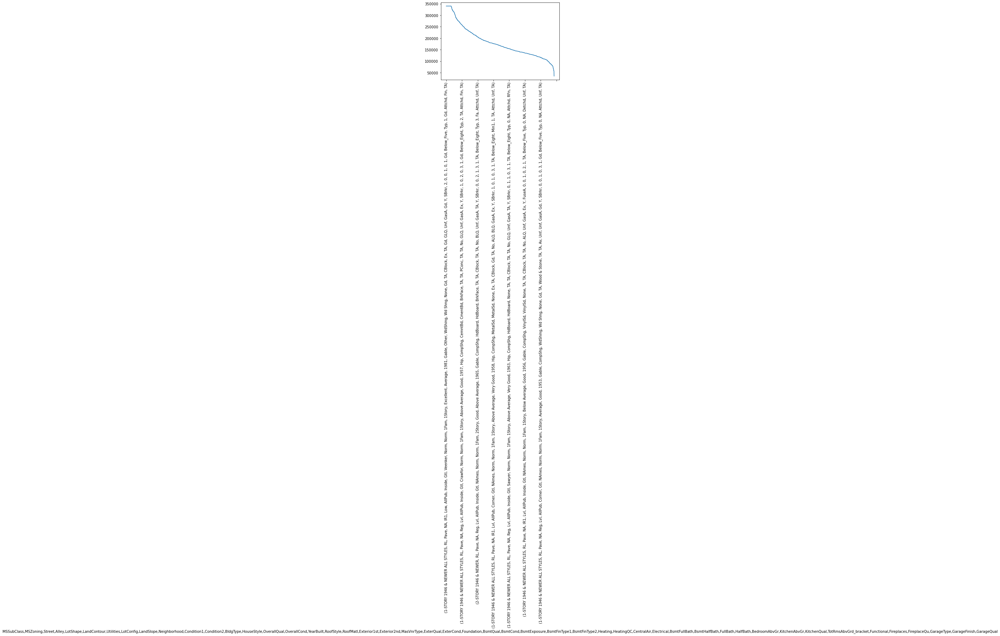

In [266]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

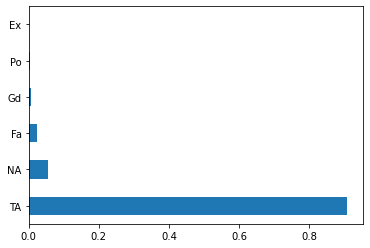

In [267]:
df['GarageCond'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties have garage in average condition

In [268]:
df.groupby(['GarageCond']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
GarageCond,,,,,,
TA,57.436651584,9805.255279035,96.220965309,1076.450226244,503.420248869,183933.308823529
Gd,36.333333333,9496.166666667,111.888888889,968.888888889,496.444444444,179930.000000000
Ex,70.500000000,8000.000000000,0.000000000,802.000000000,612.000000000,124000.000000000
Fa,58.085714286,8957.828571429,23.464285714,778.685714286,339.600000000,114654.028571429
Po,54.857142857,9105.857142857,0.000000000,848.714285714,295.142857143,108500.000000000
NA,54.913580247,7465.277777778,13.777777778,771.358024691,0.000000000,103317.283950617


In [269]:
df.groupby(['GarageCond']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
GarageCond,,,,,,
TA,64.500000000,9600.000000000,0.000000000,1026.000000000,484.000000000,170000.000000000
Gd,50.000000000,9020.000000000,54.000000000,1092.000000000,490.000000000,148000.000000000
Ex,70.500000000,8000.000000000,0.000000000,802.000000000,612.000000000,124000.000000000
Fa,60.000000000,9600.000000000,0.000000000,784.000000000,287.000000000,114504.000000000
Po,60.000000000,9000.000000000,0.000000000,849.000000000,296.000000000,108000.000000000
NA,58.000000000,7711.000000000,0.000000000,780.000000000,0.000000000,100000.000000000


Properties with garage in average condtion have higher selling price on an average

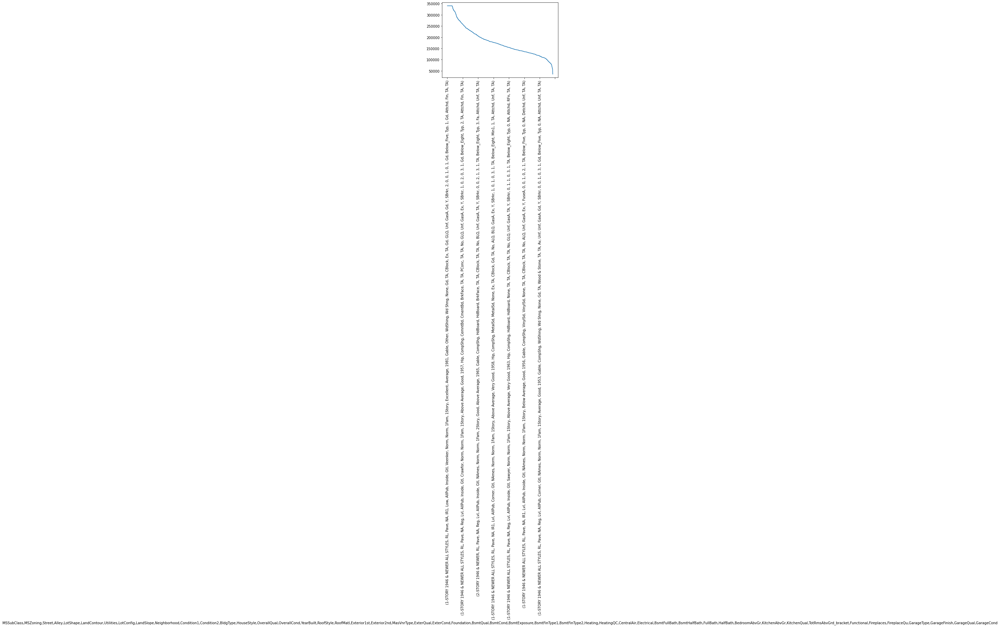

In [270]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

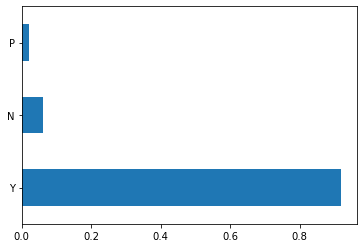

In [271]:
df['PavedDrive'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties have paved paved driveway

In [272]:
df.groupby(['PavedDrive']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
PavedDrive,,,,,,
Y,57.338059701,9682.804850746,96.400466418,1076.712686567,488.306902985,182522.841417910
P,56.250000000,10386.216666667,11.633333333,835.700000000,350.033333333,132330.000000000
N,55.261111111,8873.794444444,11.195833333,727.844444444,248.300000000,115039.122222222


In [273]:
df.groupby(['PavedDrive']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
PavedDrive,,,,,,
Y,65.000000000,9571.000000000,0.000000000,1023.000000000,484.000000000,168500.000000000
P,60.000000000,9092.000000000,0.000000000,773.500000000,308.000000000,132250.000000000
N,60.000000000,8500.000000000,0.000000000,755.500000000,240.000000000,111000.000000000


 properties with paved paved driveway have higher average selling price

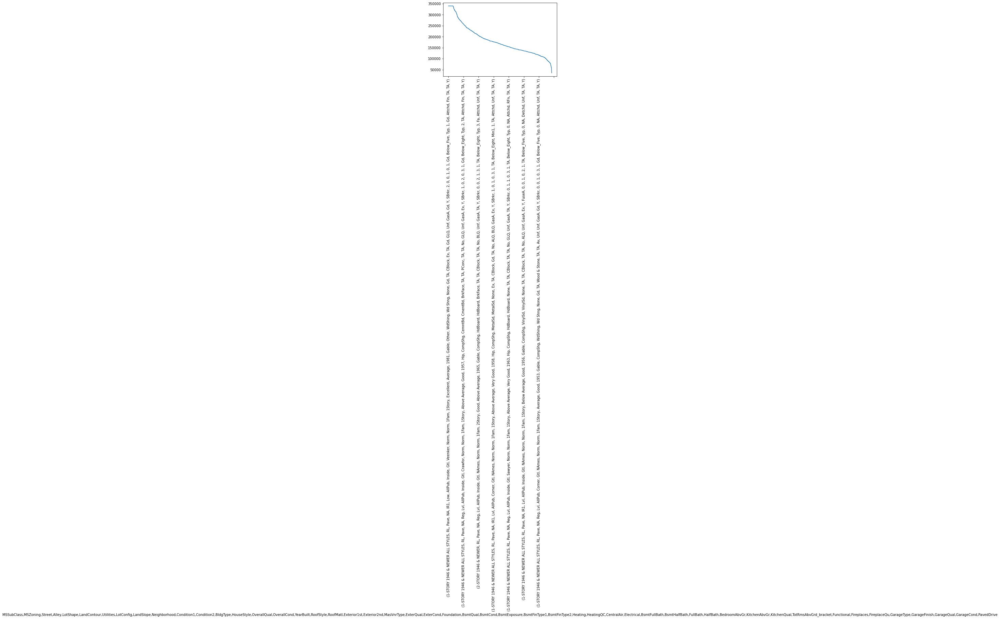

In [274]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

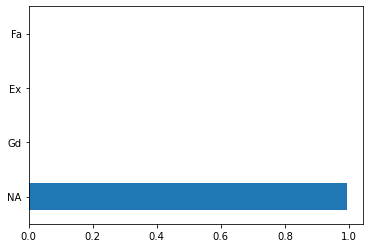

In [275]:
df['PoolQC'].value_counts(normalize=True).plot(kind='barh')
plt.show()

Approximately 100% is NA for pool in property, it does not add any variation, it is better to remove it


In [276]:
df.drop("PoolQC",axis=1,inplace=True)

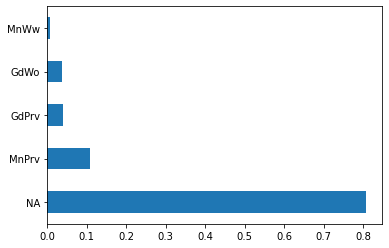

In [277]:
df['Fence'].value_counts(normalize=True).plot(kind='barh')
plt.show()

80% of properties did not have fence , 10% of properties had minimum privacy fence

In [278]:
df.groupby(['Fence']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
Fence,,,,,,
NA,57.002120441,9689.993214589,96.152565734,1074.671755725,485.094147583,183648.519508058
GdPrv,59.279661017,10199.381355932,85.824152542,975.067796610,473.593220339,176639.957627119
MnPrv,57.343949045,9162.716560510,48.455414013,948.904458599,395.853503185,146140.101910828
GdWo,57.296296296,9603.972222222,73.430555556,926.722222222,389.319444444,139620.750000000
MnWw,63.090909091,9250.909090909,48.454545455,889.454545455,376.272727273,134286.363636364


In [279]:
df.groupby(['Fence']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
Fence,,,,,,
NA,62.000000000,9550.000000000,0.000000000,1008.000000000,484.000000000,173000.000000000
GdPrv,66.000000000,9880.000000000,0.000000000,1026.000000000,484.000000000,167500.000000000
GdWo,70.000000000,9490.000000000,0.000000000,893.000000000,372.000000000,138750.000000000
MnPrv,60.000000000,8816.000000000,0.000000000,907.000000000,396.000000000,137450.000000000
MnWw,69.000000000,8973.000000000,0.000000000,864.000000000,297.000000000,130000.000000000


Properties without fence are sold on higher price than rest

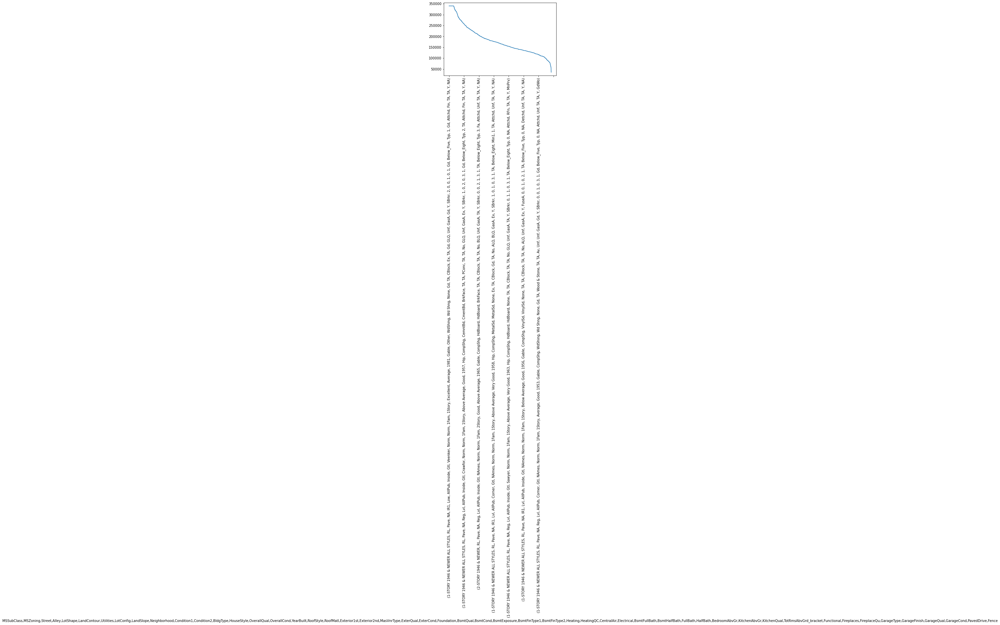

In [280]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive",'Fence']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

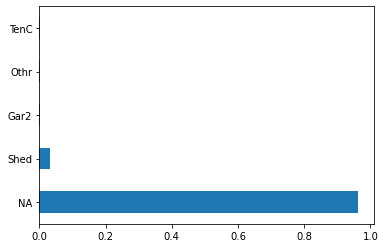

In [281]:
df['MiscFeature'].value_counts(normalize=True).plot(kind='barh')
plt.show()

90% of properties had no miscelleneous features

In [282]:
df['MiscFeature'].replace(["TenC","Gar2","Othr"],"Others",inplace=True)

In [283]:
df.groupby(['MiscFeature']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
MiscFeature,,,,,,
NA,57.408961593,9607.653982930,90.777649360,1055.847083926,472.473684211,178318.873044097
Others,42.000000000,12976.300000000,37.000000000,917.000000000,350.600000000,155900.000000000
Shed,52.387755102,10447.826530612,55.405612245,903.387755102,431.188775510,151187.612244898


In [284]:
df.groupby(['MiscFeature']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
MiscFeature,,,,,,
NA,63.000000000,9434.500000000,0.000000000,994.000000000,480.000000000,164250.000000000
Others,60.000000000,12772.000000000,0.000000000,958.000000000,301.000000000,151500.000000000
Shed,64.000000000,10395.000000000,0.000000000,864.000000000,450.000000000,144000.000000000


Properties with no miscillaneous features are sold on higher price on an average

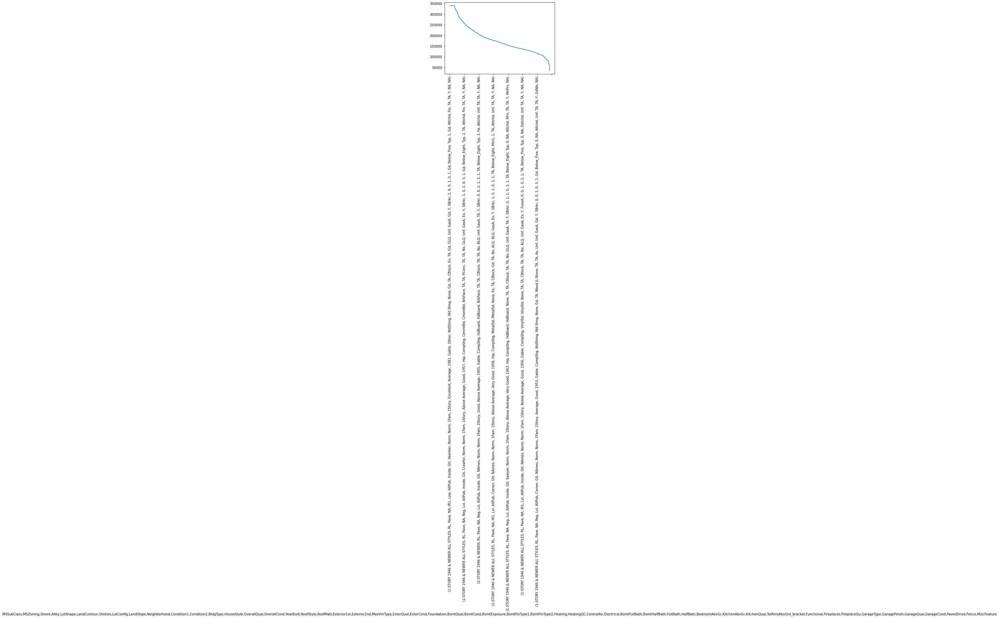

In [285]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive",'Fence','MiscFeature']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

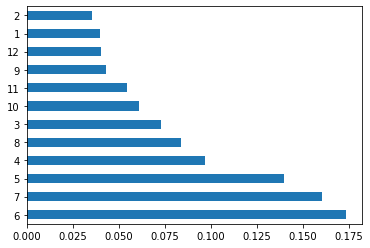

In [286]:
df['MoSold'].value_counts(normalize=True).plot(kind='barh')
plt.show()

We see properties are mostly sold in June, July and May

In [287]:
df['MoSold_Bracket']=pd.cut(df['MoSold'],bins=4,precision=0,labels=["Jan-March","Äpril-May","June-Aug","Sept-Dec"]).ravel().tolist()

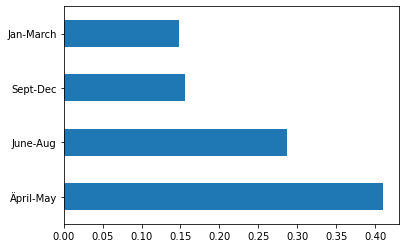

In [288]:
df['MoSold_Bracket'].value_counts(normalize=True).plot(kind='barh')
plt.show()

We See 75% of properties are sold in April to August

In [289]:
df.drop(["MoSold"],axis=1,inplace=True)

In [290]:
df.groupby(['MoSold_Bracket']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
MoSold_Bracket,,,,,,
Sept-Dec,57.105726872,9636.385462555,94.841960352,1096.074889868,486.284140969,183269.107929515
June-Aug,60.220763723,9879.177804296,89.027446301,1053.976133652,475.619928401,182630.124105012
Jan-March,57.546296296,10036.219907407,103.118634259,1089.328703704,476.064814815,175556.138888889
Äpril-May,54.964046823,9348.709030100,82.655518395,1016.140468227,459.327759197,172006.342809365


In [291]:
df.groupby(['MoSold_Bracket']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
MoSold_Bracket,,,,,,
June-Aug,65.000000000,9541.000000000,0.000000000,980.000000000,474.000000000,171000.000000000
Sept-Dec,64.000000000,9246.000000000,0.000000000,1052.000000000,483.000000000,167500.000000000
Jan-March,61.000000000,9993.000000000,0.000000000,1018.500000000,480.000000000,165250.000000000
Äpril-May,60.000000000,9203.000000000,0.000000000,969.500000000,472.000000000,156750.000000000


We see that there are some/few properties sold in bracket of september to december at inflated rate or some high end property have been sold , due to which it has inflated average selling price. 

In general people who tend to purchase in between june to august purchase at higher price compared to rest , though there is not that bigger difference in there average selling price

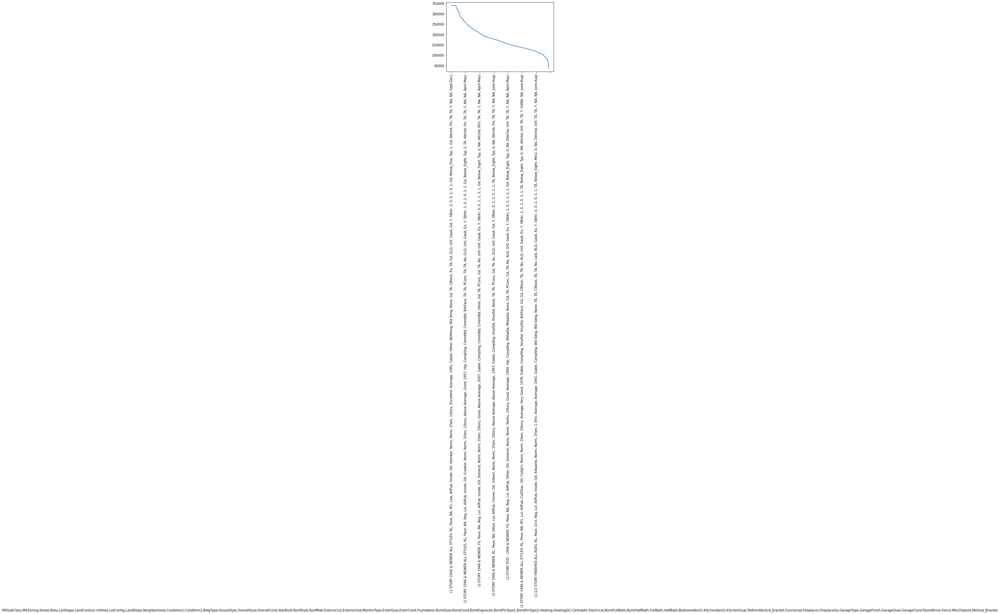

In [292]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive",'Fence','MiscFeature',"MoSold_Bracket"]).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

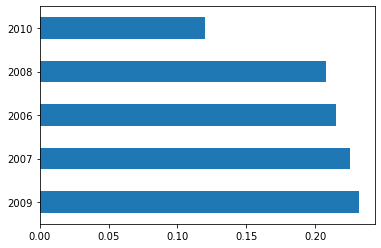

In [293]:
df['YrSold'].value_counts(normalize=True).plot(kind='barh')
plt.show()

80% of properties are being sold in year between 2006-2009

In [294]:
df.groupby(['YrSold']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
YrSold,,,,,,
2007,57.454407295,9706.276595745,99.818768997,1080.261398176,478.755319149,181328.686930091
2006,58.199044586,9887.600318471,79.333996815,1052.866242038,477.498407643,178707.374203822
2009,55.736686391,9472.741124260,86.647928994,1042.224852071,475.673816568,175700.900887574
2008,56.809210526,9574.560855263,93.696546053,1024.101973684,459.902960526,175623.465460526
2010,58.331428571,9569.497142857,85.778571429,1050.097142857,452.262857143,173464.782857143


In [295]:
df.groupby(['YrSold']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
YrSold,,,,,,
2007,63.000000000,9503.000000000,0.000000000,1001.000000000,477.000000000,167000.000000000
2008,63.000000000,9362.500000000,0.000000000,973.000000000,479.000000000,164000.000000000
2006,63.000000000,9580.000000000,0.000000000,1005.500000000,479.000000000,163995.000000000
2009,60.000000000,9375.000000000,0.000000000,978.000000000,478.000000000,162000.000000000
2010,66.000000000,9400.000000000,0.000000000,1010.000000000,480.000000000,155000.000000000


in 2007 properties are sold on a slight upper price

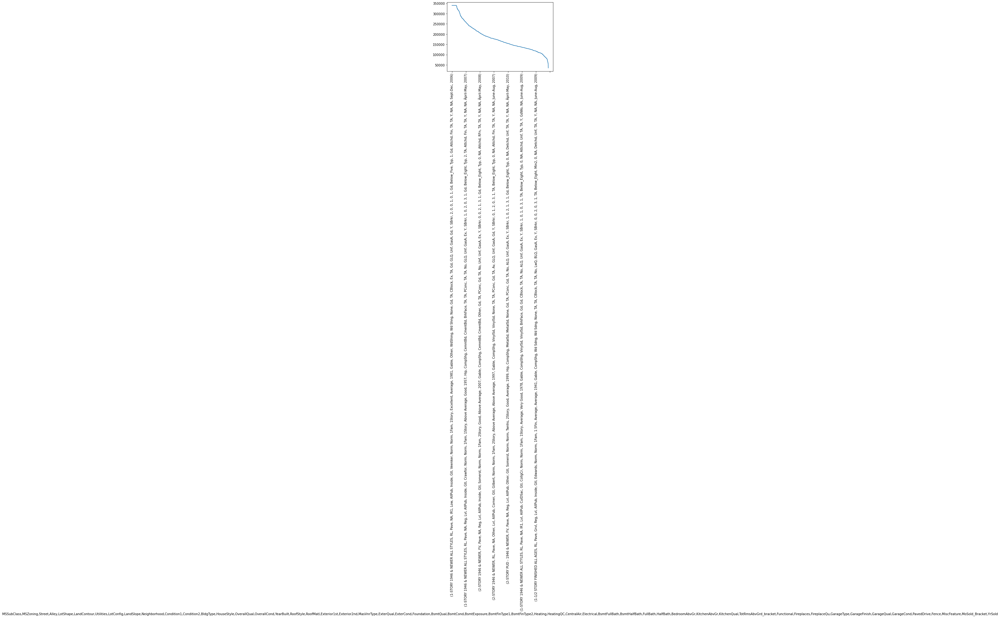

In [296]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive",'Fence','MiscFeature',"MoSold_Bracket",'YrSold']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

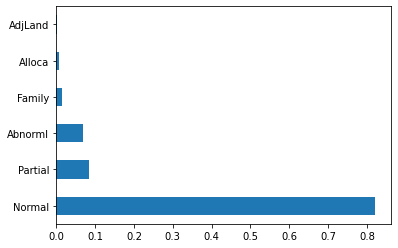

In [297]:
df['SaleCondition'].value_counts(normalize=True).plot(kind='barh')
plt.show()

80% of the properties are sold normally

In [298]:
df.groupby(['SaleCondition']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
SaleCondition,,,,,,
Partial,76.776000000,10540.332000000,163.465000000,1393.208000000,662.150000000,251881.220000000
Normal,55.189899833,9591.952003339,83.640233723,1020.720367279,458.825125209,173311.087646077
Alloca,54.000000000,10082.000000000,73.802083333,841.500000000,460.166666667,165788.875000000
Family,63.625000000,9604.050000000,84.981250000,1130.250000000,443.650000000,149600.000000000
Abnorml,55.851485149,9221.896039604,69.939356436,1002.910891089,397.059405941,142517.094059406
AdjLand,54.500000000,8002.500000000,62.500000000,600.250000000,60.000000000,104125.000000000


In [299]:
df.groupby(['SaleCondition']).agg(LotFrontage_avg=('LotFrontage','median'),LotArea_avg=('LotArea','median'),MasVnrArea_avg=('MasVnrArea','median'),
                           TotalBsmtSF_avg=('TotalBsmtSF','median'),GarageArea_avg=("GarageArea","median"),SalePrice_avg=('SalePrice','median') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)

,LotFrontage_avg,LotArea_avg,MasVnrArea_avg,TotalBsmtSF_avg,GarageArea_avg,SalePrice_avg
SaleCondition,,,,,,
Partial,75.000000000,10237.000000000,100.000000000,1410.000000000,650.000000000,244600.000000000
Normal,60.000000000,9468.500000000,0.000000000,969.000000000,470.000000000,160000.000000000
Alloca,64.000000000,7886.000000000,0.000000000,936.000000000,458.000000000,148145.000000000
Family,70.000000000,10153.000000000,0.000000000,1047.500000000,456.000000000,140500.000000000
Abnorml,60.000000000,8926.000000000,0.000000000,952.000000000,440.000000000,130000.000000000
AdjLand,59.000000000,8285.000000000,0.000000000,707.000000000,0.000000000,104000.000000000


We see properties partially sold are sold on a higher price

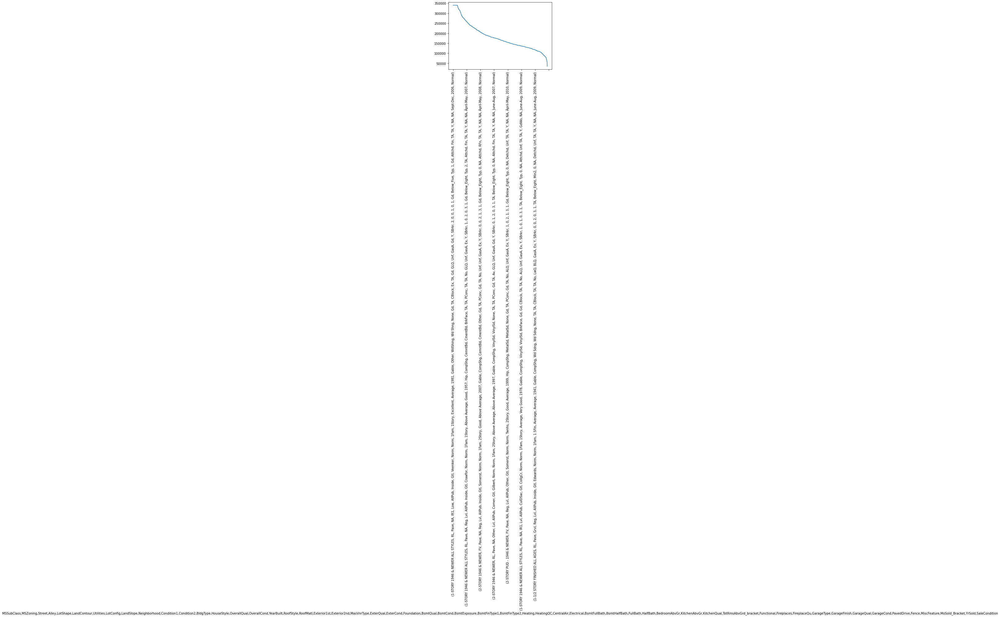

In [300]:
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive",'Fence','MiscFeature',"MoSold_Bracket",'YrSold','SaleCondition']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False)['SalePrice_avg'].plot()
plt.xticks(rotation=90)
plt.show()

In [301]:
#Top 5 properties
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive",'Fence','MiscFeature',"MoSold_Bracket",'YrSold','SaleCondition']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False).head(15)

LotFrontage_avg  \
MSSubClass                      MSZoning Street Alley LotShape LandContour Utilities LotConfig LandSlope Neighborhood Condition1 Condition2 BldgType HouseStyle OverallQual    OverallCond   YearBuilt RoofStyle RoofMatl Exterior1st Exterior2nd MasVnrType ExterQual ExterCond Foundation BsmtQual BsmtCond BsmtExposure BsmtFinType1 BsmtFinType2 Heating HeatingQC CentralAir Electrical BsmtFullBath BsmtHalfBath FullBath HalfBath BedroomAbvGr KitchenAbvGr KitchenQual TotRmsAbvGrd_bracket Functional Fireplaces FireplaceQu GarageType GarageFinish GarageQual GarageCond PavedDrive Fence MiscFeature MoSold_Bracket YrSold SaleCondition                    
1-STORY 1946 & NEWER ALL STYLES RL       Pave   NA    IR1      Low         AllPub    Inside    Gtl       Veenker      Norm       Norm       1Fam     1Story     Excellent      Average       1981      Gable     Other    WdShing     Wd Shng     None       Gd        TA        CBlock     Ex       TA       Gd           GLQ          Unf          GasA    Gd        Y          SBrkr      2            0            0        1        0            1            Gd          Below_Five           Typ        1          Gd          Attchd     Fin          TA         TA         Y          NA    NA          Sept-Dec       2006   Normal            68.000000000   
                                                      Other    Low         AllPub    Inside    Sev       Timber       Norm       Norm       1Fam     1Story     Good           Average       1965      Hip       CompShg  BrkFace     BrkFace     None       TA        TA        CBlock     Gd       TA       Gd           ALQ          Rec          GasW    TA        Y          SBrkr      2            0            2        0        3            1            TA          Below_Eight          Typ        2          Gd          Attchd     RFn          TA         TA         Y          NA    NA          Äpril-May      2009   Normal           134.500000000   
                                                               Lvl         AllPub    CulDSac   Gtl       Somerst      RRAn       Norm       1Fam     1Story     Very Good      Average       2005      Gable     CompShg  VinylSd     VinylSd     None       Gd        TA        PConc      Ex       TA       Mn           GLQ          Unf          GasA    Ex        Y          SBrkr      1            0            1        1        1            1            Ex          Below_Eight          Typ        1          Ex          Attchd     Fin          TA         TA         Y          NA    NA          Jan-March      2006   Partial           49.000000000   
2-1/2 STORY ALL AGES            RM       Pave   NA    Other    Lvl         AllPub    Inside    Gtl       OldTown      Artery     Norm       1Fam     Others     Very Excellent Excellent     1892      Gable     Other    Wd Sdng     Wd Sdng     None       Gd        Gd        BrkTil     TA       TA       Mn           Unf          Unf          GasA    Ex        Y          SBrkr      0            0            2        1        4            1            Ex          Below_Fourteen       Typ        2          TA          Detchd     Unf          Ex         TA         Y          GdPrv NA          Äpril-May      2006   Normal            90.000000000   
2-STORY 1946 & NEWER            RL       Pave   NA    IR1      Lvl         AllPub    Corner    Gtl       NoRidge      Norm       Norm       1Fam     2Story     Very Excellent Above Average 1994      Gable     Other    HdBoard     HdBoard     BrkFace    Ex        TA        PConc      Ex       TA       Gd           GLQ          Unf          GasA    Ex        Y          SBrkr      0            1            3        1        4            1            Ex          Below_Eleven         Typ        2          Ex          Attchd     Fin          TA         TA         Y          NA    NA          Jan-March      2007   Normal           104.000000000   
                                                                                     Cu

In [302]:
# Bottom 5 Properties
df.groupby(['MSSubClass','MSZoning','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','RoofStyle','RoofMatl','Exterior1st','Exterior2nd',"MasVnrType","ExterQual","ExterCond",'Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',"Heating","HeatingQC","CentralAir","Electrical","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","BedroomAbvGr","KitchenAbvGr","KitchenQual","TotRmsAbvGrd_bracket","Functional","Fireplaces","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive",'Fence','MiscFeature',"MoSold_Bracket",'YrSold','SaleCondition']).agg(LotFrontage_avg=('LotFrontage','mean'),LotArea_avg=('LotArea','mean'),MasVnrArea_avg=('MasVnrArea','mean'),
                           TotalBsmtSF_avg=('TotalBsmtSF','mean'),GarageArea_avg=("GarageArea","mean"),SalePrice_avg=('SalePrice','mean') ).sort_values(by=["SalePrice_avg","LotArea_avg"],ascending=False).tail(5)

LotFrontage_avg  \
MSSubClass                      MSZoning Street Alley LotShape LandContour Utilities LotConfig LandSlope Neighborhood Condition1 Condition2 BldgType HouseStyle OverallQual   OverallCond   YearBuilt RoofStyle RoofMatl Exterior1st Exterior2nd MasVnrType ExterQual ExterCond Foundation BsmtQual BsmtCond BsmtExposure BsmtFinType1 BsmtFinType2 Heating HeatingQC CentralAir Electrical BsmtFullBath BsmtHalfBath FullBath HalfBath BedroomAbvGr KitchenAbvGr KitchenQual TotRmsAbvGrd_bracket Functional Fireplaces FireplaceQu GarageType GarageFinish GarageQual GarageCond PavedDrive Fence MiscFeature MoSold_Bracket YrSold SaleCondition                    
1-STORY 1945 & OLDER            RL       Pave   NA    Reg      Bnk         AllPub    Inside    Gtl       SWISU        Norm       Norm       1Fam     1Story     Poor          Average       1920      Gable     CompShg  Wd Sdng     Wd Sdng     None       TA        TA        CBlock     TA       Fa       No           Rec          Unf          GasA    TA        N          FuseF      0            0            1        0        1            1            Fa          Below_Five           Typ        0          NA          Detchd     Unf          TA         TA         N          NA    NA          Jan-March      2009   Normal            60.000000000   
                                                Grvl  Reg      Lvl         AllPub    Inside    Gtl       Edwards      Norm       Norm       1Fam     1Story     Fair          Fair          1914      Gable     CompShg  Stucco      Stucco      None       TA        Fa        BrkTil     TA       Fa       No           Rec          Unf          GasA    TA        N          FuseF      1            0            1        0        2            1            TA          Below_Five           Typ        0          NA          Detchd     Unf          TA         Fa         Y          NA    NA          Äpril-May      2010   Normal            45.000000000   
1-STORY 1946 & NEWER ALL STYLES Others   Grvl   NA    Reg      Bnk         AllPub    Inside    Mod       IDOTRR       Norm       Norm       1Fam     1Story     Average       Average       1952      Hip       CompShg  Wd Sdng     Wd Sdng     None       Fa        TA        CBlock     TA       TA       Av           Unf          Unf          GasA    TA        N          FuseA      0            0            1        0        2            1            Fa          Below_Five           Typ        0          NA          Basment    Unf          TA         TA         N          NA    Shed        Äpril-May      2010   Alloca            66.000000000   
2-STORY 1945 & OLDER            Others   Pave   Pave  Reg      Lvl         AllPub    Inside    Gtl       IDOTRR       Feedr      Norm       1Fam     2Story     Below Average Below Average 1920      Other     CompShg  BrkFace     BrkFace     None       TA        Fa        BrkTil     TA       TA       No           Unf          Unf          GasA    TA        N          SBrkr      0            0            1        0        3            1            TA          Below_Eight          Typ        0          NA          Detchd     Unf          TA         Fa         N          MnPrv NA          June-Aug       2008   Normal            50.000000000   
1-STORY 1946 & NEWER ALL STYLES Others   Pave   NA    Reg      Lvl         AllPub    Inside    Gtl       IDOTRR       Norm       Norm       1Fam     1Story     Poor          Fair          1949      Gable     CompShg  AsbShng     AsbShng     None       TA        TA        CBlock     TA       TA       Av           BLQ          Unf          GasA    TA        N          FuseA      1            0            0        0        1            1            TA          Below_Five           Typ        0          NA          Detchd     Unf          TA         TA         Y          NA    NA          Sept-Dec       2006   Abnorml           50.000000000   

                                                                                            

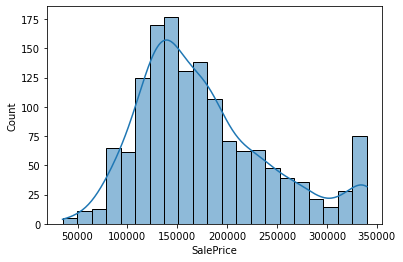

In [303]:
sns.histplot(df['SalePrice'],kde=True)
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


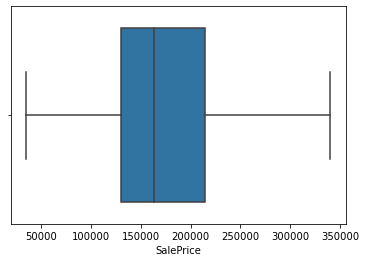

In [304]:
sns.boxplot(df['SalePrice'])
plt.show()

We see there is slight positive skewness, but it is near to normal distribution

In [305]:
#skewness and kurtosis
print("Skewness: %f" % df['SalePrice'].skew())

Skewness: 0.802786


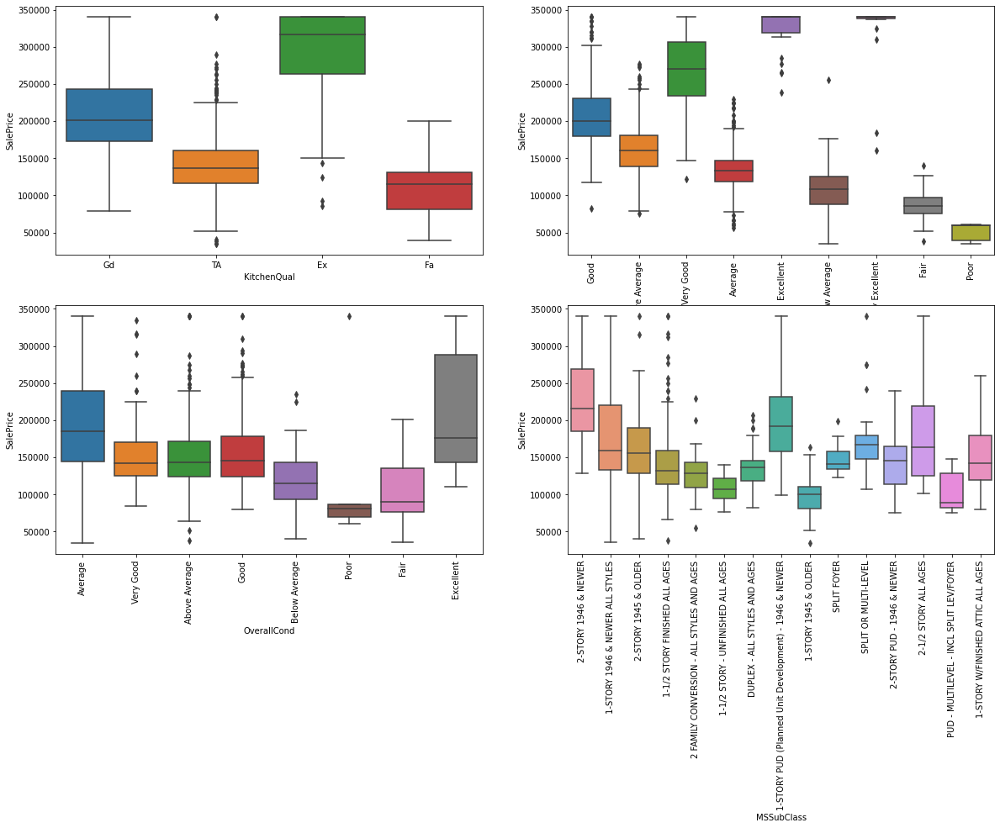

In [306]:
plt.figure(figsize=(20, 12))
plt.subplot(2,2,1)
sns.boxplot(x ='KitchenQual', y ='SalePrice', data = df)
plt.subplot(2,2,2)
sns.boxplot(x = 'OverallQual', y = 'SalePrice', data = df)
plt.xticks(rotation=90)

plt.subplot(2,2,3)
sns.boxplot(x = 'OverallCond', y = 'SalePrice', data = df)
plt.xticks(rotation=90)

plt.subplot(2,2,4)
sns.boxplot(x = 'MSSubClass', y = 'SalePrice', data = df)
plt.xticks(rotation=90)

plt.show()

In [307]:
# Dropping highly skewed column 
df.drop(['Utilities','Street','Condition1','Condition2'],axis=1,inplace=True)

In [308]:
# Dropping highly skewed column 
df.drop(['BsmtFinType2','PavedDrive','BsmtCond'],axis=1,inplace=True)


### Deriving Metrics

In [309]:
df['Age']=df['YrSold']-df['YearBuilt']
df['Age_from_Remodelling']=df['YrSold']-df['YearRemodAdd']
df['Year_to_Remodelling']=df['YearRemodAdd']-df['YearBuilt']
df['Age_From_Garage']=df['YrSold']-df['GarageYrBlt']

In [310]:
def calculate_age(x,y):
    if x>=y:
        return x-y
    return y-x

In [311]:
age=[]
for x,y in zip(df["YearBuilt"].tolist(),df["GarageYrBlt"].tolist()):
    age.append(calculate_age(x,y))

In [312]:
df['Garage_Built_Gap']=age

In [313]:
df.drop(["YearBuilt","YrSold","YearRemodAdd","GarageYrBlt"],axis=1,inplace=True)

In [314]:
df['Age'].value_counts(normalize=True).sort_values(ascending=False)

1     0.068493151
0     0.043835616
4     0.028082192
2     0.026712329
3     0.024657534
31    0.021232877
5     0.020547945
6     0.020547945
8     0.017123288
37    0.017123288
51    0.016438356
39    0.016438356
7     0.016438356
9     0.015753425
32    0.015753425
47    0.015753425
42    0.015068493
11    0.015068493
10    0.015068493
49    0.014383562
53    0.013698630
36    0.013698630
15    0.013698630
43    0.013013699
30    0.013013699
48    0.012328767
45    0.011643836
54    0.011643836
41    0.011643836
12    0.010958904
59    0.010958904
44    0.010958904
50    0.010958904
38    0.010958904
33    0.010273973
34    0.010273973
46    0.010273973
40    0.010273973
52    0.010273973
13    0.010273973
29    0.009589041
89    0.009589041
14    0.009589041
81    0.008904110
58    0.008904110
84    0.008904110
57    0.008219178
88    0.008219178
83    0.008219178
68    0.008219178
69    0.008219178
16    0.008219178
70    0.008219178
17    0.007534247
60    0.007534247
35    0.00

10% are sold within an year of making of property

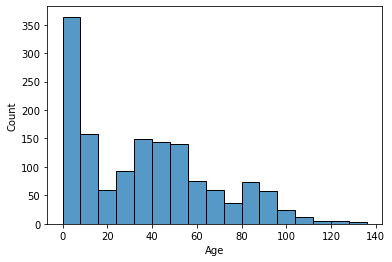

In [315]:
sns.histplot(df['Age'])
plt.show()

We see that there are 3 clusters of properties. List of clusters:

    - Newly Built and Sold : Properties within the age limit of 0 to 20 years
    - Mid Built Properties : Properties within the age limit over 20 to 70 years
    - Old Age Properties : Properties over 70 years of built

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


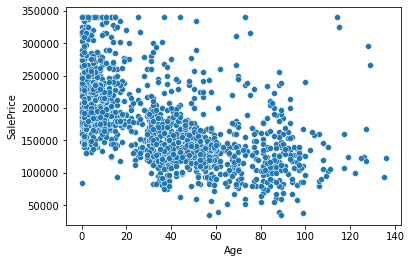

In [316]:
sns.scatterplot(df['Age'],df['SalePrice'])
plt.show()

We see non linearity in data , but there is descent negative correlation between age and selling price, as age of house increased their selling price decreased  

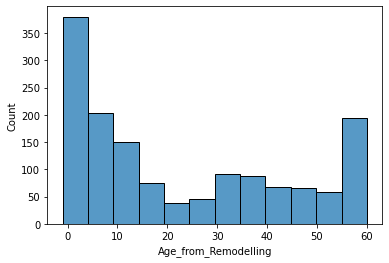

In [317]:
sns.histplot(df['Age_from_Remodelling'])
plt.show()

Most properties are sold within 20 years from their re-built, and then very old properties over 55 years 

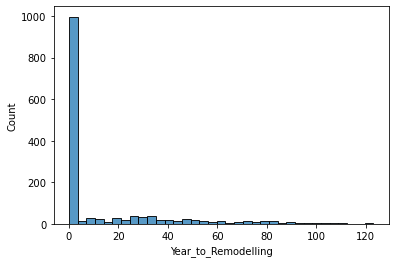

In [318]:
sns.histplot(df['Year_to_Remodelling'])
plt.show()

Most properties are rebuilt within 0 to 5 years

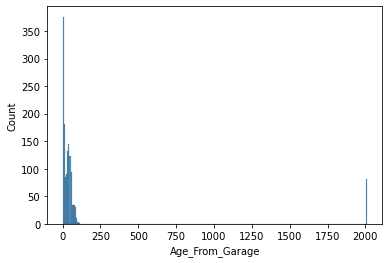

In [319]:
sns.histplot(df['Age_From_Garage'])
plt.show()

In [320]:
df.drop(['Age_From_Garage',"Garage_Built_Gap"],axis=1,inplace=True)

In [321]:
df.dtypes

Id                        int64
MSSubClass               object
MSZoning                 object
LotFrontage             float64
LotArea                 float64
Alley                    object
LotShape                 object
LandContour              object
LotConfig                object
LandSlope                object
Neighborhood             object
BldgType                 object
HouseStyle               object
OverallQual              object
OverallCond              object
RoofStyle                object
RoofMatl                 object
Exterior1st              object
Exterior2nd              object
MasVnrType               object
MasVnrArea              float64
ExterQual                object
ExterCond                object
Foundation               object
BsmtQual                 object
BsmtExposure             object
BsmtFinType1             object
BsmtFinSF1              float64
BsmtUnfSF               float64
TotalBsmtSF             float64
Heating                  object
HeatingQ

In [322]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Alley',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'WoodDeckSF',
       'OpenPorchSF', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition',
       'SalePrice', 'TotRmsAbvGrd_bracket', 'MoSold_Bracket', 'Age',
       'Age_from_Remodellin

In [323]:
categ_columns=['BsmtFullBath', 'BsmtHalfBath','FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars',]

In [324]:
df.loc[:,categ_columns]=df.loc[:,categ_columns].astype("object")

In [325]:
df.dtypes

Id                        int64
MSSubClass               object
MSZoning                 object
LotFrontage             float64
LotArea                 float64
Alley                    object
LotShape                 object
LandContour              object
LotConfig                object
LandSlope                object
Neighborhood             object
BldgType                 object
HouseStyle               object
OverallQual              object
OverallCond              object
RoofStyle                object
RoofMatl                 object
Exterior1st              object
Exterior2nd              object
MasVnrType               object
MasVnrArea              float64
ExterQual                object
ExterCond                object
Foundation               object
BsmtQual                 object
BsmtExposure             object
BsmtFinType1             object
BsmtFinSF1              float64
BsmtUnfSF               float64
TotalBsmtSF             float64
Heating                  object
HeatingQ

In [326]:
df.drop("Id",axis=1,inplace=True)

In [327]:
nonNum_cols=df.select_dtypes("object").columns.values

In [328]:
unique=[]
for i in nonNum_cols:
    if df[i].nunique()>2:
        unique.append(i)

In [329]:
df_dummies =pd.get_dummies(df[unique],drop_first=True)
df_concat = pd.concat([df.drop(unique,axis=1), df_dummies], axis=1)
df_concat.shape

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\algorithms.py:798: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  uniques = Index(uniques)


(1460, 253)

In [330]:
df_concat.head()

,LotFrontage,LotArea,RoofMatl,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,Age,Age_from_Remodelling,Year_to_Remodelling,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_1-STORY W/FINISHED ATTIC ALL AGES,MSSubClass_2 FAMILY CONVERSION - ALL STYLES AND AGES,MSSubClass_2-1/2 STORY ALL AGES,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_PUD - MULTILEVEL - INCL SPLIT LEV/FOYER,MSSubClass_SPLIT FOYER,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_Others,MSZoning_RL,MSZoning_RM,Alley_NA,Alley_Pave,LotShape_Other,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Other,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,RoofStyle_Hip,RoofStyle_Other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_None,MasVnrType_Other,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Wood & Stone,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,Heating_GasW,Heating_Other,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,Electrical_FuseF,Electrical_Other,Electrical_SBrkr,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,BsmtHalfBath_1,BsmtHalfBath_2,FullBath_1,FullBath_2,FullBath_3,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,Fireplaces_1,Fireplaces_2,Fireplaces_3,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,GarageCars_3.5,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,Garage

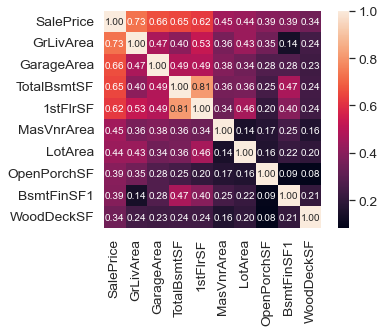

In [331]:
#saleprice correlation matrix
corrmat = df.corr()
k = 10 #number of variables for heatmap
cols = corrmat.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [332]:
df_concat.head()

,LotFrontage,LotArea,RoofMatl,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,2ndFlrSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,SalePrice,Age,Age_from_Remodelling,Year_to_Remodelling,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_1-STORY W/FINISHED ATTIC ALL AGES,MSSubClass_2 FAMILY CONVERSION - ALL STYLES AND AGES,MSSubClass_2-1/2 STORY ALL AGES,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_PUD - MULTILEVEL - INCL SPLIT LEV/FOYER,MSSubClass_SPLIT FOYER,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_Others,MSZoning_RL,MSZoning_RM,Alley_NA,Alley_Pave,LotShape_Other,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Other,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,RoofStyle_Hip,RoofStyle_Other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Other,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_None,MasVnrType_Other,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Wood & Stone,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,Heating_GasW,Heating_Other,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,Electrical_FuseF,Electrical_Other,Electrical_SBrkr,BsmtFullBath_1,BsmtFullBath_2,BsmtFullBath_3,BsmtHalfBath_1,BsmtHalfBath_2,FullBath_1,FullBath_2,FullBath_3,HalfBath_1,HalfBath_2,BedroomAbvGr_1,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_4,BedroomAbvGr_5,BedroomAbvGr_6,BedroomAbvGr_8,KitchenAbvGr_1,KitchenAbvGr_2,KitchenAbvGr_3,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,TotRmsAbvGrd_3,TotRmsAbvGrd_4,TotRmsAbvGrd_5,TotRmsAbvGrd_6,TotRmsAbvGrd_7,TotRmsAbvGrd_8,TotRmsAbvGrd_9,TotRmsAbvGrd_10,TotRmsAbvGrd_11,TotRmsAbvGrd_12,TotRmsAbvGrd_14,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,Fireplaces_1,Fireplaces_2,Fireplaces_3,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,GarageCars_1.0,GarageCars_2.0,GarageCars_3.0,GarageCars_3.5,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,Garage

In [333]:
num_cols=["LotFrontage","LotArea","MasVnrArea","BsmtFinSF1","BsmtUnfSF","TotalBsmtSF","1stFlrSF","2ndFlrSF","GrLivArea","GarageArea","WoodDeckSF","OpenPorchSF","Age","Age_from_Remodelling",
"Year_to_Remodelling"]

In [334]:
df_concat['RoofMatl'].replace({'CompShg':1,'Other':0},inplace=True)
df_concat['CentralAir'].replace({'Y':1,'N':0},inplace=True)

In [335]:
y=df_concat[['SalePrice']]
X=df_concat.drop("SalePrice",axis=1)

In [336]:
x_train, x_test, y_train, y_test = tts(X, y, test_size=0.2, random_state=2)

In [337]:
#Resetting the index
x_train.reset_index(drop=True,inplace=True)
x_test.reset_index(drop=True,inplace=True)
y_train.reset_index(drop=True,inplace=True)
y_test.reset_index(drop=True,inplace=True)

In [338]:
#Scaling the data - Independent variables
scaler=StandardScaler()
x_scaled_tr=scaler.fit_transform(x_train.loc[:,num_cols])
x_scaled_tr=pd.DataFrame(x_scaled_tr,columns=num_cols)
x_scaled_tr=pd.concat([x_train.drop(num_cols,axis=1),x_scaled_tr],axis=1)
x_scaled_test=scaler.transform(x_test.loc[:,num_cols])
x_scaled_test=pd.DataFrame(x_scaled_test,columns=num_cols)
x_scaled_test=pd.concat([x_test.drop(num_cols,axis=1),x_scaled_test],axis=1)


In [339]:
#Scaling the data - Dependent Variable
scaler=StandardScaler()
y_scaled_tr=pd.DataFrame(scaler.fit_transform(y_train),columns=["SalePrice"])
y_scaled_test=pd.DataFrame(scaler.transform(y_test),columns=["SalePrice"])

In [340]:
x_scaled_tr.shape,x_scaled_test.shape

((1168, 252), (292, 252))

#### Baseline Model

In [341]:
#Model Object & Fitting - defining baseline model 
lm  = LinearRegression()
lm.fit(x_scaled_tr,y_scaled_tr)

LinearRegression()

In [342]:
#Predicting on train data
y_train_p=pd.DataFrame(lm.predict(x_scaled_tr),columns=["SalePrice"])

In [343]:
#R-square is 94% , i.e model is able to capture 94% of variation in the data it is trained on
base_train_r_square=metrics.r2_score(y_scaled_tr,y_train_p)

In [344]:
#Mean Squared Error is also very less
base_train_mse=metrics.mean_squared_error(y_scaled_tr,y_train_p)

In [345]:
#Predicting on test data
y_test_p=pd.DataFrame(lm.predict(x_scaled_test),columns=["SalePrice"])
#We see R-Square is Very high negative value , because model is not fitting it well , it is overfitting which is evident
base_test_r_square=metrics.r2_score(y_scaled_test,y_test_p)


In [346]:
#Mean Square error on test set is very high
base_test_mse=metrics.mean_squared_error(y_scaled_test,y_test_p)

#### Selecting top N variables of 252

In [347]:
lm  = LinearRegression()
rfe = RFE(estimator=lm,n_features_to_select=33)
rfe.fit(x_scaled_tr.drop('GarageCond_Fa',axis=1),y_scaled_tr)
rfe_scores = pd.DataFrame(list(zip(x_scaled_tr.columns,rfe.support_,rfe.ranking_)),columns=["Columns","support_","ranking_"])

In [348]:
Cols=rfe_scores[rfe_scores.support_==True].Columns.values
lm  = LinearRegression()
lm.fit(x_scaled_tr.loc[:,Cols],y_scaled_tr)
#Predicting on train data
y_train_p=pd.DataFrame(lm.predict(x_scaled_tr.loc[:,Cols]),columns=["SalePrice"])

In [349]:
#R-square is 76% , i.e model is able to capture 76% of variation in the data it is trained on
metrics.r2_score(y_scaled_tr,y_train_p)

0.7515194410186833

In [350]:
#Mean Squared Error is also very less
metrics.mean_squared_error(y_scaled_tr,y_train_p)

0.2484805589813167

In [351]:
#Predicting on test data
y_test_p=pd.DataFrame(lm.predict(x_scaled_test.loc[:,Cols]),columns=["SalePrice"])


In [352]:
#We see R-Square is 71% on test data , which means model is able to capture 71% of variation in test data
metrics.r2_score(y_scaled_test,y_test_p)

0.7108488433442627

In [353]:
#Mean Square error on test set is very high
metrics.mean_squared_error(y_scaled_test,y_test_p)

0.3119892566535442

**This model have certainly significantly improved from the baseline model. It is not overfitting and underfitting . On an average model is able to capture 73% of variation in the data.** 

We can further try improving the model

In [354]:
lm  = LinearRegression()
rfe = RFE(estimator=lm)
hyper_param = {'n_features_to_select':[10, 20, 30,35, 40, 50,55,60]}
folds = KFold(n_splits=10,shuffle=True,random_state=100)
model_cv = GridSearchCV(estimator = rfe,
                        param_grid=hyper_param,
                        scoring='r2',
                        cv=folds,
                        verbose=1,
                        return_train_score=True
                       )
model_cv.fit(x_scaled_tr,y_scaled_tr)

Fitting 10 folds for each of 8 candidates, totalling 80 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=100, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid={'n_features_to_select': [10, 20, 30, 35, 40, 50, 55,
                                                  60]},
             return_train_score=True, scoring='r2', verbose=1)

In [355]:
model_cv.get_params

<bound method BaseEstimator.get_params of GridSearchCV(cv=KFold(n_splits=10, random_state=100, shuffle=True),
             estimator=RFE(estimator=LinearRegression()),
             param_grid={'n_features_to_select': [10, 20, 30, 35, 40, 50, 55,
                                                  60]},
             return_train_score=True, scoring='r2', verbose=1)>

In [356]:
cv_result_train_rfe = pd.DataFrame(model_cv.cv_results_)

In [357]:
cv_result_train_rfe

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,1.017205691,0.016433937,0.003426886,0.006167793,10,{'n_features_to_select': 10},0.528572059,0.386839503,0.158380248,0.490110076,0.438535837,0.408830593,0.380825912,0.337059873,0.690990127,0.335997704,0.415614193,0.132449808,1,0.610458853,0.405377127,0.288713264,0.394275097,0.402369008,0.544369207,0.353204312,0.272960215,0.597636794,0.407032141,0.427639602,0.112865697
1,1.000781918,0.015888422,0.002651119,0.004850110,20,{'n_features_to_select': 20},0.593321703,-1790690853931332665344.000000000,0.679549236,-51751170858210205696.000000000,-12075184511806400512.000000000,0.540704000,0.714592620,-55432791307370534797312.000000000,-37382641739689238528.000000000,-35524736662265069568.000000000,-5736021589507384016896.000000000,16574036842515116589056.000000000,2,0.655959916,0.687146177,0.678569987,0.729989148,0.678054415,0.657946531,0.713759069,0.456013905,0.706751879,0.682236089,0.664642712,0.073001191
2,1.019163895,0.029852975,0.002213168,0.004873539,30,{'n_features_to_select': 30},0.810264717,-28459955718040902959104.000000000,0.668270982,-14867981639785329459200.000000000,-911431885106183.250000000,0.573317599,0.704997207,-176486584930193939365888.000000000,-95085340626589822484480.000000000,-2625152546947094528.000000000,-31490248897858881191936.000000000,55949445815228067479552.000000000,4,0.824007427,0.751130461,0.681267696,0.736901385,0.752409079,0.740818812,0.716990852,0.681320629,0.736849957,0.746155434,0.736785173,0.038356259
3,1.008396697,0.020006039,0.001562572,0.004687715,35,{'n_features_to_select': 35},0.841399009,-4138857452604533516533760.000000000,0.623833251,-49282480503684614586368.000000000,-4303518384316087019765760.000000000,-854945303681904.125000000,0.316321339,-421000027832448312147968.000000000,-426094222726147350724608.000000000,-35859841313499222016.000000000,-933878842867915935449088.000000000,1651978832788407768317952.000000000,6,0.827099036,0.750207305,0.658505680,0.743930756,0.752731881,0.710049952,0.582343325,0.689469715,0.743392938,0.747207619,0.720493821,0.062509040
4,1.020360970,0.027721934,0.000000000,0.000000000,40,{'n_features_to_select': 40},0.862906950,-108000777654187474288640.000000000,0.745580893,-11525202550837578475503616.000000000,-1676496883020752847110144.000000000,-379990498333385868443648.000000000,0.741846526,-817368412870156685934592.000000000,-114230470773547760353280.000000000,-37301021820031713935360.000000000,-1465859061530963965116416.000000000,3391048448337539743350784.000000000,7,0.863469207,0.754709421,0.750774574,0.715853264,0.810872008,0.463164627,0.771231015,0.741889174,0.734761666,0.750944065,0.735766902,0.099381991
5,0.998566198,0.013304329,0.001550531,0.004651594,50,{'n_features_to_select': 50},-272148938690321678336.000000000,-873314966977050478379008.000000000,0.798921487,-8845872801967157448540160.000000000,-16890814223894353920.000000000,-8528238132450914467840.000000000,0.871879608,-8511726778868887415947264.000000000,-118249842638952.125000000,-4301052452738349137920.000000000,-1824403287826944665583616.000000000,3437691887824629814788096.000000000,8,0.862730462,0.833001972,0.853882177,0.811855967,0.875306899,0.298505386,0.872620104,0.761978907,0.844798209,0.658570788,0.767325087,0.168311603
6,0.997572088,0.017492854,0.004687786,0.007160712,55,{'n_features_to_select': 55},-6733345599861116895232.000000000,-7736676997905357209600.000000000,0.822317153,-322136986034181783945216.000000000,-799192628918638739456.000000000,-299746

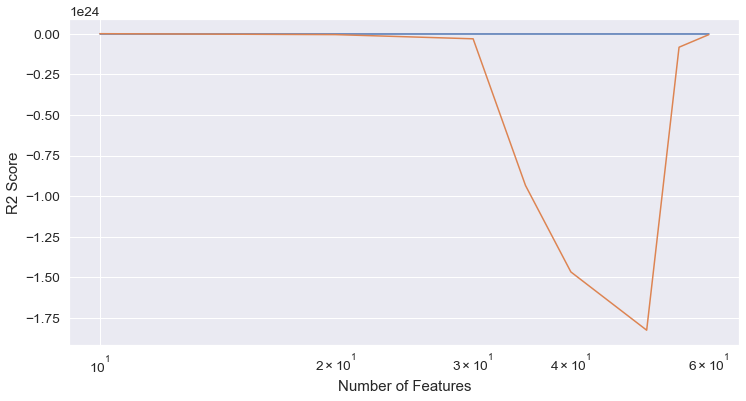

In [358]:
def r2_score(cv_result, is_log=False):
    plt.figure(figsize=(12,6))
    plt.plot(cv_result['param_n_features_to_select'], cv_result['mean_train_score'])
    plt.plot(cv_result['param_n_features_to_select'], cv_result['mean_test_score'])
    if is_log == True:
        plt.xscale('log')
    plt.ylabel('R2 Score')
    plt.xlabel('Number of Features')
    plt.show()
r2_score(cv_result_train_rfe, True)

In [359]:
lm  = LinearRegression()
rfe = RFE(estimator=lm,n_features_to_select=10)
rfe.fit(x_scaled_tr.drop('GarageCond_Fa',axis=1),y_scaled_tr)
rfe_scores = pd.DataFrame(list(zip(x_scaled_tr.columns,rfe.support_,rfe.ranking_)),columns=["Columns","support_","ranking_"])

In [360]:
Cols=rfe_scores[rfe_scores.support_==True].Columns.values
lm  = LinearRegression()
lm.fit(x_scaled_tr.loc[:,Cols],y_scaled_tr)
#Predicting on train data
y_train_p=pd.DataFrame(lm.predict(x_scaled_tr.loc[:,Cols]),columns=["SalePrice"])

In [361]:
#R-square is 61% , i.e model is able to capture 61% of variation in the data it is trained on
rfe_base_train_r_square=metrics.r2_score(y_scaled_tr,y_train_p)

In [362]:
#Mean Squared Error is also very less
rfe_base_train_mse=metrics.mean_squared_error(y_scaled_tr,y_train_p)

In [363]:
#Predicting on test data
y_test_p=pd.DataFrame(lm.predict(x_scaled_test.loc[:,Cols]),columns=["SalePrice"])
#We see R-Square is 61% on test data , which means model is able to capture 71% of variation in test data
rfe_base_test_r_square=metrics.r2_score(y_scaled_test,y_test_p)

In [364]:
#Mean Square error on test set is very high
rfe_base_test_mse=metrics.mean_squared_error(y_scaled_test,y_test_p)

Using cross validation we found that the model with 33 features to select , though it worked well on the given test set, but it would not perform best on other futeristic unseen data. Hence best estimator is with only 10 selected features . Though it won't give best result , it will just cover approx 60% of variation in data

### Lasso

In [365]:
model = Lasso(alpha=.001)
model.fit(x_scaled_tr,y_scaled_tr)

Lasso(alpha=0.001)

In [366]:
#Predicting on train data
y_train_p=pd.DataFrame(model.predict(x_scaled_tr),columns=["SalePrice"])

In [367]:
#R-square is 93% , i.e model is able to capture 93% of variation in the data it is trained on
lasso_train_r_square=metrics.r2_score(y_scaled_tr,y_train_p)

In [368]:
#Mean Squared Error is also very less
lasso_train_mse=metrics.mean_squared_error(y_scaled_tr,y_train_p)

In [369]:
#Predicting on test data
y_test_p=pd.DataFrame(model.predict(x_scaled_test),columns=["SalePrice"])
#We see R-Square is 92%, which means it captures 92% variation in unseen data
lasso_test_r_square=metrics.r2_score(y_scaled_test,y_test_p)


In [370]:
#Mean Square error on test set is low
lasso_test_mse=metrics.mean_squared_error(y_scaled_test,y_test_p)

In [371]:
variable_importance=pd.DataFrame(zip(x_scaled_tr.columns.values,model.coef_),columns=["Columns","Coef_"])

In [372]:
variable_importance.sort_values(by="Coef_",ascending=False,inplace=True)

In [373]:
variable_importance

,Columns,Coef_
66,OverallQual_Excellent,0.686454455
71,OverallQual_Very Good,0.423131081
245,GrLivArea,0.357730382
74,OverallCond_Excellent,0.270432555
36,Neighborhood_Crawfor,0.270131420
46,Neighborhood_NridgHt,0.268096560
45,Neighborhood_NoRidge,0.218958279
81,Exterior1st_BrkFace,0.207148839
52,Neighborhood_StoneBr,0.206135104
51,Neighborhood_Somerst,0.191435593


Most important variables affecting the selling price are OverallQual_Excellent,OverallQual_Very_Good,GrLivArea,OverallCond_Excellent,Neighborhood_Crawfor,TotalBsmtSF,TotRmsAbvGrd_12,Age,OverallCond_Below Average

Though we did not see any issue, and feel that with lasso regression this is the optimal model, still we would like to explore some more parameter values

In [374]:
folds = KFold(n_splits=10,shuffle=True,random_state=100)

hyper_param = {'alpha':[.0005,0.001,.005, 0.01, 0.1,1.0, 5.0, 10.0,20.0]}

model = Lasso()

model_cv = GridSearchCV(estimator = model,
                        param_grid=hyper_param,
                        scoring='r2',
                        cv=folds,
                        verbose=1,
                        return_train_score=True
                       )
model_cv.fit(x_scaled_tr,y_scaled_tr)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=100, shuffle=True),
             estimator=Lasso(),
             param_grid={'alpha': [0.0005, 0.001, 0.005, 0.01, 0.1, 1.0, 5.0,
                                   10.0, 20.0]},
             return_train_score=True, scoring='r2', verbose=1)

In [375]:
cv_result_train_lasso = pd.DataFrame(model_cv.cv_results_)
cv_result_train_lasso['param_alpha'] = cv_result_train_lasso['param_alpha'].astype('float32')
cv_result_train_lasso.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.035154915,0.011004815,0.003252625,0.004838257,0.000500000,{'alpha': 0.0005},0.942438731,0.909048776,0.903727852,0.885386368,0.894240267,0.867523157,0.923955306,0.925324544,0.895735997,0.854177649,0.900155865,0.025556050,2,0.933551343,0.936529299,0.936717275,0.937870852,0.937888644,0.937644861,0.935328580,0.935046579,0.938896699,0.939426874,0.936890101,0.001735930
1,0.028249836,0.013644279,0.001563644,0.004690933,0.001000000,{'alpha': 0.001},0.940723473,0.909820087,0.907322470,0.889417601,0.907138910,0.867728969,0.925164451,0.929166612,0.901166077,0.854152759,0.903180141,0.025493061,1,0.928779231,0.931483794,0.931812615,0.932258133,0.932473283,0.932803859,0.930432820,0.930154385,0.933551502,0.935051155,0.931880078,0.001704318
2,0.013055062,0.005514631,0.002417636,0.005168831,0.005000000,{'alpha': 0.005},0.921169413,0.890969652,0.894020281,0.884712202,0.902373661,0.831622792,0.916084793,0.925138629,0.896301543,0.848900202,0.891129317,0.028651162,3,0.902143234,0.905784848,0.905642984,0.908158939,0.905117729,0.910553545,0.904116411,0.901928243,0.905718356,0.909303497,0.905846779,0.002685281
3,0.009456420,0.006855390,0.000000000,0.000000000,0.010000000,{'alpha': 0.01},0.895994071,0.874566415,0.867435669,0.882448500,0.887419202,0.799190017,0.895778213,0.909935376,0.883088381,0.816139295,0.871199514,0.033901048,4,0.880340835,0.884474130,0.884055079,0.885716881,0.884143124,0.889166807,0.881577741,0.878629142,0.882680141,0.886501099,0.883728498,0.002919850
4,0.004006624,0.006097426,0.003326893,0.006182138,0.100000001,{'alpha': 0.1},0.785837947,0.792349391,0.759357842,0.815393758,0.806628689,0.736111040,0.825111387,0.817161005,0.800357648,0.740801626,0.787911033,0.030400351,5,0.794140485,0.796553967,0.798374779,0.793138879,0.796376186,0.804800212,0.793841102,0.789361196,0.789467050,0.803365222,0.795941908,0.004907161


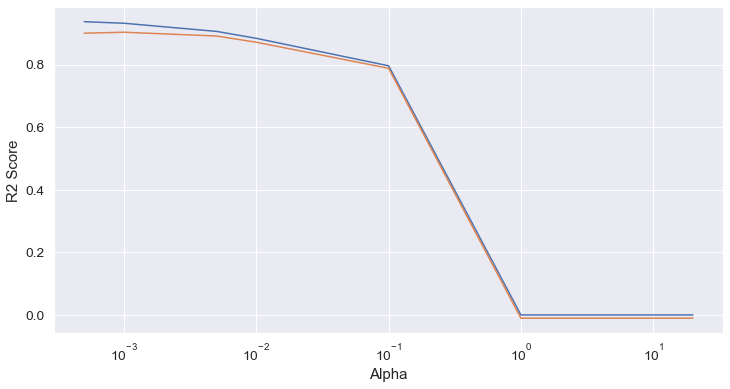

In [376]:
def r2_score(cv_result, is_log=False):
    plt.figure(figsize=(12,6))
    plt.plot(cv_result['param_alpha'], cv_result['mean_train_score'])
    plt.plot(cv_result['param_alpha'], cv_result['mean_test_score'])
    if is_log == True:
        plt.xscale('log')
    plt.ylabel('R2 Score')
    plt.xlabel('Alpha')
    plt.show()
r2_score(cv_result_train_lasso, True)

In [377]:
print('For Lasso, the Best Alpha value = ', model_cv.best_params_['alpha'])

For Lasso, the Best Alpha value =  0.001


This validtes the above built model is optimal as on different unseen folds model performed equally good.

### Ridge

In [378]:
#Ridge
ridge = Ridge(alpha=0.001)
ridge.fit(x_scaled_tr,y_scaled_tr)

# train score
y_train_pred = ridge.predict(x_scaled_tr)
print(metrics.r2_score(y_scaled_tr, y_train_pred))

# test score
y_test_pred = ridge.predict(x_scaled_test)
print(metrics.r2_score(y_scaled_test, y_test_pred))

0.9416190886590649
0.8887903048752881


We see at same alpha as above with lasso , there is difference in train and test r-square compared to lasso 

In [379]:
folds = KFold(n_splits=10,shuffle=True,random_state=100)

hyper_param = {'alpha':[.0005,0.001,.005, 0.01, 0.1,1.0, 5.0, 10.0,20.0]}

model = Ridge()

model_cv = GridSearchCV(estimator = model,
                        param_grid=hyper_param,
                        scoring='r2',
                        cv=folds,
                        verbose=1,
                        return_train_score=True
                       )
model_cv.fit(x_scaled_tr,y_scaled_tr)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=KFold(n_splits=10, random_state=100, shuffle=True),
             estimator=Ridge(),
             param_grid={'alpha': [0.0005, 0.001, 0.005, 0.01, 0.1, 1.0, 5.0,
                                   10.0, 20.0]},
             return_train_score=True, scoring='r2', verbose=1)

In [380]:
cv_result_train_ridge = pd.DataFrame(model_cv.cv_results_)
cv_result_train_ridge['param_alpha'] = cv_result_train_ridge['param_alpha'].astype('float32')
cv_result_train_ridge

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.005668879,0.005455370,0.002262735,0.004538611,0.000500000,{'alpha': 0.0005},0.937112450,0.878886510,0.877618124,0.862357041,0.866562941,0.860754906,0.920069006,0.909448111,0.877542171,0.850558976,0.884091024,0.027035373,9,0.940517956,0.943052756,0.943963443,0.943731903,0.944643264,0.943890521,0.941680018,0.942064068,0.946203518,0.945619475,0.943536692,0.001672803
1,0.004776740,0.005017615,0.002862883,0.004725153,0.001000000,{'alpha': 0.001},0.937115874,0.879026748,0.877633819,0.862389857,0.866572942,0.860754509,0.920089689,0.909536251,0.877566814,0.850604253,0.884129075,0.027034556,8,0.940517869,0.943052707,0.943963366,0.943731858,0.944643183,0.943890427,0.941679915,0.942063963,0.946203409,0.945619374,0.943536607,0.001672801
2,0.004714775,0.006012872,0.003125000,0.006250000,0.005000000,{'alpha': 0.005},0.937140570,0.880113192,0.877757400,0.862647257,0.866652630,0.860741157,0.920246597,0.910179631,0.877752921,0.850914849,0.884414620,0.027031399,7,0.940515299,0.943051201,0.943961032,0.943730552,0.944640783,0.943887672,0.941676842,0.942060850,0.946200199,0.945616421,0.943534085,0.001672752
3,0.004687953,0.007160967,0.002962995,0.005937077,0.010000000,{'alpha': 0.01},0.937166718,0.881387586,0.877906941,0.862957054,0.866751702,0.860705197,0.920423481,0.910856185,0.877962171,0.851199681,0.884731672,0.027034228,6,0.940508183,0.943046817,0.943954398,0.943727019,0.944634039,0.943880117,0.941668249,0.942052178,0.946191373,0.945608431,0.943527080,0.001672663
4,0.006250620,0.007655415,0.001562595,0.004687786,0.100000001,{'alpha': 0.1},0.937658354,0.894696221,0.880014250,0.867053347,0.868552802,0.859593680,0.921911727,0.915328980,0.880150471,0.851484854,0.887644469,0.027366081,5,0.940169927,0.942768862,0.943605819,0.943565850,0.944294641,0.943538824,0.941257341,0.941640294,0.945793205,0.945281290,0.943191605,0.001680511
5,0.003675556,0.006193051,0.001562619,0.004687858,1.000000000,{'alpha': 1.0},0.941655062,0.907522384,0.890860376,0.877599660,0.881476208,0.857160389,0.923009908,0.920509583,0.888135238,0.850663858,0.893859267,0.027754715,4,0.938001332,0.940683816,0.941434276,0.942056376,0.942084600,0.941644258,0.939091255,0.939389719,0.943444411,0.943576773,0.941140681,0.001750464
6,0.004788566,0.007101261,0.001500297,0.004500890,5.000000000,{'alpha': 5.0},0.942214871,0.910199523,0.905776363,0.884936460,0.899599863,0.851804252,0.924728272,0.925841220,0.897351661,0.848011474,0.899046396,0.029067810,2,0.933654113,0.936630588,0.937059572,0.938123284,0.937415070,0.938096362,0.935096238,0.935053355,0.938806478,0.939811884,0.936974694,0.001804118
7,0.006288671,0.006835101,0.003125429,0.006250858,10.000000000,{'alpha': 10.0},0.939219331,0.909565156,0.911079368,0.887972545,0.906235414,0.845490104,0.925184700,0.927696156,0.900258547,0.842195603,0.899489692,0.031060307,1,0.929604464,0.932581505,0.932842749,0.934151204,0.933082037,0.934692835,0.931139161,0.930784883,0.934404476,0.936178136,0.932946145,0.001906326
8,0.004988194,0.007019452,0.003125405,0.006250811,20.000000000,{'alpha': 20.0},0.933080045,0.906036412,0.913027835,0.890581389,0.909800637,0.835660819,0.924320902,0.927926216,0.900935702,0.832975586,0.897434554,0.033798606,3,0.923140011,0.925984020,0.926020175,0.927558364,0.926236633,0.929112446,0.924616235,0.923826018,0.927340352,0.930381959,0.926421621,0.002149732


In [381]:
#Ridge
ridge = Ridge(alpha=10)
ridge.fit(x_scaled_tr,y_scaled_tr)

# train score
y_train_pred = ridge.predict(x_scaled_tr)
ridge_train_r_square=metrics.r2_score(y_scaled_tr, y_train_pred)
ridge_train_mse=metrics.mean_squared_error(y_scaled_tr, y_train_pred)

# test score
y_test_pred = ridge.predict(x_scaled_test)
ridge_test_r_square=metrics.r2_score(y_scaled_test, y_test_pred)
ridge_test_mse=metrics.mean_squared_error(y_scaled_test, y_test_pred)

### Conclusion

In [382]:
model_scores={"Ridge_Train_Rsq":[ridge_train_r_square],"Ridge_Test_Rsq":ridge_test_r_square,"Ridge_train_MSE":ridge_train_mse,"Ridge_test_MSE":ridge_test_mse,
            "Lasso_Train_Rsq":lasso_train_r_square,"Lasso_Train_MSE":lasso_train_mse,'Lasso_Test_Rsq':lasso_test_r_square,"Lasso_Test_MSE":lasso_test_mse,
            "RFE_Train_Rsq":rfe_base_train_r_square,"RFE_Train_MSE":rfe_base_train_mse,"RFE_Test_MSE":rfe_base_test_mse,
            "LM_Train_Rsq":base_train_r_square,"LM_Test_Rsq":base_test_r_square,"LM_Train_MSE":base_train_mse,"LM_Test_MSE":round(base_test_mse,5)}

In [384]:
model_scores=pd.DataFrame(model_scores,index=["values"]).T

In [385]:

model_scores

,values
Ridge_Train_Rsq,0.932060325
Ridge_Test_Rsq,0.920870694
Ridge_train_MSE,0.067939675
Ridge_test_MSE,0.085379196
Lasso_Train_Rsq,0.930179561
Lasso_Train_MSE,0.069820439
Lasso_Test_Rsq,0.922694274
Lasso_Test_MSE,0.083411584
RFE_Train_Rsq,0.605345492
RFE_Train_MSE,0.394654508


**When we compare ridge and lasso performance, there is no significant difference, both are performing well on training and unseen data. We choose lasso so that we have feature importance also**